In [1]:
import numpy as np
import pandas as pd
import datetime
import random
import pickle
import matplotlib.pyplot as plt
import time as tim
from IPython.display import clear_output
import copy

In [2]:
# 한시간 간격으로 전체 bss에서 호출 나머지는 1과 동일

In [3]:
# # 피클 저장, 로드
# # save
# with open('data.pickle', 'wb') as f:
#     pickle.dump(data, f, pickle.HIGHEST_PROTOCOL)

# # load
# with open('data.pickle', 'rb') as f:
#     data = pickle.load(f)

In [4]:
day_n = 2

bike_n = 300
D_size = 42*bike_n*10
# D_terminal_size = 42*bike_n*10


qrate = 0.99
exploration_rate = 0.01
max_w_i = 1
beta = 0.4
beta_zero = 1

base_freq=[1.526, 6.256, 7.91, 6.541, 5.402, 5.005, 5.919, 10.07, 15.597, 15.458, 11.61, 8.707] # 주문발생빈도 쌍봉형
day_avg = [60, 56, 52, 48, 44, 40, 35, 31, 27, 23] # 하루 평균 주문건수 n그룹
char_rule=[30, 24, 20, 15, 10] # 배터리 교환 규칙
# 10 25 50 85 100

fit_count=0

time_char_rule=[]

hochool_gijoon = 50 # 호출하는 바이크 배터리 기준
gaa = 0.4
order_limit_r=1500

bss_n = 30 # 고정
interval_sigma = 300 # 배달간격 표준편차 (초단위)
dist_sigma = 300 # 미터단위 배달거리의 표준편차
velo = 40000/3600 # 이륜차 평균속도
velo_sigma = 2 # 이륜차 속도의 표준편차
gene_hyper = 3100
bat_max_wh = 1850 # 배터리 1팩 기준 wh / 1 cycle => 247 감소
bat_max_dist = 35000 # 한 팩 당 총 이동거리
bat_somo = bat_max_wh/bat_max_dist
cycle_loss = 0.247
best_episode_reward=0
TD_error_list=np.array([])
TD_max=1
epsilon = 0.0001

delivery_reward = 10000
n_sample = 48

history = []
pred_ub = []
pred_lb = []
%matplotlib inline

In [5]:
# from keras.callbacks import Callback
# class CustomHistory(Callback):
#     def init(self):
#         self.losses = []
#         self.vol_losses = []
#         self.accs = []
#         self.vol_accs = []        
        
#     def on_epoch_end(self, batch, logs={}):
#         self.losses.append(logs.get('loss'))
# #         self.vol_losses.append(logs.get('vol_loss'))
# #         self.accs.append(logs.get('acc'))
# #         self.vol_accs.append(logs.get('acc_loss'))

## MLP

## CNN

In [6]:
from tensorflow.keras import backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Conv1D, Flatten, concatenate, Lambda, Add, Activation, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def resnet_block(input_tensor, filters, kernel_size=3, strides=1):
    x = Conv1D(filters, kernel_size, strides=strides, padding='same')(input_tensor)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    x = Conv1D(filters, kernel_size, strides=1, padding='same')(x)
    x = BatchNormalization()(x)

    shortcut = Conv1D(filters, 1, strides=strides, padding='same')(input_tensor)
    shortcut = BatchNormalization()(shortcut)
    
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

def make_model():

    def custom_loss(y_true, y_pred):

        c = tf.math.multiply(y_pred, y_true)
        d = tf.math.square(c)
        out = tf.math.reduce_mean(d, axis=None)
        # out =  tf.math.square(tf.math.multiply(tf.math.add(y_pred, tf.math.negative(delta)), y_true))
        return out
    # 딥러닝 모델
    #         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)
    delta = Input(shape=(1,))
    mask = Input(shape=(31,))

    important_state = Input(shape=(34,),name='important_state')

    bss_state = Input(shape=(120,),name='bss_state')

    other_bike_state = Input(shape=(1,),name='other_bike_state')


    concatenated = concatenate([important_state,bss_state,other_bike_state])

    # concatenated = Lambda(lambda x: K.expand_dims(x,axis=2))(concatenated)
    concatenated = tf.keras.layers.Reshape((155, 1), input_shape = (155,))(concatenated)


    x = resnet_block(concatenated, filters=32, kernel_size=4, strides=1)
    x = resnet_block(x, filters=64, kernel_size=4, strides=1)
    x = resnet_block(x, filters=64, kernel_size=4, strides=1)
    x1 = Conv1D(filters=2,kernel_size=4, strides=1, activation = 'relu')(x)
    x1 = Flatten()(x1)
#         x = concatenate([x,important_state])

    x1 = Dense(100,activation='relu')(x1)
    x2 = Conv1D(filters=2,kernel_size=4, strides=1, activation = 'relu')(x)
    x2 = Flatten()(x2)
    x2 = Dense(100,activation='relu')(x2)

    advantage = Dense(31)(x1)
    value = Dense(1)(x2)

    policy = Lambda(lambda x: x[0]-K.mean(x[0],keepdims=True)+x[1])([advantage, value])
    policy = Lambda(lambda x: x[0]+x[1])([policy, mask])
    a = tf.math.negative(delta)
    b = tf.math.add(policy, a)


    model = Model([important_state,bss_state,other_bike_state, mask],[policy])
    train_model = Model([important_state,bss_state,other_bike_state,mask,delta],[b])
    train_model.compile(optimizer = Adam(learning_rate=0.00005), loss=[custom_loss])

    # # opti =  RMSprop(lr=0.001, rho=0.9, epsilon=None, decay=0.0)

    model.compile(optimizer='rmsprop',loss=['mse'])
    return model, train_model
model, train_model = make_model()
model2, train_model2 = make_model()

model.summary()

2024-07-18 16:53:46.348820: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-07-18 16:53:46.358903: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-07-18 16:53:46.358936: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.
2024-07-18 16:53:49.020811: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could not open file to read NUMA node: /sys/bus/pci/devices/0000:3b:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-07-18 16:53:49.020983: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:961] could

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 important_state (InputLayer)   [(None, 34)]         0           []                               
                                                                                                  
 bss_state (InputLayer)         [(None, 120)]        0           []                               
                                                                                                  
 other_bike_state (InputLayer)  [(None, 1)]          0           []                               
                                                                                                  
 concatenate (Concatenate)      (None, 155)          0           ['important_state[0][0]',        
                                                                  'bss_state[0][0]',          

In [7]:
# class ReplayBuffer():
#     def __init__(self, size):
#         self._storage = []
#         self._maxsize = size
#         self._next_idx = 0
        
#         it_capacity = 1
#         while it_capacity < size:
#             it_capacity *= 2
#         self._it_sum = SumSegmentTree(it_capacity)
#         self._it_min = MinSegmentTree(it_capacity)
#         self._max_priority = 1.0
        
#     def add(self, s1, a, r, s2, terminal):
        
#         self._it_sum[self._next_idx] = self._max_priority ** self._alpha
#         self._it_min[self._next_idx] = self._max_priority ** self._alpha
        
#         self._next_idx = (self._next_idx + 1) % self._maxsize
        
#     def _sample_proportional(self, batch_size):
#         mass = []
#         total = self._it_sum.sum(0, len(self._storage)-1)
#         mass = np.random.random(size=batch_size)*total
#         idx = self._it_sum.find_prefixsum_idx(mass)
#         return idx
    
#     def sample(self, batch_size, beta = 0, env: Optional[VecNormalize] = None):

#         idxes = self._sample_proportional(batch_size)
        
#         weights = []
#         p_min = self._it_min.min() / self._it_sum.sum()
#         max_weight = (p_min * len(self._storage)) ** (-beta)
#         p_sample = self._it_sum[idxes] / self._it_sum.sum()
#         weights = (p_sample * len(self._storage)) ** (-beta) / max_weight
#         return weights, idxes

#     def update_priorities(self, idxes, priorities):

#         self._it_sum[idxes] = priorities ** self._alpha
#         self._it_min[idxes] = priorities ** self._alpha

#         self._max_priority = max(self._max_priority, np.max(priorities))

In [8]:
from tensorflow.keras.models import load_model


def model_fit():
    global fit_count, model2, beta
#         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)

#     if fit_count%10000==0:
#         if fit_count < 1000000:
#             print('model updated')
#             model2.set_weights(model.get_weights())
#         if fit_count%100000==0:
#             with open('D_memory(230).pickle', 'wb') as f:
#                 pickle.dump(D_memory, f)
#             with open('D_terminal.pickle', 'wb') as f:
#                 pickle.dump(D_terminal, f)

#         print('model updated')
    global best_episode_reward
#         fit_count += 1
# #         model2 = load_model('best_model.h5')
# #         model2.compile(optimizer='rmsprop',loss=['mse'])
#         model2.set_weights(model.get_weights())
#         best_episode_reward=0
    if fit_count%8==0:
        if (len(D_memory)>1000):
            train_x = []
            train_y = []
            tmp1=[]
            tmp2=[]
            tmp3=[]
            temp=[]
            tmp_mask=[]
            delt=[]
            sample_weight=[]
            
            choices = random.choices(TD_index, weights = TD_error_list, k=n_sample)
            for choice in choices:
                # 비복원추출

                train=D_memory[choice]

                tmp1.append(train[0][0:34])
                tmp2.append(train[0][34:154])
                tmp3.append(train[0][154:155])
                mask = masking(train[0])
                tmp_mask.append(mask)



                tmp=[]
                tmp.append(np.array([train[3][0:34]]))
                tmp.append(np.array([train[3][34:154]]))
                tmp.append(np.array([train[3][154:155]]))
                
                mask = masking(train[3])

                tmp.append(np.array([mask]))
                
                
                
                with tf.device('/device:CPU:0'):
                    predicted1 = model2.predict_on_batch(tmp)[0][np.argmax(model.predict_on_batch(tmp).copy())]
#                 print(np.argmax(model.predict_on_batch(tmp).copy()))
                
                tmp_max = qrate*predicted1

                tmp=np.zeros(31)
                tmp[train[1]]=1.0

                temp.append(tmp)
                
                w_i = ((len(D_memory)*TD_error_list[choice]/np.sum(TD_error_list))**(-beta))/max_w_i
                
                sample_weight.append(w_i)
                
                delt.append((train[2] + tmp_max*(1-train[4])))
#                 print(train[1], delt[-1])
                
                
                
                tmp=[]
                tmp.append(np.array([train[0][0:34]]))
                tmp.append(np.array([train[0][34:154]]))
                tmp.append(np.array([train[0][154:155]]))
                mask = masking(train[0])
                tmp.append(np.array([mask]))
                with tf.device('/device:CPU:0'):
                    TD_error_list[choice] = np.abs(train[2] + tmp_max*(1-train[4])-model.predict_on_batch(tmp)[0][train[1]]) + epsilon
                
#             if len(D_terminal)>100:
#                 for i in range(15):

#                     train=D_terminal[random.randint(0,len(D_terminal)-1)]

#                     tmp1.append([train[0][0]])
#                     tmp2.append(train[0][1:3])
#                     tmp3.append([train[0][3]])
#                     tmp4.append(train[0][4:34])
#                     tmp5.append(train[0][34:124])


#                     tmp=[]
#                     tmp.append(np.array([[train[3][0]]]))
#                     tmp.append(np.array([train[3][1:3]]))
#                     tmp.append(np.array([[train[3][3]]]))
#                     tmp.append(np.array([train[3][4:34]]))
#                     tmp.append(np.array([train[3][34:124]]))
#                     predicted1 = model2.predict_on_batch(tmp).copy()
#                     tmp_max = qrate*np.max(predicted1)

#                     tmp=np.zeros(31)
#                     tmp[train[1]]=1.0

#                     temp.append(tmp)
#                     delt.append(train[2] + tmp_max*(1-train[4]))

# #                     tmp1,tmp2,tmp3,tmp4,tmp5 = copy.deepcopy(tmp1),copy.deepcopy(tmp2),copy.deepcopy(tmp3),copy.deepcopy(tmp4),copy.deepcopy(tmp5)
# #                     temp = copy.deepcopy(temp)

# #                 tmp1,tmp2,tmp3,tmp4,tmp5 = copy.deepcopy(tmp1),copy.deepcopy(tmp2),copy.deepcopy(tmp3),copy.deepcopy(tmp4),copy.deepcopy(tmp5)
# #                 temp = copy.deepcopy(temp)



            train_y=[np.array(temp)]
            train_x=[np.array(tmp1),np.array(tmp2),np.array(tmp3),np.array(tmp_mask),np.array(delt)]
            sample_weight = np.asarray(sample_weight)
            with tf.device('/device:CPU:0'):
                train_model.train_on_batch(train_x,train_y, sample_weight = sample_weight)
            
            beta = beta_zero + (1-beta_zero)*(fit_count/1000000)
            if beta > 1:
                beta = 1
#         elif len(D_sparse_order)<2:
#             D_sparse_order.append(D_often_order[0])

#     fit_count +=1


In [9]:
######### MLP
# import tensorflow as tf
# from keras import models, layers
# from keras.models import load_model
# # 딥러닝 모델
# model = models.Sequential()
# model.add(layers.Dense(214,activation='relu',input_shape=(214,)))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(100,activation='relu'))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(50,activation='relu'))
# model.add(layers.Dropout(0.1))
# model.add(layers.Dense(31,activation='linear'))
# model.compile(optimizer = 'rmsprop', loss='mse', metrics=['mae','mse'])
# model.summary()

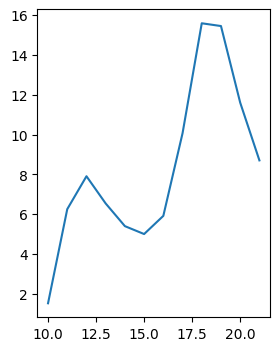

In [10]:
import matplotlib.pyplot as plt
#          10 11 12 13 14 15 16 17 18 19 20 21
# base_freq=[2, 10,13,12, 5, 2, 2,10,16,16,9, 3]
plt.figure(figsize=(3, 4))
plt.plot(range(10,22),base_freq)
plt.show()

In [11]:
def update_memory(s1,a,r,s2,time):
#     print(a, r, time)
    global fit_count, episode_reward, D_often, D_sparse, TD_error_list, TD_index, TD_max, terminal, history, pred_ub, pred_lb
    fit_count +=1
    if fit_count%10000==0:
        temp = []
        for i in range(len(initial_states)):
            tmp=[]
            tmp.append(np.array([initial_states[i][0:34]]))
            tmp.append(np.array([initial_states[i][34:154]]))
            tmp.append(np.array([initial_states[i][154:155]]))
            mask = masking(initial_states[i])
            tmp.append(np.array([mask]))
            with tf.device('/device:CPU:0'):
                predicted1 = model.predict_on_batch(tmp).copy()
            temp.append(np.max(predicted1))
        history.append(np.mean(temp))
        pred_ub.append(np.max(temp))
        pred_lb.append(np.min(temp))
        tmp_dic = {}
        tmp_dic['history'] = history
        tmp_dic['pred_ub'] = pred_ub
        tmp_dic['pred_lb'] = pred_lb
        with open('convergence_DCCDQN4EM(300).pickle', 'wb') as f:
            pickle.dump(tmp_dic, f)
        # plt.title('Average Q at Initial')
        plt.plot(np.arange(1,len(history)+1),history)
        plt.xticks(fontsize=14)
        plt.yticks(fontsize=14)
        plt.ylabel('Average Q-value', fontsize=18)
        plt.xlabel('Learning steps ($\\times 10^6$)', fontsize=18)
        plt.fill_between(np.arange(1,len(history)+1),pred_ub, pred_lb, color = 'k', alpha = 0.1, label = 'Standard Deviation')
        plt.legend()
        plt.savefig('DCCDQN4EM.png', dpi=300)
        plt.show()
        if fit_count < 1000000:
            print('model updated')
            model2.set_weights(model.get_weights())
        if fit_count%100000==0:
            with open('D_memory(210).pickle', 'wb') as f:
                pickle.dump(D_memory, f)

    if tmp_terminal == False:

        r = r/(delivery_reward)
        episode_reward += r
            
        
        if time<=43200:

            D_memory.append([s1, a, r, s2,0])
            

        elif time>43200:
            D_memory.append([s1, a, r, s2,1])


        if len(D_memory)>D_size:
                D_memory.pop(0)


    elif tmp_terminal == True:

        r = r/(delivery_reward)
        episode_reward += r
        
        D_memory.append([s1, a, r, s2,1])


        if len(D_memory)>D_size:
                D_memory.pop(0)
                

    TD_error = TD_max
    if len(TD_error_list)<D_size:
        TD_index = np.arange(0,len(TD_error_list)+1)
    else:

        TD_error_list = np.delete(TD_error_list,0)
    TD_error_list = np.append(TD_error_list, TD_error)
        



In [12]:
# 일초기화에서 위치, status, bat, charge_num, order_freq, order_list, order

class Bike():
    def __init__(self):
        self.key=0
        self.cur_time = 0
        self.loc = (0,0)
        self.fu_loc = (0,0)
        self.ploc=(0,0)
        self.status = 'daegi'
        self.bat = [0,1]
        self.charge_count = 0
        self.order_freq = 2
        self.acc_dist=0
        self.order_list = []
        self.bss_list=[] # [충전소로 출발하는 시간, 충전소 도착할시간, 충전소index, 충전소로 출발할 때 오토바이 위치]
        self.order_count = 0
        self.charge_rule = 50
        self.sooneung = 100
        self.cur_state=[]
        self.action=30
        self.reward=0
        self.fu_state=np.ones(155)
        self.moving_queue_time = 0
        self.stay_queue_time = 0
        self.daegi = True
  
        self.history = [[self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count]] # 
        self.moving_queue = 0 # time
    def __lt__(self, other):
        return self.key < other.key
    
    def decide(self):
        
        self.ploc = self.loc
        global event_list, state, fubike_idx, exploration_rate
        event_list.pop(0)
        
        
#         시간(1), 좌표(2), 충전량(1), 충전소별 큐 길이(30), 충전소별잔여 배터리량(180)
        cur_state=[]
        # 현재 시간 주문빈도
        if time < 43200:
            cur_state.append(base_freq[int(time/3600)]/16)
        else:
            cur_state.append(base_freq[-1]/16)
        # 다음 시간 주문 빈도
        if int(time/3600) >=11:
            cur_state.append(base_freq[-1]/16)
        # 일종료시점이면 현재시간으로
        else:
            cur_state.append(base_freq[int(time/3600)+1]/16)
        # 본인 배터리 용량
        cur_state.append(battery[self.bat[0]].soc/100)
        # 시간
        cur_state.append(time/43200)
        for i in range(len(bss)):
            # 각 bss 까지의 상대거리 (30)
            cur_state.append(distance(self.loc, bss[i].loc)/5000)


        # bss 정보(90)
        for i in range(len(bss)):
            # 충전소별 큐 길이 (30)
            cur_state.append(len(bss[i].queue)/3)
            # 충전소별 배터리 충전량 (높은 순)(90)
            tmp=[]
            for j in range(2,8,1):
                battery[bss[i].slot[j]].bat_charge()
            for j in range(2,8,2):
                tmp.append(battery[bss[i].slot[j]].soc)
            tmp = sorted(tmp,reverse = True)
            for j in range(len(tmp)):
                cur_state.append(tmp[j]/100)


        # 다른 바이크 정보 (배터리)(1)
        count=0
        for i in range(len(bike)):
            if battery[bike[i].bat[0]].soc < 50:
                count +=1
        cur_state.append(count)
        self.fu_state = copy.deepcopy(cur_state)
        if self.daegi ==False:
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, time)
        self.daegi = False
        
        self.reward = 0
        self.cur_state = copy.deepcopy(cur_state)

        model_fit()

        fubike_idx = self.key
        if exploration_rate < 0:
            exploration_rate = 0
        if random.randint(0,100)/100<1-exploration_rate:
            tmp=[]
            tmp.append(np.array([cur_state[0:34]]))
            tmp.append(np.array([cur_state[34:154]]))
            tmp.append(np.array([cur_state[154:155]]))
            mask = masking(cur_state)
            tmp.append(np.array([mask]))
            with tf.device('/device:CPU:0'):
                qvalue = model.predict_on_batch(tmp)
            action = np.argmax(qvalue)
#             print('action: ',action)
#             print(cur_state[34+action], cur_state[64+action*3:64+action*3+3])
#             print(mask)
#             print(qvalue)
            if np.max(qvalue) == 0:
                aa=False
                count = 0
                while aa==False:
                    count += 1
                    action = random.randint(0,30)
                    if mask[action]==0:
                        aa=True
                    if count > 50:
                        aa=True
                        action = 30
        else:
            mask = masking(cur_state)
            aa=False
            count = 0
            while aa==False:
                count += 1
                action = random.randint(0,30)
                if mask[action]==0:
                    aa=True
                if count > 50:
                    aa=True
                    action = 30
#             print('action: ',action)
#             print(mask)
        self.action = action
        
        if time < 43200:
            if action==30:
                event_list.insert(0,[time, self, 'order_generate'])
            else:        
                event_list.insert(0,[time, self, 'go_bss',action])



        

        
        


            
    def order_generate(self):
        global event_list
#         self.status='daegi'
        time_dae = int(time/3600)
        if time > 43200:
            time_dae = 11
        interval = gene_hyper/self.order_freq[time_dae]
        gen_inter = np.random.normal(interval,interval_sigma)    
        while gen_inter < 0:
            gen_inter = np.random.normal(interval,interval_sigma)
        if time_dae != (time+gen_inter)//3600:
            if time_dae != 11:
                interval = gene_hyper/((self.order_freq[int(time_dae)]+self.order_freq[int(time_dae)+1])/2)
            gen_inter = np.random.normal(interval,interval_sigma)
            while gen_inter < 0:
                gen_inter = np.random.normal(interval,interval_sigma)
        max_dist = distance((0,0), self.loc)

        tt=False
        while tt==False:
            gen_dist = np.random.normal(2400,dist_sigma)
            while (gen_dist > 3465)|(gen_dist <max_dist):
                gen_dist = np.random.normal(2400,dist_sigma)

            food_list=[]
            for i in range(len(food_loc)):
                if distance(food_loc[i],self.loc) < gen_dist:
                    food_list.append(i)
            idx = food_list[np.random.randint(len(food_list))]
            
            x=np.random.random()
            theta = np.random.random()*2*np.pi
            r=gen_dist - distance(food_loc[idx],self.loc)
            house_loc = (food_loc[idx][0]+r*np.cos(theta), food_loc[idx][1]+r*np.sin(theta))

            tt=discri(house_loc)



        tmp_time = gen_inter + time
        self.fu_loc = food_loc[idx]
        event_list.pop(0)
        pickuptime = distance(food_loc[idx],self.loc)/velo
        if tmp_time < 43200:
            if tmp_time - pickuptime <time:
                self.status = 'pickup'
            else:
                for i in range(len(event_list)):
                    if event_list[i][0] > tmp_time-pickuptime:
                        event_list.insert(i,[tmp_time-pickuptime, self, 'change_status_pickup'])
                        break
                    elif i == len(event_list)-1 :
                        event_list.append([tmp_time-pickuptime, self, 'change_status_pickup'])


            for i in range(len(event_list)):
                if event_list[i][0] > tmp_time:
                    event_list.insert(i,[tmp_time, self, 'pickup'])
                    break
                if i == (len(event_list)-1):
                    event_list.append([tmp_time, self, 'pickup'])

            self.order_list.append([tmp_time, food_loc[idx], house_loc, self.loc])
        else:
#             self.terminal = True
            self.reward += delivery_reward
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)

        
    def pickup(self):
        global event_list
        order = self.order_list[len(self.order_list)-1]
        
        self.status='delivery'
        self.cur_time= time
        self.loc=order[1]
        self.acc_dist=self.acc_dist+ distance(order[3], order[1])
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
    #     self.soc=self.soc-(self.dist(self.order_list[3], self.order_list[1])/2*bat_somo/bat_max_dist
        tmp_velo = np.random.normal(velo,velo_sigma)
        while (tmp_velo > velo*1.2)|(tmp_velo <velo*0.8):
            tmp_velo = np.random.normal(velo,velo_sigma)
      
        tmp_time = time + distance(order[1],order[2])/tmp_velo
        self.fu_loc = order[2]
        event_list.pop(0)
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume()
        
        for i in range(len(event_list)):
            if event_list[i][0] > tmp_time:
                event_list.insert(i, [tmp_time, self, 'delivery'])
                break        
            if i == (len(event_list)-1):
                event_list.append([tmp_time, self, 'delivery'])   
    def change_status_pickup(self):
        self.status = 'pickup'
        event_list.pop(0)

        
    def delivery(self):
        global event_list
        
        self.ploc = self.loc
        order = self.order_list[len(self.order_list)-1]
        self.status='delivery'
        self.cur_time= time
        self.loc=order[2]
        self.order_count=self.order_count+1
        self.acc_dist=self.acc_dist+ distance(order[1], order[2])
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume()
        
#         self.reward += delivery_reward
        
        

        
#         print(round(time,1),round(battery[self.bat[0]].soc,1),round(battery[self.bat[1]].soc,1))
        if battery[self.bat[0]].soc < 0:
            global terminal, tmp_terminal
#             bike[self.bik].reward = bike[self.bik].reward -2000
            print('oring occured')
            print('day start to termianl : %.1f'%time)
            terminal = True
            tmp_terminal = True
             
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
           
#         else:
#             update_memory(self.cur_state, self.action, self.reward, self.fu_state, time)
          

    
        
 

        event_list.pop(0)
        event_list.insert(0, [time, self, 'decide'])
 


    def go_bss(self,tmp_idx):
        global event_list
        if self.status=='queue':
            self.reward = self.reward-10000
        if len(bss[tmp_idx].queue)>=3:
            self.reward = self.reward-delivery_reward
        self.status='go_bss'

        tmp_velo = np.random.normal(velo,velo_sigma)
        while (tmp_velo > velo*1.2)|(tmp_velo <velo*0.8):
            tmp_velo = np.random.normal(velo,velo_sigma)

        tmp_dist = distance(bss[tmp_idx].loc, self.loc)
        tmp_time = time + tmp_dist/tmp_velo
        self.fu_loc = bss[tmp_idx].loc

        self.bss_list.append([time, tmp_time, tmp_idx, self.loc])



        if tmp_time <=43200: 
            if int(tmp_time/3600)==int(time/3600):
                self.reward = self.reward - (tmp_time-time)*base_freq[int(tmp_time/3600)]
            else:
                if tmp_time <=43200: 
                    self.reward = self.reward - (int(tmp_time/3600)*3600-time)*base_freq[int(time/3600)] - (tmp_time-int(tmp_time/3600)*3600)*base_freq[int(tmp_time/3600)]

        self.moving_queue_time += tmp_time-time
        event_list.pop(0)
        if time < 43200:
            for i in range(len(event_list)):
                if event_list[i][0]>tmp_time:
                    event_list.insert(i,[tmp_time, self, 'arrived_bss', tmp_idx])
                    break
                elif i == len(event_list)-1 :
                    event_list.append([tmp_time, self, 'arrived_bss', tmp_idx])
            bss[tmp_idx].queue.append([tmp_time,self.key])
#         bss[tmp_idx].queue = sorted(bss[tmp_idx].queue)

        
    def arrived_bss(self,tmp_idx):
        ######큐 추가#####
        global episode_reward, event_list
        
        
        
        self.status='queue'
        self.cur_time = time
        tmp_bss = self.bss_list[-1]
        
        
        self.acc_dist = self.acc_dist + distance(self.loc, bss[tmp_idx].loc)
        self.loc = bss[tmp_idx].loc
        self.history.append([self.status, self.cur_time, self.loc, self.acc_dist, self.bat, self.charge_count, self.order_count])
                    
        battery[self.bat[0]].bat_consume()
        battery[self.bat[1]].bat_consume() 

#         print(round(time,1),round(battery[self.bat[0]].soc,1),round(battery[self.bat[1]].soc,1))


#         cur_state=[]
#         cur_state.append(time/43200)
#         cur_state.append(self.loc[0]/3000)
#         cur_state.append(self.loc[1]/3000)
#         cur_state.append(battery[self.bat[0]].soc/100)
#         for i in range(len(bss)):
#             cur_state.append(len(bss[i].queue)/3)
#         for i in range(len(bss)):
#             for j in range(2,8,2):
#                 battery[bss[i].slot[j]].bat_charge()
#                 cur_state.append(battery[bss[i].slot[j]].soc/100)
#         self.fu_state = cur_state
#         self.fu_state = copy.deepcopy(state)
        if battery[self.bat[0]].soc < 0:
            global terminal, tmp_terminal
#             bike[self.bik].reward = bike[self.bik].reward -2000
            print('oring occured')
            print('day start to termianl : %.1f'%time)
            terminal = True
            tmp_terminal = True

             
            update_memory(self.cur_state, self.action, self.reward, self.fu_state, 1000000)
         

#         print(self.reward, battery[self.bat[0]].soc)
        
        
        
        event_list.pop(0)
        tmp=False
        for i in range(len(event_list)):
            if (event_list[i][1]== bss[tmp_idx])&(event_list[i][2]=='swap'):
                tmp=True
                break
        if tmp==False:    
            event_list.insert(0, [time+0.00001, bss[tmp_idx], 'swap'])
        
        bss[tmp_idx].count += 1



In [13]:
class Bss():
    def __init__(self):
        self.key=0
        self.queue = []
        self.loc = (0,0)
        self.slot = [None, None, 2,3,4,5,6,7]
        self.bss_history=[]
        self.min_his = []
        self.count=0
        
    def __lt__(self, other):
        return self.key < other.key
    
    def swap(self):
        global event_list
        
#         [status, time, bike[i] or bss[i], self.soc, charge_count]
        for i in range(6):
            idx = i+2
            bat_idx = self.slot[idx]
            battery[bat_idx].bat_charge()
            
#         if len(self.queue)>1: # 큐 이미 있으면 패스
#             event_list.pop(0)
#         else: #교환가능한거 있으면 교환, 없으면 대기
        tmp_soc = 10
        idx_list=[]
        if len(self.queue)<1:
            event_list.pop(0)
        elif self.queue[0][0]+0.0001>=time:
            event_list.pop(0)
            
            event_list.insert(0,[self.queue[0][0]+0.001, self, 'swap'])
            event_list = sorted(event_list)

        else:
            
            for i in range(6):
                idx = i+2
                if tmp_soc*0.99 <= battery[self.slot[idx]].soc:
                    tmp_soc = battery[self.slot[idx]].soc
                    idx_list.insert(0,idx)
                
            if tmp_soc >= 95:
                bike_idx = self.queue[0][1] # 바이크 인덱스
                idx_list# 배터리 슬롯 인덱스(앞에잇을수록 용량 많음)
                bike_bat = [bike[self.queue[0][1]].bat[0], bike[self.queue[0][1]].bat[1]]#넣은배터리index 2 리스트형
                bat_idx = [self.slot[idx_list[0]],self.slot[idx_list[1]]] # 뺀배터리 index 2 리스트형
                #히스토리업데이트
                #[bike index, bike 도착시간, bike나가는시간, 배터리슬롯index, 넣은배터리index, 뺀배터리index]
                self.bss_history.append([bike_idx, self.queue[0][0], time, [idx_list[0],idx_list[1]], bike_bat, bat_idx])
                #교환
#                 print(self.queue[0][0], time)
                arrived_time = self.queue[0][0]
                self.min_his.append([self.key, bike_idx,day, self.queue[0][0], time - self.queue[0][0]])


                if int((time+60)/3600) == int(arrived_time/3600):
                    if arrived_time > 43200:
                        bike[bike_idx].reward = delivery_reward
                    else:
                        bike[bike_idx].reward = bike[bike_idx].reward - ((time - arrived_time)+60)*base_freq[int((time+60)/3600)]
                else:
                    if time+60 <= 43200:
                        bike[bike_idx].reward = bike[bike_idx].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)] - (time+60 - int((time+60)/3600)*3600)*base_freq[int((time+60)/3600)]
                    else:
                        bike[bike_idx].reward = bike[bike_idx].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)-1] - (43200 - int((time+60)/3600)*3600)*base_freq[-1]

                
                bike[bike_idx].stay_queue_time += time - self.queue[0][0]

#                     global terminal, tmp_terminal
#                     tmp_terminal = True
                if time + 60 < 43200:
                    daegitime = time+60 - self.queue[0][0]
                else:
                    daegitime = 43200 - self.queue[0][0]
                if daegitime >3600:
                    global terminal
                    terminal = True
                    print('so long waited in ', self.key)
                    print('day start to termianl : %.1f'%time)

                self.slot[idx_list[0]]= bike_bat[0]
                self.slot[idx_list[1]]= bike_bat[1]
                
                bike[bike_idx].bat = bat_idx
                bike[bike_idx].charge_count += 1
                bike[bike_idx].history.append([bike[bike_idx].status, time, bike[bike_idx].loc, bike[bike_idx].acc_dist, bike[bike_idx].bat, bike[bike_idx].charge_count, bike[bike_idx].order_count])
                battery[bat_idx[0]].bik= bike_idx
                battery[bat_idx[0]].bss= None
                battery[bat_idx[0]].charge_count +=1 
                battery[bat_idx[1]].bik= bike_idx
                battery[bat_idx[1]].charge_count +=1
                battery[bat_idx[1]].bss= None
                battery[bat_idx[0]].status='on_bike'
                battery[bat_idx[0]].time = time
                battery[bat_idx[1]].time = time
                battery[bat_idx[1]].status='on_bike'
                battery[bat_idx[0]].bat_history.append([battery[bat_idx[0]].status, time, battery[bat_idx[0]].soc,battery[bat_idx[0]].bik,  battery[bat_idx[0]].charge_count])
                battery[bat_idx[1]].bat_history.append([battery[bat_idx[1]].status, time,battery[bat_idx[1]].soc, battery[bat_idx[1]].bik,  battery[bat_idx[1]].charge_count])

                battery[bike_bat[0]].bss = self.key
                battery[bike_bat[0]].status = 'charge'
                battery[bike_bat[0]].time = time
                battery[bike_bat[1]].time = time
                battery[bike_bat[1]].status = 'charge'
                battery[bike_bat[1]].bss = self.key
                battery[bike_bat[0]].bat_history.append([battery[bike_bat[0]].status, time, battery[bike_bat[0]].soc,battery[bike_bat[0]].bik,  battery[bike_bat[0]].charge_count])
                battery[bike_bat[1]].bat_history.append([battery[bike_bat[1]].status, time, battery[bike_bat[1]].soc,battery[bike_bat[1]].bik,  battery[bike_bat[1]].charge_count])


                event_list.pop(0)
                event_list.insert(0,[time+0.01, self, 'swap'])
#                 if time + 60 <= 43200:
                event_list.insert(0,[time+60, bike[bike_idx], 'decide'])
                event_list = sorted(event_list)
                self.queue.pop(0)
                if (daegitime >1800)|(time+60 > 43200):
                    update_memory(bike[bike_idx].cur_state, bike[bike_idx].action, bike[bike_idx].reward, bike[bike_idx].fu_state, 50000)
                    bike[bike_idx].daegi = True
    

 

                
                

            else:

                tmp_time = time + (99.5-tmp_soc)*72
                event_list.pop(0)

    
                event_list.append([tmp_time, self, 'swap'])  
                event_list = sorted(event_list)



In [14]:
class Battery():
    
    def __init__(self):
        self.key=0
        self.so=100
        self.bat_acc=0
        self.status='charge' # 'charge'<100% / 'full'=100% / 'on_bike'
        self.soc=100 # float
        self.bik=0 # bike에 인덱싱
        self.bss=0 # bss에 인덱싱
        self.time=0
        self.cycle=0 # 방전횟수
        self.max_charge=100
        self.charge_count=0 # int
        self.bat_history=[['on_bike', 0, 100, 0, 0]] # [status, time, bike[i] or bss[i], self.soc, charge_count]
        
    def __lt__(self, other):
        return self.key < other.key
        
    def bat_consume(self):
        self.status = 'on_bike'
        global terminal

        loc0=bike[self.bik].history[-1][2]
        loc1=bike[self.bik].history[-2][2]
        self.so = self.so - distance(loc0, loc1)/2*bat_somo/bat_max_wh*100
        self.soc = self.so*100/self.max_charge
        self.bat_history.append([self.status, time,self.soc, self.bik, self.charge_count])
#         if (self.soc < 25)&(self.soc>0):
#             if (bike[self.bik].status=='daegi')|(bike[self.bik].status=='pickup')|(bike[self.bik].status=='delivery'):
#                 bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 20:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 15:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 12:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 9:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 6:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
#                 if self.soc < 3:
#                     bike[self.bik].reward = bike[self.bik].reward - (delivery_reward/5)
            
            

        
        
        if self.soc < 0:
            bike[self.bik].reward = bike[self.bik].reward - (delivery_reward*3)
#             print('day start to termianl : %.1f'%time, end = ' ')
#             terminal = True
#             print('god', end='')
             
#             update_memory(bike[self.bik].cur_state, bike[self.bik].action, bike[self.bik].reward, bike[self.bik].cur_state, 1000000)

    
#             model_fit()

            
            


    def bat_charge(self):
        self.status='charge'
        if len(self.bat_history)!=0:


            self.bat_acc+=(time-self.bat_history[-1][1])/72
            self.cycle= self.bat_acc/100
#             self.max_charge=100-(cycle_loss*self.cycle)
            
            self.so = self.so + (time-self.bat_history[-1][1])/72
            if self.so > self.max_charge:
                self.so = self.max_charge
            self.soc = self.so*100/self.max_charge
            
            self.bat_history.append([self.status, time, self.soc, self.bik, self.charge_count])    


<function matplotlib.pyplot.show(close=None, block=None)>

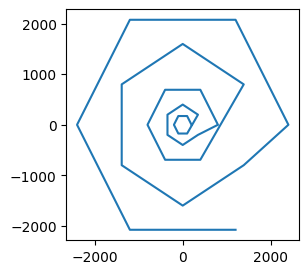

In [15]:
# 충전소 위치
bss_loc=[]
bss_r = [200,400,800,1600,2400]
for j in range(len(bss_r)): # 거리
    for i in range(6): # 각도
        if j%2==0:
            theta = np.pi*i/3
            bss_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
        if j%2==1:
            theta = np.pi*i/3 + np.pi/6
            bss_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.plot(df[0],df[1])
plt.show


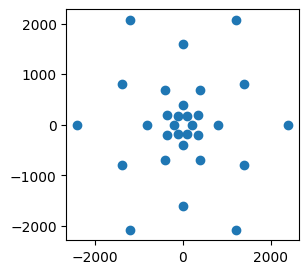

In [16]:
plt.figure(figsize=(3, 3))
plt.scatter(df[0],df[1])
plt.show()

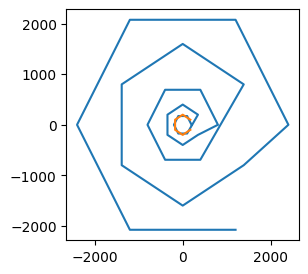

In [17]:
# # 음식점 위치 생성
# food_loc=[]
# n=30 # 음식점 개수
# r=1500
# #반지름 2km 원 위에 고르게 분포


# for i in range(n):
#     theta = 2*i*np.pi/n
#     food_loc.append((r*np.cos(theta), r*np.sin(theta)))
food_loc=[]
bss_r = [200]
for j in range(len(bss_r)): # 거리
    for i in range(6): # 각도
        if j%2==0:
            theta = np.pi*i/3+ np.pi/6
            food_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))
        if j%2==1:
            theta = np.pi*i/3 
            food_loc.append((bss_r[j]*np.cos(theta),bss_r[j]*np.sin(theta)))

df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.plot(df[0],df[1])
df =pd.DataFrame(food_loc)
plt.plot(df[0],df[1])
plt.show()


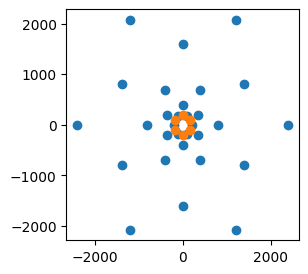

In [18]:
df =pd.DataFrame(bss_loc)
plt.figure(figsize=(3, 3))
plt.scatter(df[0],df[1])
df =pd.DataFrame(food_loc)
plt.scatter(df[0],df[1])
plt.show()

In [19]:
# 육각형 안에 있는지 판별
def discri(a):
    x=a[0]
    y=a[1]
    if (x>=0)&(y>=0): # 1사분면
        tf = (x/np.sqrt(3)+y<3000) & (x<3000)
    elif (x<0)&(y>0): # 2사분면
        tf = (-x/np.sqrt(3)+y<3000) & (x>-3000)
    elif (x<=0)&(y<=0): # 3사분면
        tf = (x>-3000) & (x/np.sqrt(3)+y>-3000)
    elif (x>0)&(y<0):
        tf = (-x/np.sqrt(3)+y>-3000) & (x<3000)
    return tf

# (x,y) 거리 구하기
def distance(x1,x2):
    return np.sqrt((x1[0]-x2[0])**2+(x1[1]-x2[1])**2)
def masking(state):
    mask = np.zeros(31)
    # 오링안나기
    if state[2] < 0.12:
        mask[30] = -100
    # 50퍼 전에는 배달만
    if state[2] > 0.5:
        mask[0:30] = -100
    for i in range(30):
        # 대기열 3명이상이면 마스킹
        if state[34 + i*4] >=1:
            mask[i] = -100
        else:
            if state[34 + i*4 + round(state[34 + i*4]*3)+1]<0.65:
                mask[i] = -100
    return mask

In [20]:
#일 종료

def end_day():
    global bike_df,day, bike, battery, bss, terminal
    day_acc_dist = []
    day_order_count = []
    day_charge_count = []
    for i in range(len(bike)):
        bike[i].cur_time=0
        bike_df[i].loc[day,'acc_dist'] = bike[i].acc_dist
        bike[i].acc_dist = 0
        bike_df[i].loc[day,'order_count'] = bike[i].order_count
        bike[i].order_count = 0
        bike_df[i].loc[day,'charge_count'] = bike[i].charge_count
        bike[i].charge_count = 0
        bike_df[i].loc[day,'total_queue_time'] = 0
        bike_df[i].loc[day,'moving_queue_time'] = 0
        bike_df[i].loc[day,'stay_queue_time'] = 0
        bike_df[i].loc[day,'queue_count'] = 0
        bike[i].bss_list = []
#         bike[i].reward=0
        bike[i].history = [[bike[i].status, 0, bike[i].loc, 0, bike[i].bat, 0, 0]]
        if len(bike[i].order_list)<2:
            bike[i].order_list = [[0,[0,0], [0,0], [0,0]],[0,[0,0], [0,0], [0,0]]]
        else:
            bike[i].order_list = [bike[i].order_list[-2],bike[i].order_list[-1]]
    idx = np.arange(0,len(bike))
    random.shuffle(idx)
    j=0
    for i in idx:
        bike[i].order_freq = freq[int(j)]
        j = j + len(freq)/len(bike)
    del idx    
#     soc_list=[]
    for i in range(len(battery)):
        battery[i].time=0
        if len(battery[i].bat_history)>0:
#             #[self.status, time,self.soc, self.bik, self.charge_count]
#             soc_list.append(battery[i].bat_history)
            battery[i].bat_history=[[0,0,0,0,0],battery[i].bat_history[-1]]
            battery[i].bat_history[-1][1] = 0
        battery[i].charge_count=0
#     soc_df.append(soc_list)  

        
    for i in range(len(bss)):
        if len(bss[i].bss_history)!=0:
            for j in range(len(bss[i].bss_history)):
                if (bss[i].bss_history[j][2] - bss[i].bss_history[j][1])>0:
                    
                    bike_df[bss[i].bss_history[j][0]].loc[day,'queue_count'] += 1
#                     bike_df[bss[i].bss_history[j][0]].loc[day,'queue_time'] += bss[i].bss_history[j][2] - bss[i].bss_history[j][1]
    min_his_list=[]
    for i in range(len(bss)):
#         if terminal ==False:
        if len(bss[i].queue)>0:
            for j in range(len(bss[i].queue)):
                if (bss[i].queue[j][0]<43200)&(bss[i].queue[j][0]<time):
                    bike_df[bss[i].queue[j][1]].loc[day,'charge_count'] += 1
                    bike_df[bss[i].queue[j][1]].loc[day,'queue_count'] += 1
#                     bike_df[bss[i].queue[j][1]].loc[day,'queue_time'] += time - bss[i].queue[j][0]
                    arrived_time = bss[i].queue[j][0]
                    if int((time+60)/3600) == int(arrived_time/3600):
                        if arrived_time < 43200:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - ((time - arrived_time)+60)*base_freq[int((time+60)/3600)]
                        else:
                            bike[bss[i].queue[j][1]].reward = 0
                    else:
                        if time+60 <= 43200:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)] - (time - int((time+60)/3600)*3600)*base_freq[int((time+60)/3600)]
                        else:
                            bike[bss[i].queue[j][1]].reward = bike[bss[i].queue[j][1]].reward - (int((time+60)/3600)*3600-arrived_time)*base_freq[int(arrived_time/3600)-1] - (time - int((time+60)/3600)*3600)*base_freq[-1] 



                    bike[bss[i].queue[j][1]].stay_queue_time += time - bss[i].queue[j][0]

#                     cur_state=[]
#                     cur_state.append(0)
#                     cur_state.append(bike[bss[i].queue[j][1]].loc[0]/3000)
#                     cur_state.append(bike[bss[i].queue[j][1]].loc[1]/3000)
#                     cur_state.append(100/100)
#                     for k in range(len(bss)):
#                         cur_state.append(0)
#                     for k in range(len(bss)):
#                         for l in range(2,8,2):
#                             battery[bss[k].slot[l]].bat_charge()
#                             cur_state.append(100/100)
                    aa=False
                    if time> 43200:
                        aa = True
                    if time<43200:
                        if time - bss[i].queue[j][0] >3600:

                            aa = True
                            print('so long waited in ',bss[i].key)
                            print('day start to termianl : %.1f'%time)
                    else:
                        if 43200 - bss[i].queue[j][0] >3600:

                            aa = True
                            print('so long waited in ',bss[i].key)
                            print('day start to termianl : %.1f'%time)
                    if aa ==True:
                        update_memory(bike[bss[i].queue[j][1]].cur_state,bike[bss[i].queue[j][1]].action, bike[bss[i].queue[j][1]].reward, bike[bss[i].queue[j][1]].fu_state,50000)

                        model_fit()


                ##################################################################################
                    abc = battery[bike[bss[i].queue[j][1]].bat[0]].so
                    battery[bike[bss[i].queue[j][1]].bat[0]].so = battery[bike[bss[i].queue[j][1]].bat[0]].max_charge
                    battery[bike[bss[i].queue[j][1]].bat[0]].soc = 100

                    battery[bike[bss[i].queue[j][1]].bat[0]].bat_acc += battery[bike[bss[i].queue[j][1]].bat[0]].so-abc
                    battery[bike[bss[i].queue[j][1]].bat[0]].cycle= battery[bike[bss[i].queue[j][1]].bat[0]].bat_acc/100
#                     battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
                    battery[bike[bss[i].queue[j][1]].bat[0]].bat_history=[[0,0,0,0,0],[battery[bike[bss[i].queue[j][1]].bat[0]].status, 0, battery[bike[bss[i].queue[j][1]].bat[0]].soc, battery[bike[bss[i].queue[j][1]].bat[0]].bik, battery[bike[bss[i].queue[j][1]].bat[0]].charge_count]]

                    abc = battery[bike[bss[i].queue[j][1]].bat[1]].so
                    battery[bike[bss[i].queue[j][1]].bat[1]].so = battery[bike[bss[i].queue[j][1]].bat[1]].max_charge
                    battery[bike[bss[i].queue[j][1]].bat[1]].soc = 100

                    battery[bike[bss[i].queue[j][1]].bat[1]].bat_acc += battery[bike[bss[i].queue[j][1]].bat[1]].so-abc
                    battery[bike[bss[i].queue[j][1]].bat[1]].cycle= battery[bike[bss[i].queue[j][1]].bat[1]].bat_acc/100
#                     battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
                    battery[bike[bss[i].queue[j][1]].bat[1]].bat_history=[[0,0,0,0,0],[battery[bike[bss[i].queue[j][1]].bat[1]].status, 0, battery[bike[bss[i].queue[j][1]].bat[1]].soc, battery[bike[bss[i].queue[j][1]].bat[1]].bik, battery[bike[bss[i].queue[j][1]].bat[1]].charge_count]]
                ###############################################
        
    
        bss[i].bss_history = []
        min_his_list.append(bss[i].min_his)
        bss[i].min_his = []
    min_his_df.append(min_his_list)
    for i in range(len(bss)):
        bss[i].queue = []
    for i in range(len(bike)):
        bike_df[i].loc[day,'stay_queue_time'] = bike[i].stay_queue_time
        bike_df[i].loc[day,'moving_queue_time'] = bike[i].moving_queue_time
        bike_df[i].loc[day,'total_queue_time'] = bike[i].stay_queue_time + bike[i].moving_queue_time
        bike[i].stay_queue_time = 0
        bike[i].moving_queue_time = 0
    
    for i in range(len(bss)):
        for j in range(6):
            k = j+2
            abc = battery[bss[i].slot[k]].so
            
            battery[bss[i].slot[k]].so = battery[bss[i].slot[k]].max_charge
            battery[bss[i].slot[k]].soc = 100

            battery[bss[i].slot[k]].bat_acc += battery[bss[i].slot[k]].so-abc
            battery[bss[i].slot[k]].cycle= battery[bss[i].slot[k]].bat_acc/100
#             battery[bss[i].slot[k]].max_charge=100-(cycle_loss*battery[bss[i].slot[k]].cycle)
            battery[bss[i].slot[k]].bat_history=[[0,0,0,0,0],[battery[bss[i].slot[k]].status, 0, battery[bss[i].slot[k]].soc, battery[bss[i].slot[k]].bik, battery[bss[i].slot[k]].charge_count]]
            
def end_bike_n():

    # 바이크 90대 생성, 주문건수 할당

    #객체 90대 생성
    global bike
    bike = {}
    for i in range(int(bike_n)):
        bike[i] = Bike()
        bike[i].key = i
        bike[i].loc = (4000*random.random()-2000,4000*random.random()-2000)
#         bike[i].sooneung = sooneung_avg

    #base_freq, day_avg 따라 발생빈도 할당
    global freq
    freq = []
    for i in range(len(day_avg)):
        tmp = []
        for j in range(len(base_freq)):
            tmp.append(base_freq[j]*day_avg[i]/sum(base_freq))
        freq.append(copy.deepcopy(tmp))

    idx = np.arange(0,len(bike))
    random.shuffle(idx)
    j=0
    for i in idx:
        bike[i].order_freq = freq[int(j)]
        j = j + len(freq)/len(bike)

        bike[i].bat=[i*2,i*2+1]

    
    for i in range(len(bike)):
        if i / len(bike)<0.1:
            bike[i].charge_rule = char_rule[0]
        elif i/len(bike)<0.25:
            bike[i].charge_rule = char_rule[1]
        elif i/len(bike)<0.5:
            bike[i].charge_rule = char_rule[2]
        elif i/len(bike)<0.85:
            bike[i].charge_rule = char_rule[3]
        else:
            bike[i].charge_rule = char_rule[4]
       


    global battery
    battery = {}
    for i in range(int(bike_n)*2+bss_n*6):
        battery[i]=Battery()
        battery[i].key=i
    for i in range(len(bike)):
        battery[i*2].bik = i
        battery[i*2+1].bik = i
        
    if popul%10 ==0:
        for i in range(int(bike_n)):
            tmp = 100*random.random()+10
            if tmp >100:
                tmp = 100
    #         tmp = (popul%10)*10+10
            battery[i*2].so = tmp
            battery[i*2+1].so = tmp
            battery[i*2].soc = tmp
            battery[i*2+1].soc = tmp
    else:
        for i in range(20):
            battery[i*2].so = 10
            battery[i*2+1].so = 10
            battery[i*2].soc = 10
            battery[i*2+1].soc = 10
        for i in range(20,40):
            battery[i*2].so = 20
            battery[i*2+1].so = 20
            battery[i*2].soc = 20
            battery[i*2+1].soc = 20
        for i in range(40,60):
            battery[i*2].so = 30
            battery[i*2+1].so = 30
            battery[i*2].soc = 30
            battery[i*2+1].soc = 30
    
    #충전소 생성, 위치할당
    global bss
    bss = {}
    for i in range(bss_n):
        bss[i] = Bss()
        bss[i].key = i
        bss[i].slot[2] = i*6 + (2*len(bike))
        bss[i].slot[3] = i*6+1+ (2*len(bike))
        bss[i].slot[4] = i*6+2+ (2*len(bike))
        bss[i].slot[5] = i*6+3+ (2*len(bike))
        bss[i].slot[6] = i*6+4+ (2*len(bike))
        bss[i].slot[7] = i*6+5+ (2*len(bike))
        bss[i].loc = bss_loc[i]  

## 처음 돌리기

In [21]:
with tf.device('/device:CPU:0'):
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(31)])],[np.array([np.append(np.zeros(30),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(31)])],[np.array([np.append(np.zeros(30),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(31)])],[np.array([np.append(np.zeros(30),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(31)])],[np.array([np.append(np.zeros(30),0)])])
    model.train_on_batch([np.array([np.ones(34)]),np.array([np.ones(120)]),np.array([np.ones(1)]),np.array([np.ones(31)])],[np.array([np.append(np.zeros(30),0)])])
model2.set_weights(model.get_weights())

In [22]:
event_list=[]
state = []
fubike_idx=0
D_memory=[]
# D_terminal=[]

In [23]:
# from keras.models import load_model

# model.load_weights('best_model(210)(w).h5')
# model2.set_weights(model.get_weights())

with open('initial_states.pickle', 'rb') as f:
    initial_states = pickle.load(f)

# with open('D_memory(230).pickle', 'rb') as f:
#     D_memory = pickle.load(f)

# tmp1=[]
# tmp2=[]
# tmp3=[]
# temp=[]
# delt=[]
# for i in range(len(D_memory)):
#     train = D_memory[i]
    
#     tmp1.append(train[0][0:64])
#     tmp2.append(train[0][64:154])
#     tmp3.append(train[0][154:254])


#     tmp=[]
#     tmp.append(np.array([train[3][0:64]]))
#     tmp.append(np.array([train[3][64:154]]))
#     tmp.append(np.array([train[3][154:254]]))



#     predicted1 = model2.predict_on_batch(tmp)[0][np.argmax(model.predict_on_batch(tmp).copy())]

#     tmp_max = qrate*predicted1

#     tmp=np.zeros(31)
#     tmp[train[1]]=1.0

#     temp.append(tmp)
#     delt.append(train[2] + tmp_max*(1-train[4]))



#     tmp=[]
#     tmp.append(np.array([train[0][0:64]]))
#     tmp.append(np.array([train[0][64:154]]))
#     tmp.append(np.array([train[0][154:254]]))

                
#     TD_error_list = np.append(TD_error_list,np.abs(delt[-1]-model.predict_on_batch(tmp)[0][train[1]])+TD_max/D_size)

# TD_index = np.arange(0,len(TD_error_list))

# TD_max = np.max(TD_error_list[:int(len(TD_error_list))])
# max_w_i = (len(D_memory)*TD_max/np.sum(TD_error_list))**(-beta)


# # with open('D_terminal.pickle', 'rb') as f:
# #     D_terminal = pickle.load(f)

In [24]:
model2.set_weights(model.get_weights())


episode 0
day : 0


2024-07-18 16:54:16.436895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 16:55:10.967966: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 17:37:44.758666: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 18:00:13.404340: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 34781.7

 time for simulate one day : 4252.1
so long waited in  7
day start to termianl : 34781.7
so long waited in  7
day start to termianl : 34781.7

average moving queuetime :  161.0 221.0
average stay queuetime :  1174.6 1613.1
average total queuetime :  1335.5 1834.1
average chargecount :  1.4 1.4
average ordercount :  29.0 29.0
[69, 29, 35, 14, 20, 14, 25, 59, 75, 1, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.3679148476418315
code start to now : 4254.8
episode_reward :  -443.0464528429407
fit_count :  9054
TD max = 103.21969781408424 TD min = 0.00010420558341640565

episode 1
day : 0


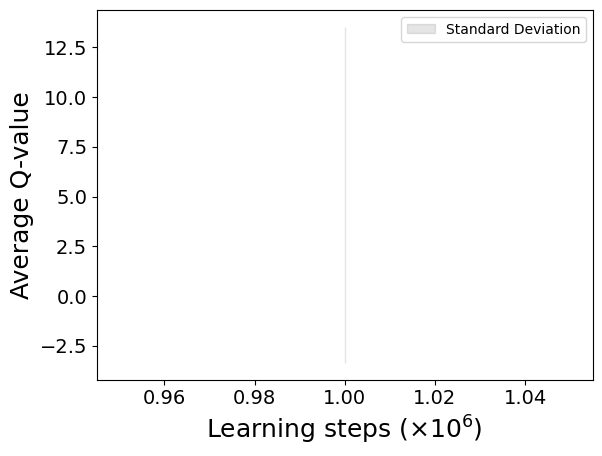

model updated


2024-07-18 18:30:16.131207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 19:24:22.949026: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 19:27:33.917244: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


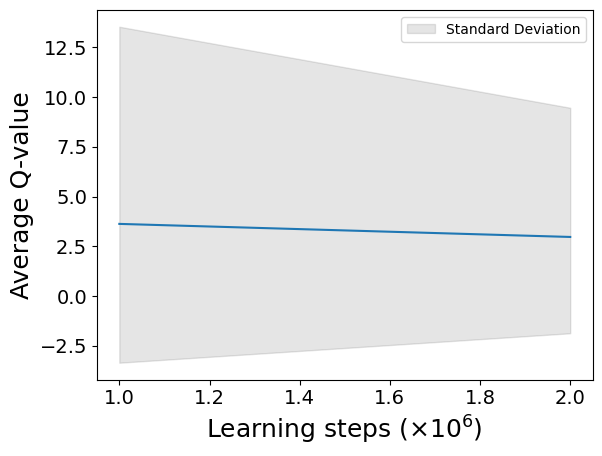

model updated


2024-07-18 19:36:15.306503: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 5936.0

average moving queuetime :  158.3 357.2
average stay queuetime :  1478.3 3335.9
average total queuetime :  1636.5 3693.1
average chargecount :  2.3 2.3
average ordercount :  37.8 37.8
day : 1


2024-07-18 19:49:37.769755: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:10:08.418291: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:31:37.513410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 20:46:10.051249: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


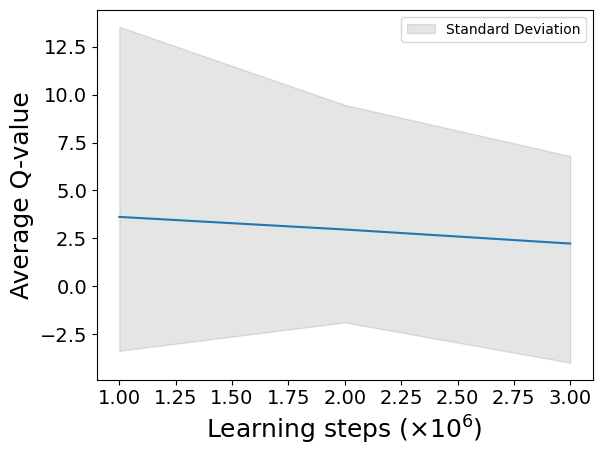

model updated


2024-07-18 21:00:07.408956: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39189.6

 time for simulate one day : 5359.5

average moving queuetime :  156.6 289.0
average stay queuetime :  1349.5 2233.2
average total queuetime :  1506.1 2522.2
average chargecount :  2.1 1.9
average ordercount :  36.0 34.2
[60, 0, 0, 11, 77, 71, 37, 71, 108, 89, 76, 77]
[17, 10, 42, 85, 44, 44, 22, 38, 122, 65, 18, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  2.96849569907633
code start to now : 15557.4
episode_reward :  -1506.8391337705596
fit_count :  32343
TD max = 96.22265500793458 TD min = 0.00010420558341640565

episode 2
day : 0


2024-07-18 22:00:16.039252: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:03:48.053217: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


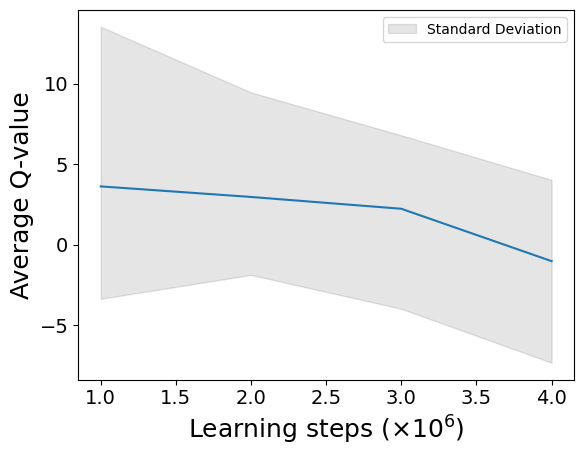

model updated


2024-07-18 22:16:54.981249: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:20:57.366794: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:25:29.221175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:33:38.573284: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 22:40:12.770765: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41303.2

 time for simulate one day : 5573.5
so long waited in  7
day start to termianl : 41303.2

average moving queuetime :  152.7 280.0
average stay queuetime :  1142.8 2095.1
average total queuetime :  1295.5 2375.1
average chargecount :  1.8 1.8
average ordercount :  36.7 36.7
[38, 9, 13, 1, 12, 61, 73, 70, 88, 82, 56, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.484155916015519
code start to now : 21134.6
episode_reward :  -800.6220301375472
fit_count :  43844
TD max = 99.63410886535645 TD min = 0.00010420558341640565

episode 3
day : 0


2024-07-18 22:50:26.841111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:03:25.252181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:04:08.806252: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:07:06.825891: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:08:08.358350: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-18 23:13:46.512236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


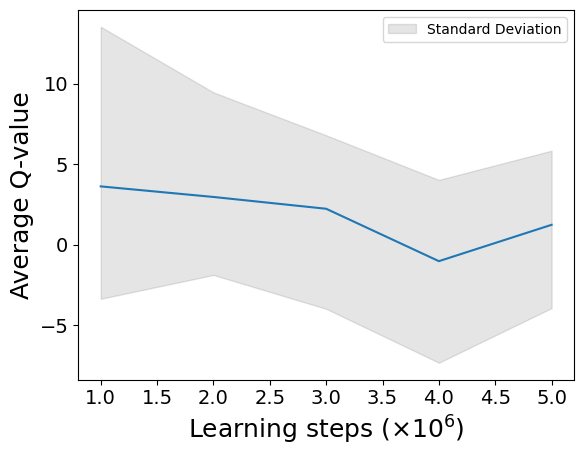

model updated


2024-07-18 23:49:51.112337: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 34710.4

 time for simulate one day : 4331.4

average moving queuetime :  155.0 197.4
average stay queuetime :  976.8 1243.8
average total queuetime :  1131.8 1441.2
average chargecount :  1.3 1.3
average ordercount :  29.2 29.2
[35, 14, 9, 1, 24, 29, 54, 105, 64, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.2724834048872629
code start to now : 25469.2
episode_reward :  -473.2374450045229
fit_count :  52937
TD max = 99.63410886535645 TD min = 0.00010420558341640565

episode 4
day : 0


2024-07-19 00:05:46.785495: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:21:21.240826: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:22:44.285071: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:38:54.715656: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 00:47:53.189903: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


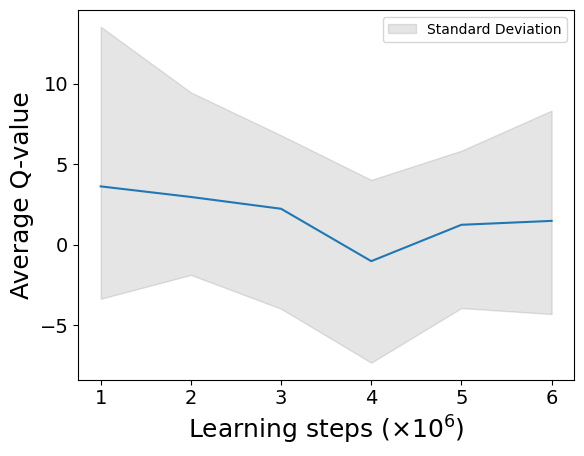

model updated


2024-07-19 01:08:44.907278: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38847.6

 time for simulate one day : 5142.1

average moving queuetime :  150.2 246.8
average stay queuetime :  1124.7 1848.3
average total queuetime :  1274.9 2095.1
average chargecount :  1.6 1.6
average ordercount :  34.2 34.2
[27, 18, 9, 7, 39, 27, 56, 85, 94, 70, 12, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4100498544263937
code start to now : 30614.9
episode_reward :  -735.8244834746954
fit_count :  63639
TD max = 92.68890691528321 TD min = 0.00010420558341640565

episode 5
day : 0


2024-07-19 01:47:35.966688: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:04:22.092900: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:06:59.681205: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


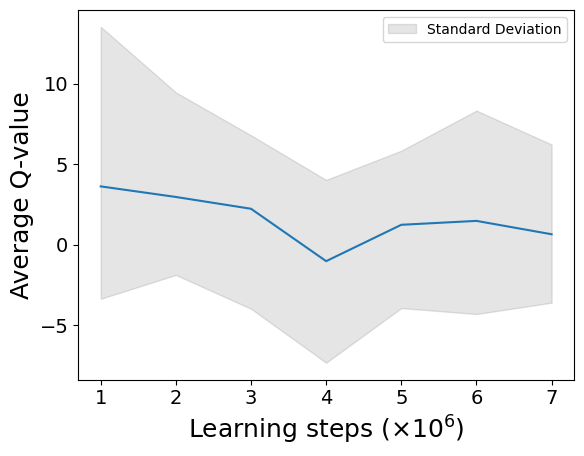

model updated


2024-07-19 02:38:57.270687: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 02:44:08.461260: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41923.5

 time for simulate one day : 5578.9
so long waited in  7
day start to termianl : 41923.5
so long waited in  7
day start to termianl : 41923.5
so long waited in  7
day start to termianl : 41923.5
so long waited in  7
day start to termianl : 41923.5
so long waited in  7
day start to termianl : 41923.5

average moving queuetime :  149.6 264.8
average stay queuetime :  1299.4 2299.9
average total queuetime :  1449.0 2564.7
average chargecount :  1.8 1.8
average ordercount :  37.1 37.1
[32, 19, 8, 8, 46, 36, 38, 63, 99, 73, 61, 5]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.521168776485622
code start to now : 36201.4
episode_reward :  -871.5874395735963
fit_count :  75281
TD max = 107.29980714569092 TD min = 0.00010420558341640565

episode 6
day : 0


2024-07-19 03:14:48.375199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 03:28:48.539555: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


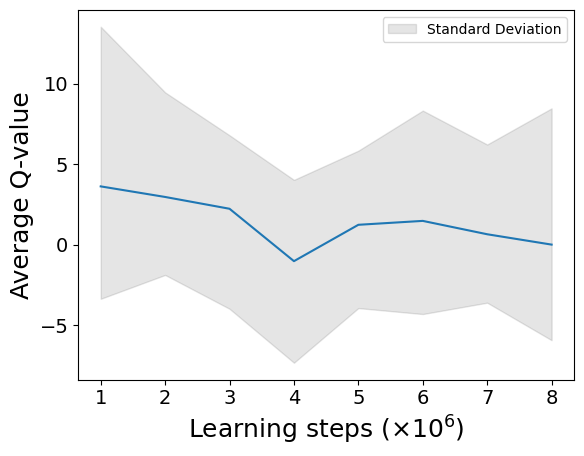

model updated
so long waited in  7
day start to termianl : 41351.6

 time for simulate one day : 5518.6
so long waited in  7
day start to termianl : 41351.6
so long waited in  7
day start to termianl : 41351.6
so long waited in  7
day start to termianl : 41351.6
so long waited in  7
day start to termianl : 41351.6
so long waited in  7
day start to termianl : 41351.6
so long waited in  7
day start to termianl : 41351.6

average moving queuetime :  146.8 254.9
average stay queuetime :  1103.5 1916.5
average total queuetime :  1250.3 2171.4
average chargecount :  1.7 1.7
average ordercount :  37.2 37.2
[32, 15, 12, 9, 52, 43, 47, 42, 98, 72, 58, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.497949957976803
code start to now : 41727.5
episode_reward :  -728.97112717959
fit_count :  86921
TD max = 109.06873402366638 TD min = 0.00010420558341640565

episode 7
day : 0


2024-07-19 04:39:01.864323: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:40:07.345005: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:40:57.176474: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:40:57.751703: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:41:05.895018: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:41:13.769564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:41:25.038915: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 04:45:56.580526: W tensorflow/core/data/root_dataset.cc:24

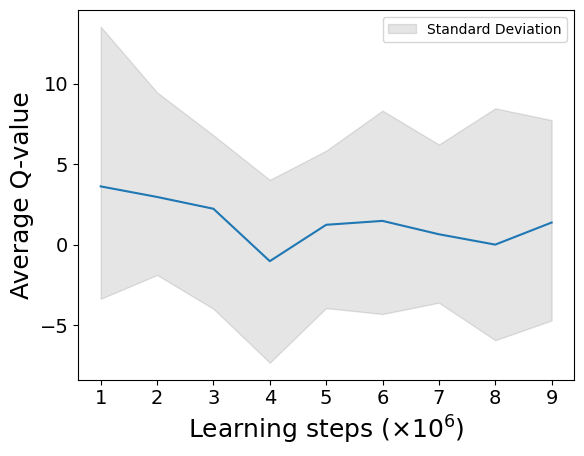

model updated
so long waited in  7
day start to termianl : 38111.8

 time for simulate one day : 4986.9

average moving queuetime :  147.5 225.6
average stay queuetime :  963.5 1474.1
average total queuetime :  1110.9 1699.7
average chargecount :  1.5 1.5
average ordercount :  33.6 33.6
[26, 18, 13, 7, 52, 39, 31, 41, 122, 60, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4041170282465676
code start to now : 46717.8
episode_reward :  -569.1835001242623
fit_count :  97398
TD max = 88.26688149223328 TD min = 0.00010420558341640565

episode 8
day : 0


2024-07-19 06:00:20.369317: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:12:06.176295: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


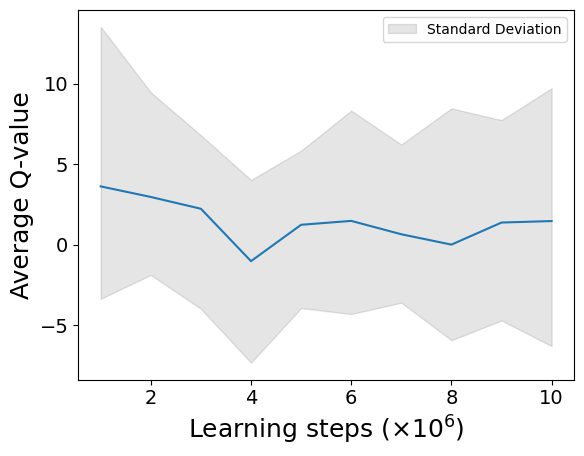

model updated


2024-07-19 06:27:42.584909: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:29:37.704048: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 06:57:10.248172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:15:30.300048: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38539.1

 time for simulate one day : 5162.6
so long waited in  7
day start to termianl : 38539.1
so long waited in  7
day start to termianl : 38539.1

average moving queuetime :  152.9 243.6
average stay queuetime :  937.1 1493.1
average total queuetime :  1090.0 1736.7
average chargecount :  1.6 1.6
average ordercount :  34.1 34.1
[35, 17, 8, 3, 39, 53, 43, 36, 117, 65, 3, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4333704250773316
code start to now : 51883.9
episode_reward :  -573.4297068020381
fit_count :  108038
TD max = 110.26349376449585 TD min = 0.00010420558341640565

episode 9
day : 0


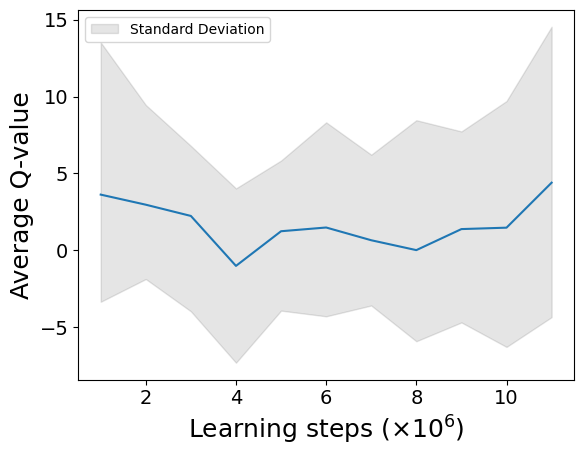

model updated


2024-07-19 07:50:11.317963: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:53:09.661957: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 07:58:11.141347: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 34946.6

 time for simulate one day : 4431.1
so long waited in  7
day start to termianl : 34946.6
so long waited in  7
day start to termianl : 34946.6
so long waited in  7
day start to termianl : 34946.6
so long waited in  7
day start to termianl : 34946.6

average moving queuetime :  155.1 199.6
average stay queuetime :  696.0 895.5
average total queuetime :  851.2 1095.2
average chargecount :  1.3 1.3
average ordercount :  29.8 29.8
[29, 15, 14, 6, 46, 30, 33, 47, 112, 6, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.3051747696624905
code start to now : 56321.8
episode_reward :  -361.22296025437987
fit_count :  117323
TD max = 76.11517438659668 TD min = 0.00010420558341640565

episode 10
day : 0


2024-07-19 08:41:56.042904: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 08:43:52.668577: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


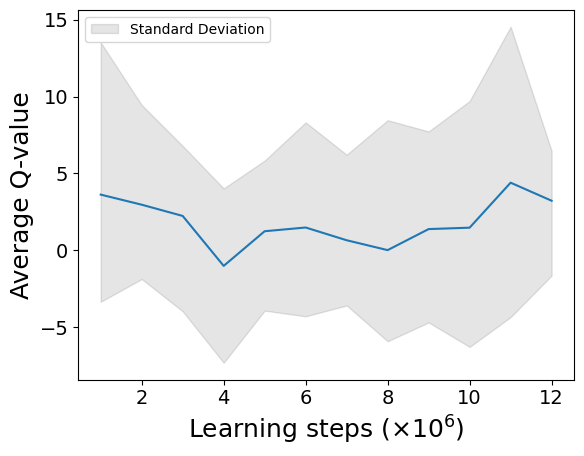

model updated


2024-07-19 09:04:34.520972: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 09:44:14.414463: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 09:46:58.467312: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 5860.4

average moving queuetime :  152.6 341.7
average stay queuetime :  1097.8 2459.1
average total queuetime :  1250.4 2800.8
average chargecount :  2.2 2.2
average ordercount :  38.3 38.3
day : 1


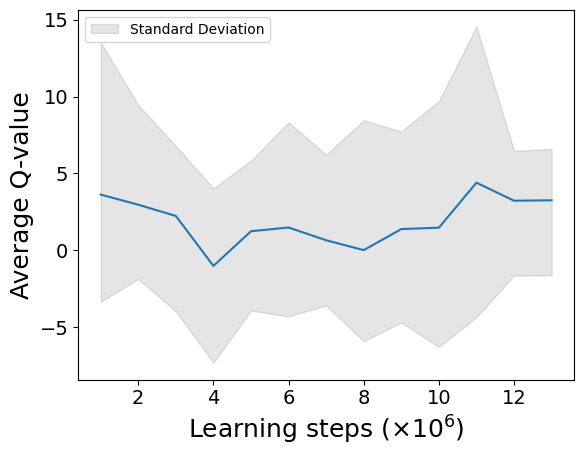

model updated


2024-07-19 10:18:30.130420: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:30:23.346370: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:34:24.569274: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:34:57.767220: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:36:55.207830: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 10:57:54.311478: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:11:33.587797: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 11:13:51.532462: W tensorflow/core/data/root_dataset.cc:24

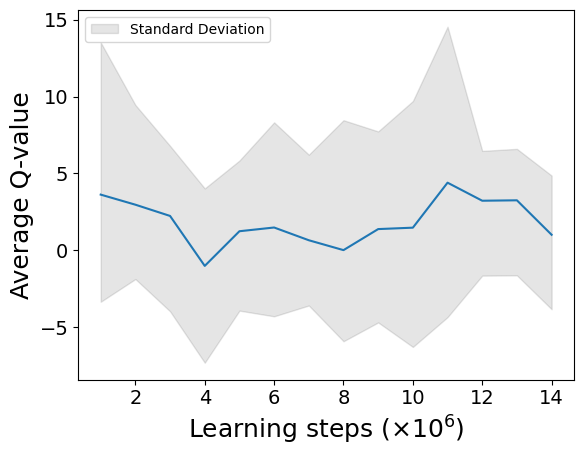

model updated


2024-07-19 11:36:19.627970: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38248.0

 time for simulate one day : 5252.7

average moving queuetime :  154.1 276.3
average stay queuetime :  1030.4 1672.8
average total queuetime :  1184.5 1949.1
average chargecount :  2.0 1.8
average ordercount :  36.0 33.7
[46, 35, 49, 29, 44, 44, 55, 63, 94, 82, 59, 72]
[24, 29, 27, 29, 71, 41, 35, 71, 98, 66, 3, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  2.8893609990108473
code start to now : 67442.4
episode_reward :  -1164.2070416502806
fit_count :  140608
TD max = 57.553108008003235 TD min = 0.00010824928283726934

episode 11
day : 0


2024-07-19 12:15:20.334179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:16:07.198745: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:20:35.158501: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:22:40.852176: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 12:23:10.897179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:03:17.171152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


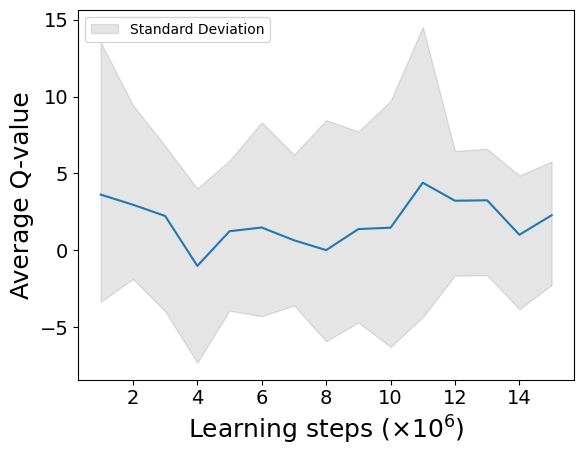

model updated

 time for simulate one day : 6979.9

average moving queuetime :  148.0 286.2
average stay queuetime :  1166.5 2255.2
average total queuetime :  1314.5 2541.4
average chargecount :  1.9 1.9
average ordercount :  38.6 38.6
day : 1


2024-07-19 13:54:44.740047: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 13:56:26.889691: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:15:53.581216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


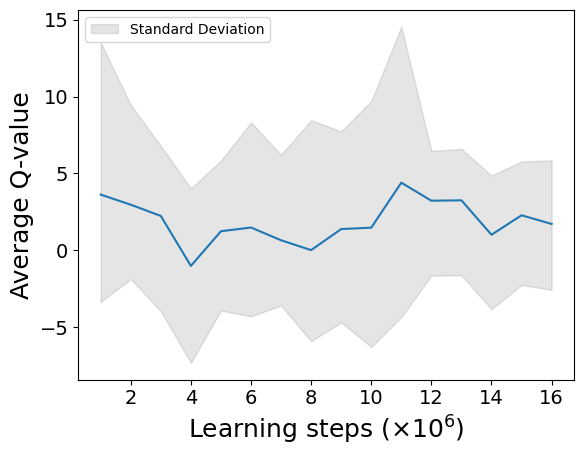

model updated


2024-07-19 14:37:01.786856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:45:06.657739: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 14:48:20.501181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38840.0

 time for simulate one day : 5363.6

average moving queuetime :  152.8 296.8
average stay queuetime :  1049.7 1751.3
average total queuetime :  1202.5 2048.1
average chargecount :  1.9 1.9
average ordercount :  36.4 34.2
[38, 19, 3, 4, 22, 64, 81, 67, 100, 77, 62, 43]
[46, 29, 19, 40, 39, 62, 30, 109, 77, 62, 21, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  2.8843752881026634
code start to now : 79793.3
episode_reward :  -1176.314680938028
fit_count :  164105
TD max = 52.85869946489334 TD min = 0.00010824928283726934

episode 12
day : 0


2024-07-19 15:23:37.800820: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:31:46.348324: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 15:46:08.861172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


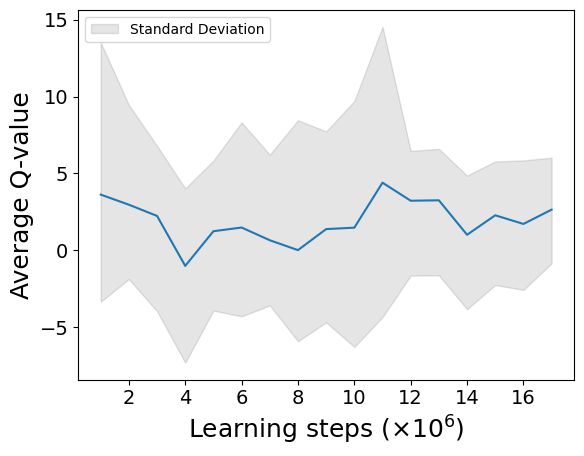

model updated


2024-07-19 16:01:22.011700: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 16:39:27.389739: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6018.5

average moving queuetime :  153.6 291.3
average stay queuetime :  967.8 1835.7
average total queuetime :  1121.4 2127.0
average chargecount :  1.9 1.9
average ordercount :  39.2 39.2
day : 1


2024-07-19 17:07:42.657162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 17:08:39.609019: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


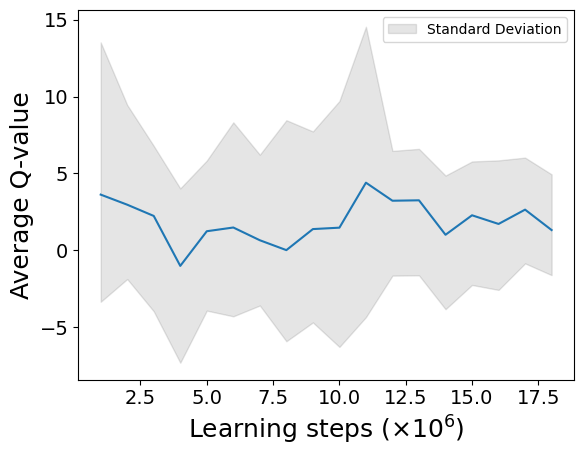

model updated


2024-07-19 17:37:57.538725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 17:56:44.883825: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:20:47.709492: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6140.0

average moving queuetime :  155.2 346.0
average stay queuetime :  938.2 2017.4
average total queuetime :  1093.4 2363.3
average chargecount :  2.1 2.2
average ordercount :  39.1 39.1
day : 2


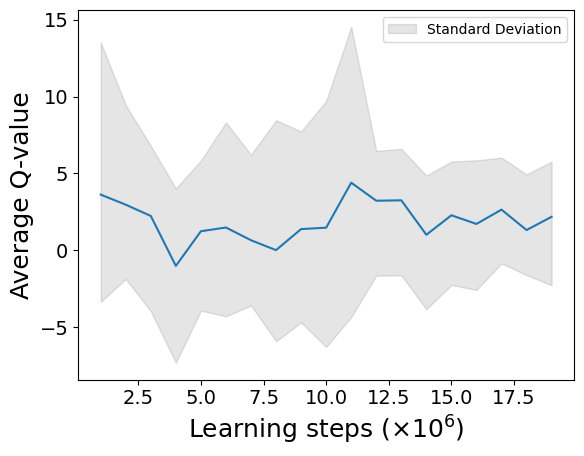

model updated


2024-07-19 18:34:11.400375: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:39:11.940820: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 18:42:28.934029: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:02:50.347542: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:09:05.692608: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:14:08.381193: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:31:37.654082: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:37:59.565009: W tensorflow/core/data/root_dataset.cc:24

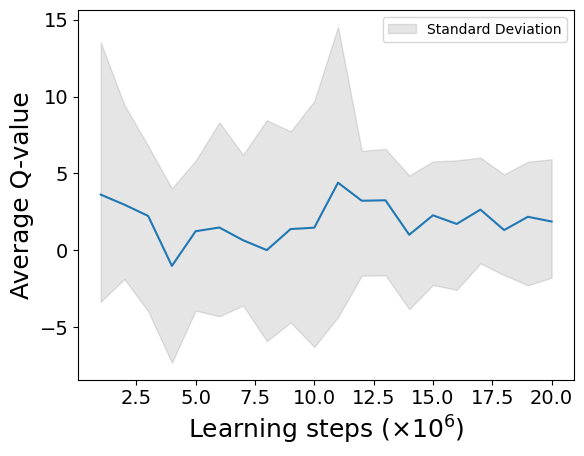

model updated


2024-07-19 19:52:48.020907: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 19:56:01.710410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:01:20.268495: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6301.6

average moving queuetime :  156.7 334.6
average stay queuetime :  896.9 1710.7
average total queuetime :  1053.6 2045.3
average chargecount :  2.1 2.1
average ordercount :  39.2 39.5
[31, 25, 1, 4, 29, 48, 65, 92, 76, 70, 74, 54]
[36, 27, 33, 47, 42, 63, 52, 78, 89, 63, 63, 70]
[50, 25, 37, 21, 55, 32, 80, 70, 55, 68, 71, 65]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.574511396377745
code start to now : 98265.8
episode_reward :  -1009.7463965200694
fit_count :  202571
TD max = 52.2826308418274 TD min = 0.00010221014022827593

episode 13
day : 0


2024-07-19 20:31:16.859408: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:31:43.755902: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 20:43:34.439276: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:05:15.962814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


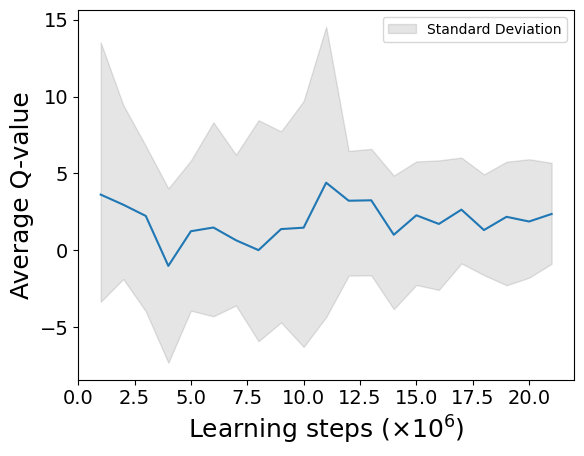

model updated


2024-07-19 21:20:20.141152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:38:31.341179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:48:10.208312: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 5996.4

average moving queuetime :  147.7 264.9
average stay queuetime :  1012.9 1816.5
average total queuetime :  1160.6 2081.4
average chargecount :  1.8 1.8
average ordercount :  39.5 39.5
day : 1


2024-07-19 21:53:53.661122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 21:54:56.453876: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:04:20.734736: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:25:53.850303: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


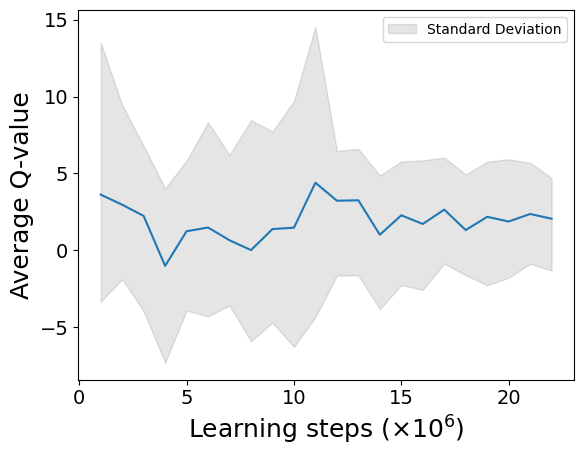

model updated


2024-07-19 22:33:38.401150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:41:56.219416: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:52:32.751156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 22:54:50.091166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:12:07.221194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:15:40.770216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-19 23:18:45.293978: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6144.5

average moving queuetime :  150.7 294.8
average stay queuetime :  1037.2 2034.9
average total queuetime :  1187.9 2329.7
average chargecount :  1.9 1.9
average ordercount :  39.3 39.1
day : 2


2024-07-19 23:42:28.443264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


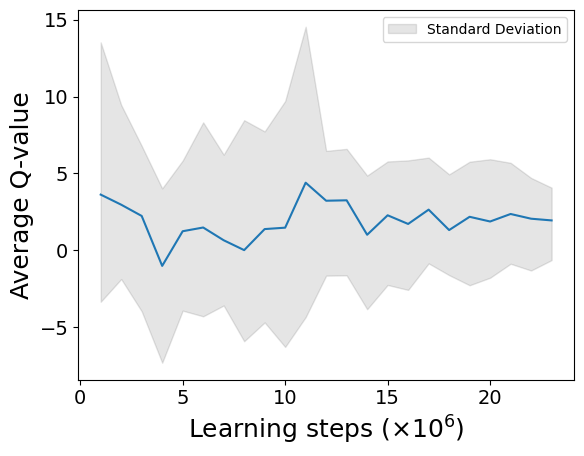

model updated


2024-07-20 00:18:13.650372: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:27:31.247002: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:31:19.701160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:38:22.607402: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:40:35.079472: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:50:01.028015: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:57:16.021158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 00:59:07.006737: W tensorflow/core/data/root_dataset.cc:24

so long waited in  7
day start to termianl : 41512.9

 time for simulate one day : 5765.7
so long waited in  7
day start to termianl : 41512.9

average moving queuetime :  153.0 283.7
average stay queuetime :  1006.6 1698.3
average total queuetime :  1159.6 1982.0
average chargecount :  1.8 1.8
average ordercount :  38.6 37.2
[28, 21, 11, 6, 48, 31, 41, 78, 61, 86, 71, 56]
[20, 34, 25, 41, 37, 35, 45, 95, 63, 56, 63, 62]
[39, 24, 39, 23, 47, 32, 39, 59, 84, 74, 40, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.578680786192386
code start to now : 116184.5
episode_reward :  -1257.268652861362
fit_count :  239969
TD max = 52.78827817774036 TD min = 0.00010221014022827593

episode 14
day : 0


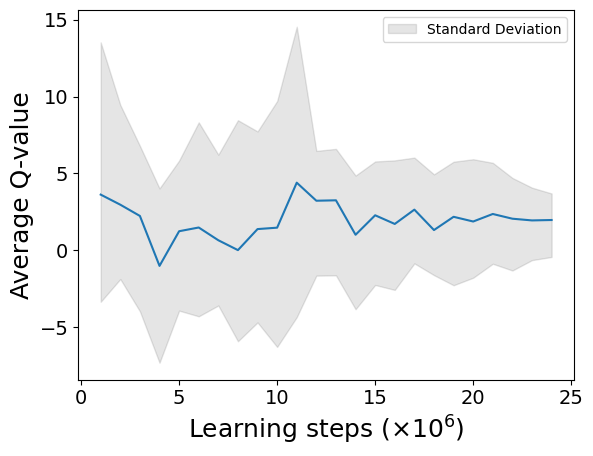

model updated


2024-07-20 01:29:24.488725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:33:11.678807: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:47:05.140481: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 01:53:39.191236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:03:59.624216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:05:24.024589: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:08:03.171261: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 02:08:13.902028: W tensorflow/core/data/root_dataset.cc:24

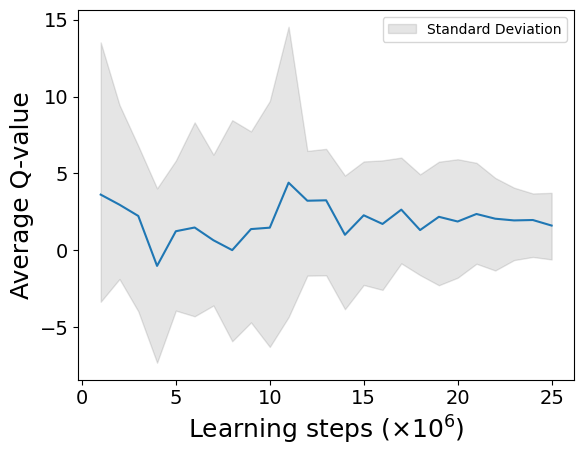

model updated
so long waited in  7
day start to termianl : 43009.1

 time for simulate one day : 5913.1

average moving queuetime :  151.6 251.1
average stay queuetime :  1044.6 1730.6
average total queuetime :  1196.2 1981.7
average chargecount :  1.7 1.7
average ordercount :  38.9 38.9
[42, 9, 7, 5, 16, 43, 43, 68, 82, 69, 61, 14]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.547351915714122
code start to now : 122101.5
episode_reward :  -534.7288253717674
fit_count :  252246
TD max = 55.86638162384034 TD min = 0.00010221014022827593

episode 15
day : 0


2024-07-20 02:55:23.218780: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:02:33.109613: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:09:29.319119: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:12:22.839835: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:23:23.396534: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:24:02.079347: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:25:55.031268: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 03:31:45.822144: W tensorflow/core/data/root_dataset.cc:24

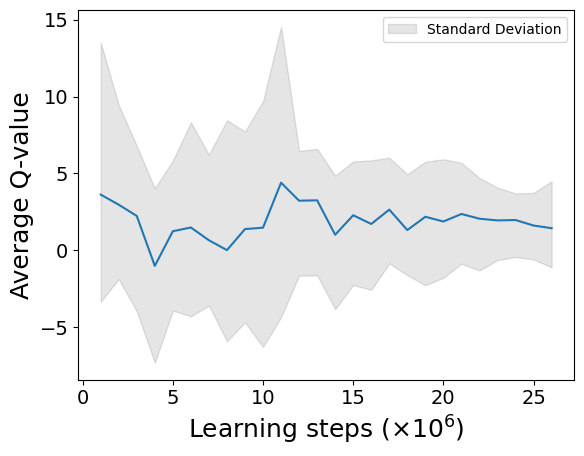

model updated


2024-07-20 04:04:47.093497: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:06:22.333351: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:09:26.019411: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:11:53.169396: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 44449.3

 time for simulate one day : 6010.1
so long waited in  7
day start to termianl : 44449.3
so long waited in  7
day start to termianl : 44449.3
so long waited in  7
day start to termianl : 44449.3

average moving queuetime :  165.5 277.5
average stay queuetime :  1072.6 1798.4
average total queuetime :  1238.1 2075.9
average chargecount :  1.7 1.7
average ordercount :  39.3 39.3
[27, 24, 7, 6, 21, 37, 55, 61, 71, 74, 66, 34]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5540664560799824
code start to now : 128126.9
episode_reward :  -519.6620064256414
fit_count :  264753
TD max = 46.84332460174561 TD min = 0.00010221014022827593

episode 16
day : 0


2024-07-20 04:34:47.358893: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:50:33.561146: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:55:09.571288: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 04:56:44.700319: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 05:06:04.810394: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


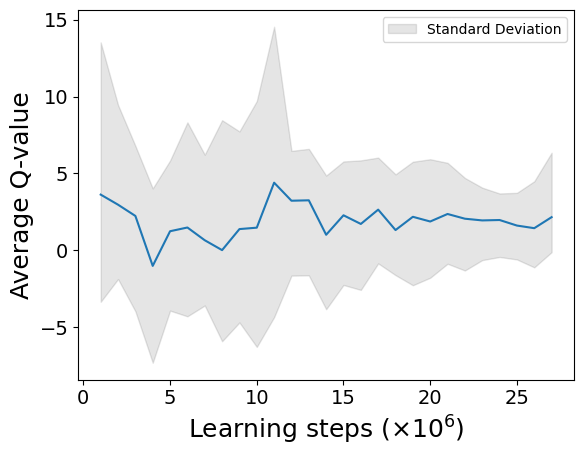

model updated


2024-07-20 05:12:48.720856: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 05:59:46.185156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39865.4

 time for simulate one day : 5467.6
so long waited in  7
day start to termianl : 39865.4
so long waited in  7
day start to termianl : 39865.4

average moving queuetime :  165.6 244.5
average stay queuetime :  989.5 1461.1
average total queuetime :  1155.1 1705.7
average chargecount :  1.5 1.5
average ordercount :  36.0 36.0
[31, 20, 8, 3, 28, 33, 30, 97, 61, 71, 24, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4473966360727637
code start to now : 133598.2
episode_reward :  -611.8793709295326
fit_count :  275955
TD max = 43.121088235473636 TD min = 0.00010221014022827593

episode 17
day : 0


2024-07-20 06:16:55.950873: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


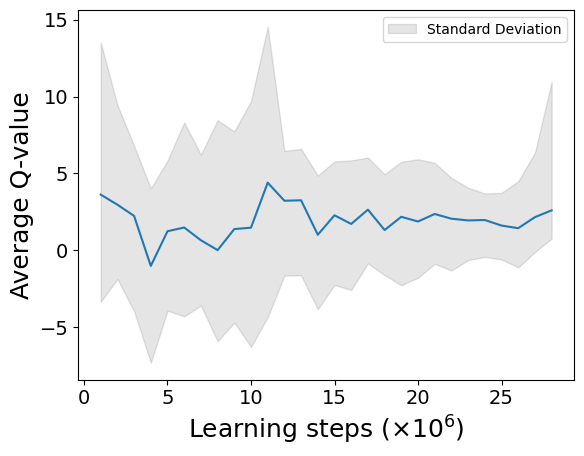

model updated


2024-07-20 06:41:06.573909: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 06:46:16.319668: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 06:54:42.586494: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 06:59:18.609441: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:12:42.785093: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:12:44.028421: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 07:29:26.707681: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 40018.4

 time for simulate one day : 5523.9

average moving queuetime :  154.4 245.5
average stay queuetime :  872.4 1387.2
average total queuetime :  1026.8 1632.6
average chargecount :  1.6 1.6
average ordercount :  36.2 36.2
[41, 13, 6, 1, 39, 44, 54, 52, 76, 88, 36, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4435365873844765
code start to now : 139125.7
episode_reward :  -563.6844472822502
fit_count :  287259
TD max = 50.71201272735596 TD min = 0.00010623226165769042

episode 18
day : 0


2024-07-20 07:34:33.777891: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


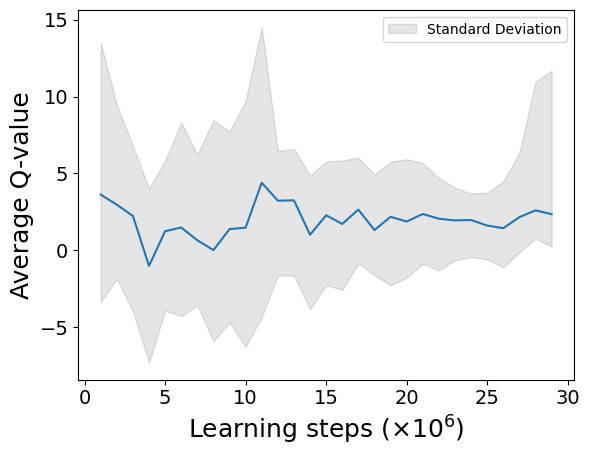

model updated


2024-07-20 08:12:12.991232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 08:33:51.703486: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6028.2

average moving queuetime :  155.4 284.8
average stay queuetime :  1084.1 1987.4
average total queuetime :  1239.4 2272.3
average chargecount :  1.8 1.8
average ordercount :  39.2 39.2
day : 1


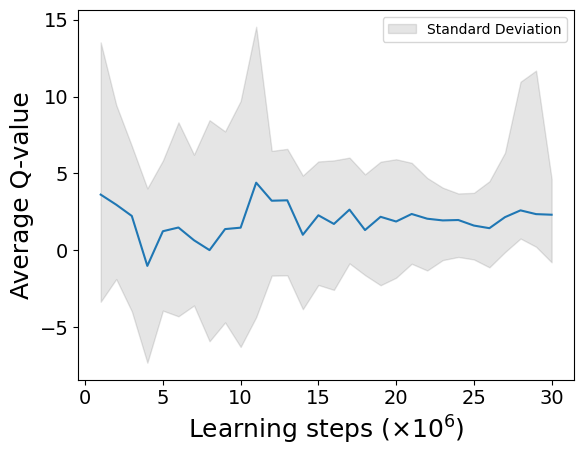

model updated


2024-07-20 10:09:16.371129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


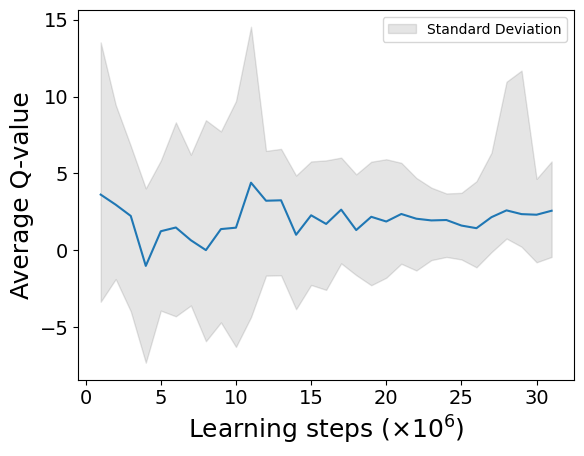

model updated

 time for simulate one day : 6342.0

average moving queuetime :  156.9 325.3
average stay queuetime :  1001.2 1907.2
average total queuetime :  1158.0 2232.5
average chargecount :  1.9 2.1
average ordercount :  39.2 39.3
day : 2


2024-07-20 11:09:46.012159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:31:59.474872: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 11:51:30.271146: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


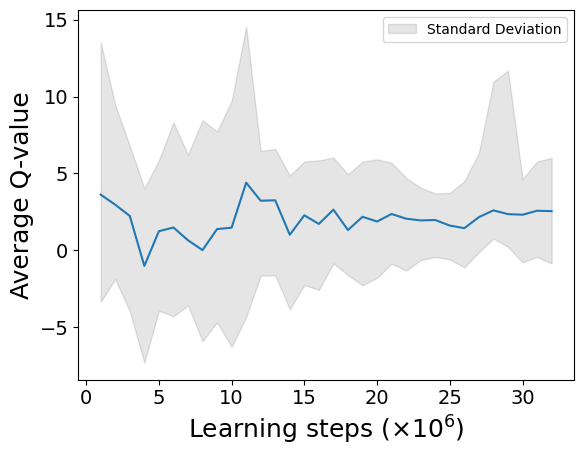

model updated


2024-07-20 12:21:22.019134: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:34:38.259895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 12:38:32.713507: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6176.3

average moving queuetime :  154.8 312.8
average stay queuetime :  988.0 1997.4
average total queuetime :  1142.8 2310.2
average chargecount :  2.0 2.1
average ordercount :  39.2 39.1
[53, 6, 1, 3, 37, 31, 67, 78, 77, 81, 46, 70]
[40, 52, 37, 12, 16, 72, 68, 53, 81, 68, 65, 53]
[29, 27, 67, 24, 33, 33, 61, 75, 65, 86, 60, 62]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.5870768885210955
code start to now : 157684.3
episode_reward :  -1133.4506246056985
fit_count :  325580
TD max = 36.761029260253906 TD min = 0.00010106096267704637

episode 19
day : 0


2024-07-20 12:46:41.234537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:01:18.238564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:07:41.060615: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


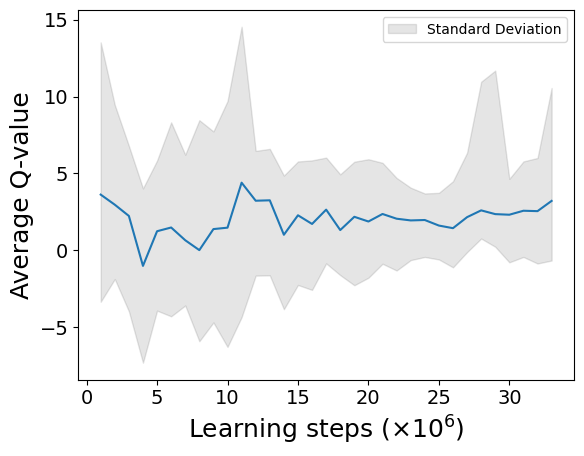

model updated


2024-07-20 13:19:47.979696: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:33:00.911220: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:38:55.781226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 13:49:55.681161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6083.1

average moving queuetime :  152.2 263.3
average stay queuetime :  1043.9 1806.0
average total queuetime :  1196.1 2069.3
average chargecount :  1.7 1.7
average ordercount :  39.4 39.4
day : 1


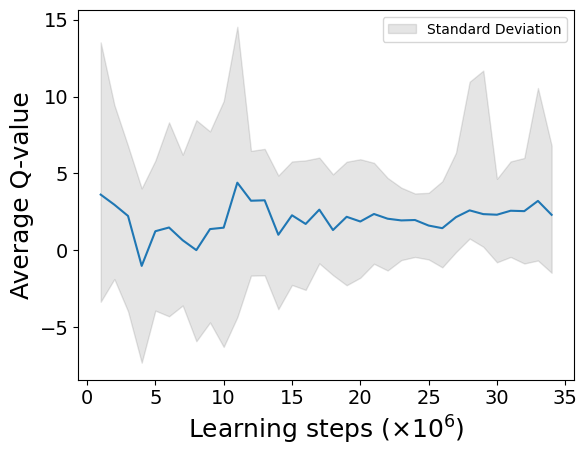

model updated


2024-07-20 14:43:55.637052: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:32:17.571257: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 15:59:04.178157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


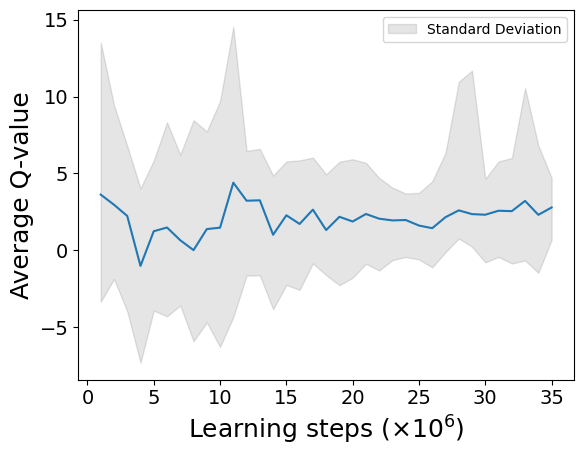

model updated

 time for simulate one day : 6235.5

average moving queuetime :  155.8 317.3
average stay queuetime :  993.4 1896.0
average total queuetime :  1149.2 2213.3
average chargecount :  1.9 2.0
average ordercount :  39.4 39.4
day : 2


2024-07-20 16:49:05.077369: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 16:55:06.199829: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:02:31.896342: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:16:15.868320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


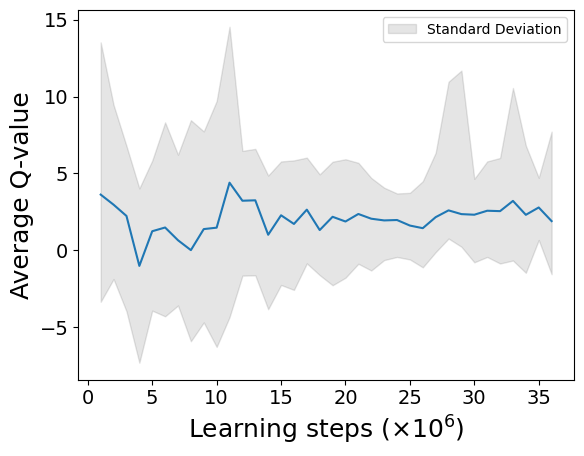

model updated


2024-07-20 17:29:38.410536: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 17:33:35.911155: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41263.7

 time for simulate one day : 5862.5

average moving queuetime :  156.3 306.6
average stay queuetime :  984.8 1888.3
average total queuetime :  1141.1 2194.9
average chargecount :  1.9 1.9
average ordercount :  38.6 36.9
[31, 15, 9, 8, 21, 26, 82, 48, 74, 86, 72, 47]
[33, 26, 71, 28, 12, 42, 74, 75, 60, 63, 78, 37]
[38, 46, 50, 23, 50, 23, 48, 70, 62, 92, 57, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.527898215911349
code start to now : 175877.7
episode_reward :  -1273.4787436789306
fit_count :  363002
TD max = 36.761029260253906 TD min = 0.00010214815139765179

episode 20
day : 0


2024-07-20 18:01:23.101241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 18:14:13.555335: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 18:15:00.596232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 18:24:22.907538: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


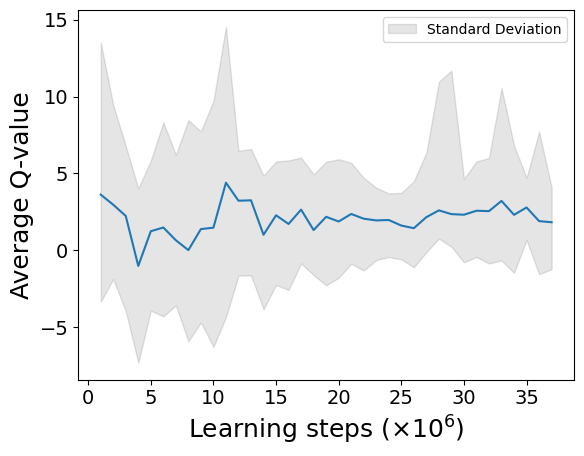

model updated


2024-07-20 18:49:16.211167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:04:35.276791: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:14:51.237463: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:18:37.717840: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 5968.2

average moving queuetime :  162.2 368.8
average stay queuetime :  1147.8 2609.2
average total queuetime :  1310.0 2978.0
average chargecount :  2.3 2.3
average ordercount :  38.4 38.4
day : 1


2024-07-20 19:28:34.484846: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:29:40.454797: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:29:53.027479: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:32:00.874930: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:40:05.021158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 19:52:13.791235: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


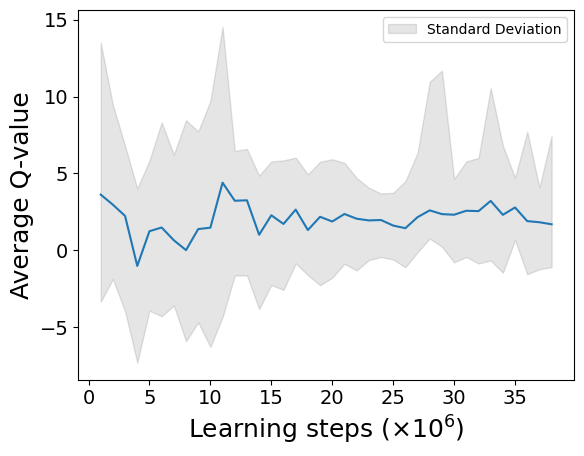

model updated


2024-07-20 20:09:25.918768: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:14:37.909517: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:20:06.779753: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:27:21.099346: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 20:42:20.919754: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6195.6

average moving queuetime :  162.3 336.8
average stay queuetime :  1162.7 2444.8
average total queuetime :  1325.0 2781.5
average chargecount :  2.2 2.1
average ordercount :  38.5 38.6
day : 2


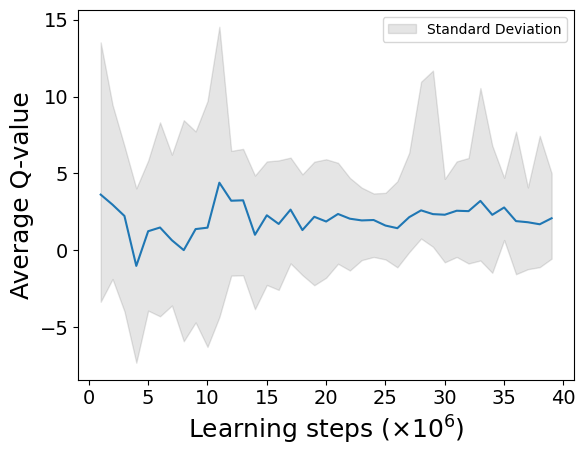

model updated


2024-07-20 21:48:00.407394: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 22:04:32.547889: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


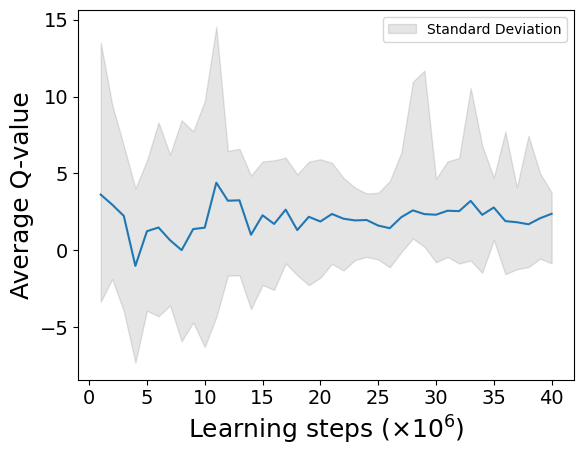

model updated

 time for simulate one day : 6276.8

average moving queuetime :  164.5 359.8
average stay queuetime :  1132.0 2277.9
average total queuetime :  1296.5 2637.7
average chargecount :  2.2 2.1
average ordercount :  38.6 39.0
[105, 61, 21, 23, 34, 26, 68, 65, 81, 86, 60, 52]
[53, 37, 47, 40, 26, 30, 30, 87, 82, 67, 60, 63]
[73, 22, 30, 41, 40, 53, 39, 46, 99, 80, 74, 42]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.583526803932272
code start to now : 194330.2
episode_reward :  -1577.7753023529874
fit_count :  401009
TD max = 29.310283162689206 TD min = 0.00010175237655630767

episode 21
day : 0


2024-07-20 23:28:37.122231: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-20 23:42:43.801225: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:05:34.901214: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:05:44.181191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


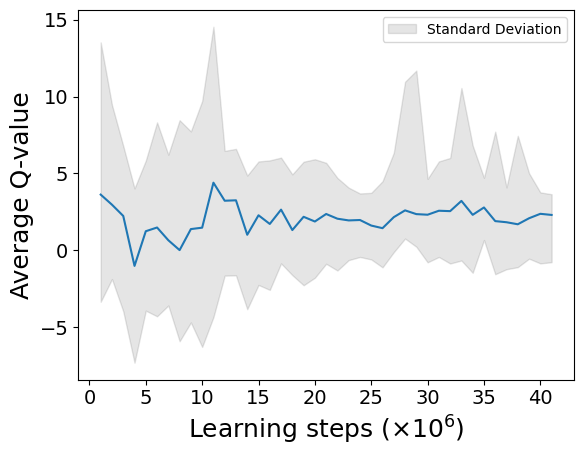

model updated


2024-07-21 00:11:02.550669: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:14:41.656287: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:15:00.569627: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6015.9

average moving queuetime :  165.1 296.6
average stay queuetime :  1063.0 1909.9
average total queuetime :  1228.1 2206.5
average chargecount :  1.8 1.8
average ordercount :  39.3 39.3
day : 1


2024-07-21 00:42:03.042490: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:46:04.029683: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:47:22.756211: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 00:56:17.818823: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:01:38.200089: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:09:21.586165: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


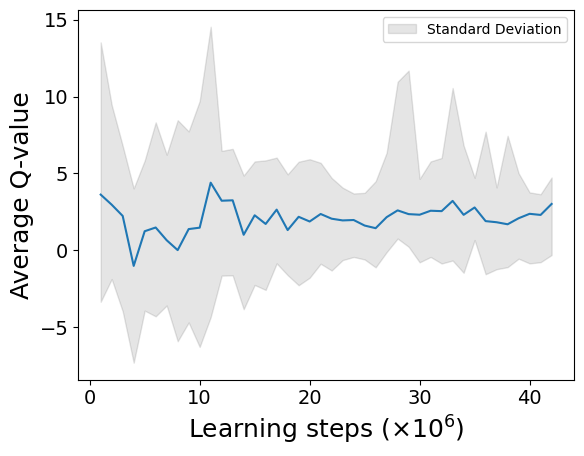

model updated


2024-07-21 01:30:37.497747: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:34:00.497958: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 01:44:13.540547: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:05:04.291194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:14:14.736878: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6206.9

average moving queuetime :  162.1 337.7
average stay queuetime :  1015.1 2062.4
average total queuetime :  1177.1 2400.0
average chargecount :  2.0 2.1
average ordercount :  39.1 38.9
day : 2


2024-07-21 02:17:47.002989: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:35:41.131746: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


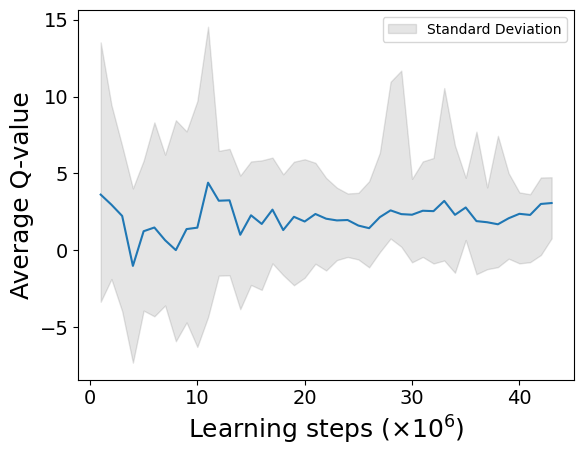

model updated


2024-07-21 02:52:47.565862: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 02:58:07.841168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:04:51.836758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:18:16.399509: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:25:52.020231: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:49:47.265430: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 03:49:58.700215: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6184.3

average moving queuetime :  160.2 316.6
average stay queuetime :  1026.1 2119.1
average total queuetime :  1186.2 2435.7
average chargecount :  2.0 2.0
average ordercount :  39.1 39.0
[35, 10, 12, 4, 11, 81, 51, 61, 71, 93, 65, 45]
[50, 35, 38, 39, 58, 25, 49, 55, 99, 79, 55, 53]
[27, 42, 31, 57, 32, 30, 41, 78, 71, 75, 63, 60]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.593560461421373
code start to now : 212748.8
episode_reward :  -1194.2105831670067
fit_count :  439244
TD max = 46.21621801147461 TD min = 0.00010175237655630767

episode 22
day : 0


2024-07-21 04:01:13.181328: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


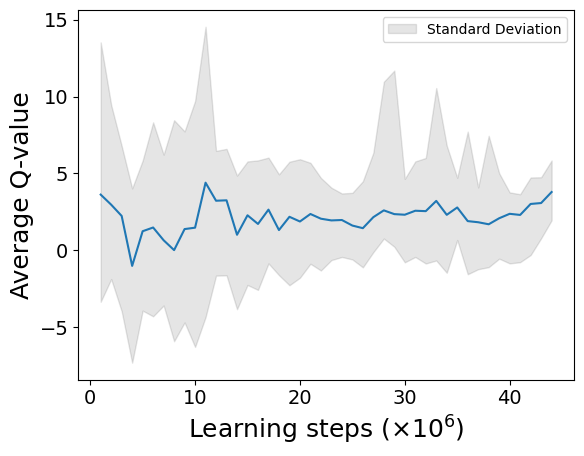

model updated


2024-07-21 04:12:26.236824: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:20:50.478520: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:31:47.429056: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:40:07.345198: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 04:40:35.916554: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:22:04.241241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


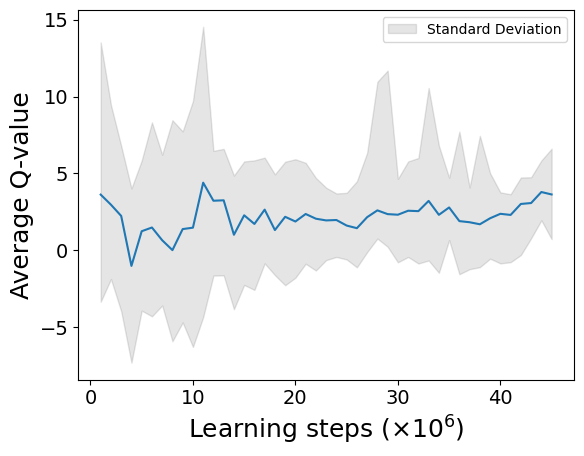

model updated

 time for simulate one day : 6060.7

average moving queuetime :  166.8 310.8
average stay queuetime :  987.0 1839.2
average total queuetime :  1153.8 2150.0
average chargecount :  1.9 1.9
average ordercount :  39.4 39.4
day : 1


2024-07-21 05:50:44.077606: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:58:24.639077: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 05:59:56.199031: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:22:53.018705: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:22:59.349011: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:31:34.984750: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 06:45:03.613777: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


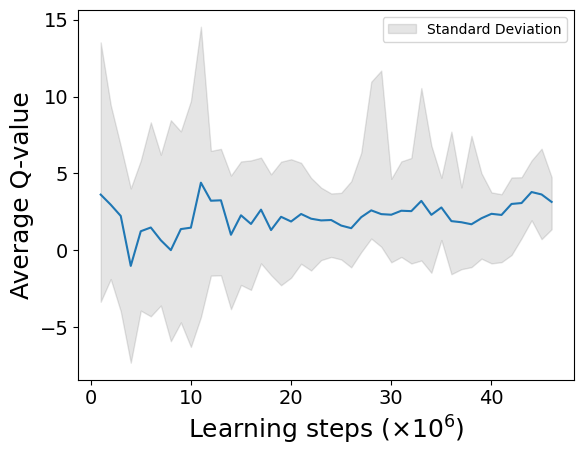

model updated


2024-07-21 06:48:10.391920: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:07:36.162817: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:09:19.715857: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:12:02.527099: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:25:27.211164: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6289.4

average moving queuetime :  165.0 353.2
average stay queuetime :  903.8 1797.2
average total queuetime :  1068.9 2150.5
average chargecount :  2.0 2.2
average ordercount :  39.4 39.3
day : 2


2024-07-21 07:43:27.156019: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 07:55:51.031124: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


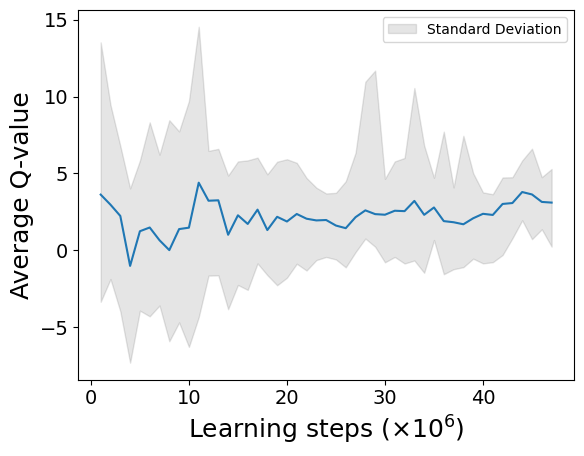

model updated


2024-07-21 08:31:29.501262: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:36:20.006073: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 08:54:09.613197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6246.1

average moving queuetime :  163.1 378.5
average stay queuetime :  901.8 2126.3
average total queuetime :  1065.0 2504.8
average chargecount :  2.1 2.4
average ordercount :  39.3 39.0
[49, 8, 3, 2, 29, 93, 44, 61, 99, 67, 68, 36]
[70, 35, 46, 37, 39, 41, 63, 77, 78, 69, 52, 41]
[89, 47, 56, 28, 32, 65, 55, 61, 84, 74, 65, 54]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.492458618095058
code start to now : 231357.6
episode_reward :  -990.7069581209295
fit_count :  477818
TD max = 46.21621801147461 TD min = 0.00010175237655630767

episode 23
day : 0


2024-07-21 09:12:00.551157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:19:54.440403: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


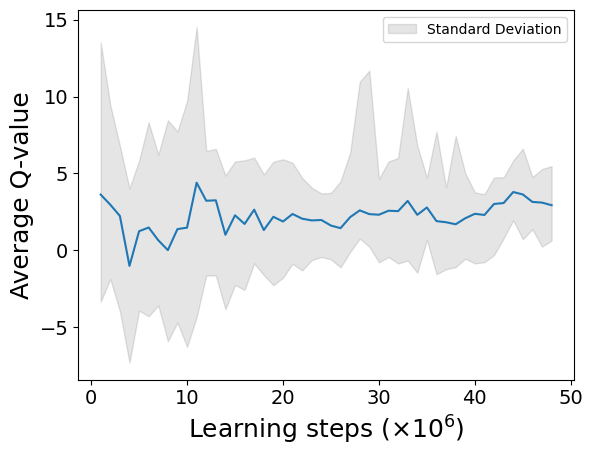

model updated


2024-07-21 09:36:22.258658: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 09:45:59.093073: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:30:53.081191: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 10:35:08.229781: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


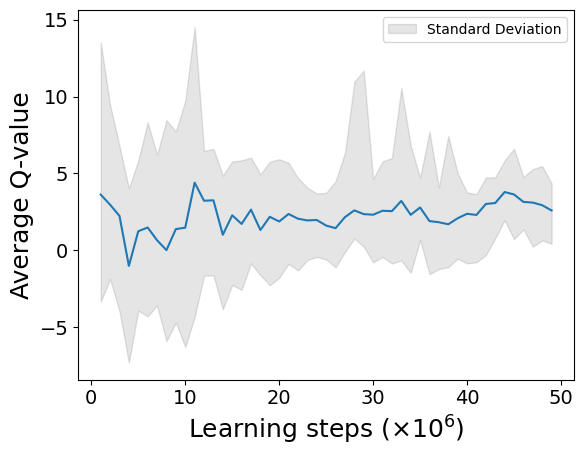

model updated

 time for simulate one day : 6083.9

average moving queuetime :  153.9 290.3
average stay queuetime :  944.1 1781.2
average total queuetime :  1098.0 2071.5
average chargecount :  1.9 1.9
average ordercount :  39.5 39.5
day : 1


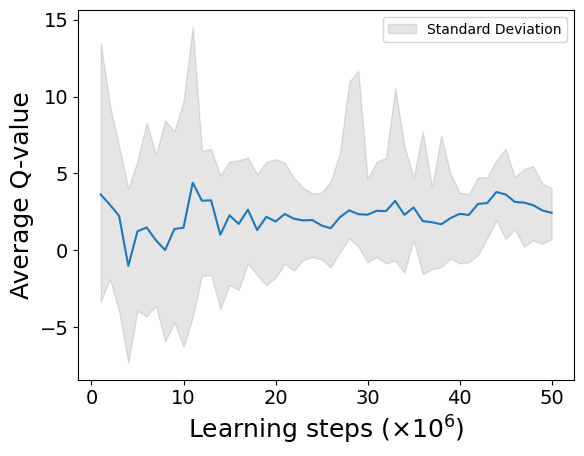

model updated


2024-07-21 12:16:14.121428: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 12:26:13.969424: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6346.5

average moving queuetime :  156.0 313.9
average stay queuetime :  888.6 1660.6
average total queuetime :  1044.6 1974.5
average chargecount :  1.9 2.0
average ordercount :  39.5 39.6
day : 2


2024-07-21 12:43:48.159994: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:18:42.130426: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:25:35.286365: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 13:26:17.309388: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


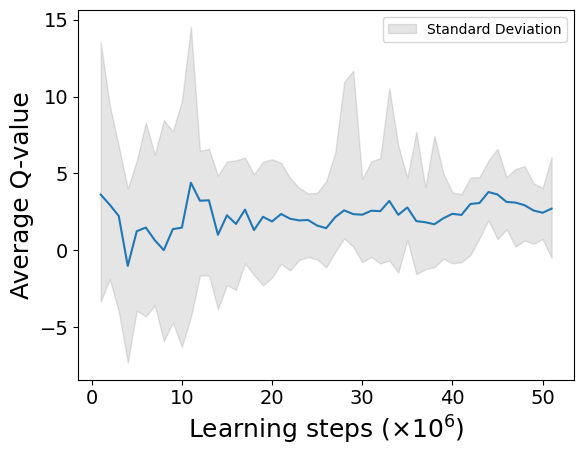

model updated


2024-07-21 13:55:59.136064: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:20:02.113740: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6324.5

average moving queuetime :  156.6 342.8
average stay queuetime :  883.9 1903.1
average total queuetime :  1040.6 2245.9
average chargecount :  2.0 2.2
average ordercount :  39.6 39.7
[45, 15, 1, 6, 47, 70, 52, 54, 89, 86, 58, 43]
[59, 27, 29, 43, 52, 31, 53, 62, 79, 76, 57, 28]
[82, 29, 34, 30, 32, 74, 43, 70, 61, 57, 87, 53]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.5268987978328
code start to now : 250124.6
episode_reward :  -811.9791250626903
fit_count :  516555
TD max = 36.498703515624996 TD min = 0.00010401496887206948

episode 24
day : 0


2024-07-21 14:35:16.237893: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:50:35.331150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


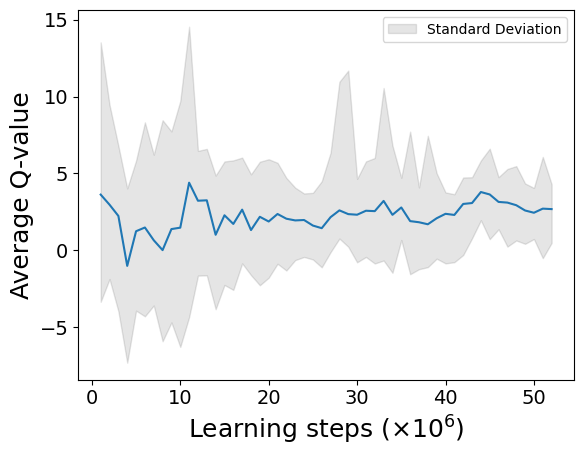

model updated


2024-07-21 14:53:44.870556: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 14:53:56.955612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:24:38.671122: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:25:18.101248: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:35:13.031202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 15:41:13.721189: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:02:40.760366: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6121.1

average moving queuetime :  149.6 268.3
average stay queuetime :  862.3 1546.4
average total queuetime :  1011.9 1814.6
average chargecount :  1.8 1.8
average ordercount :  39.7 39.7
day : 1


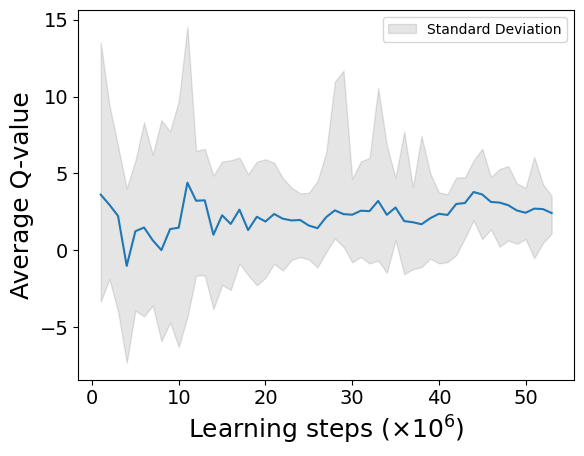

model updated


2024-07-21 16:21:40.039629: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:38:59.801788: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 16:56:00.268772: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:00:06.071110: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:04:52.585452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 17:12:25.880006: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


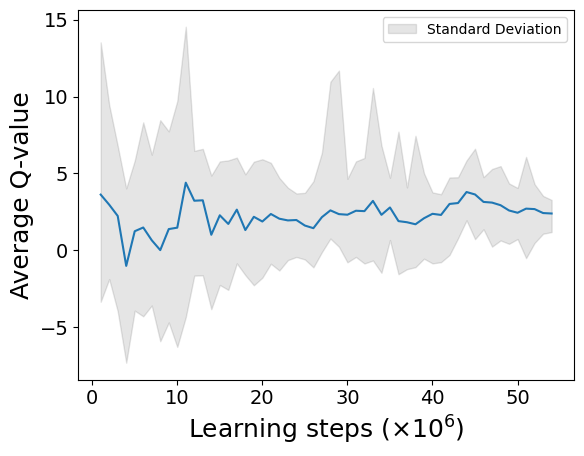

model updated


2024-07-21 17:45:48.749670: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6310.5

average moving queuetime :  152.7 321.6
average stay queuetime :  791.9 1513.0
average total queuetime :  944.6 1834.6
average chargecount :  1.9 2.1
average ordercount :  39.7 39.8
day : 2


2024-07-21 18:37:10.381188: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:42:44.110920: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 18:52:19.784559: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


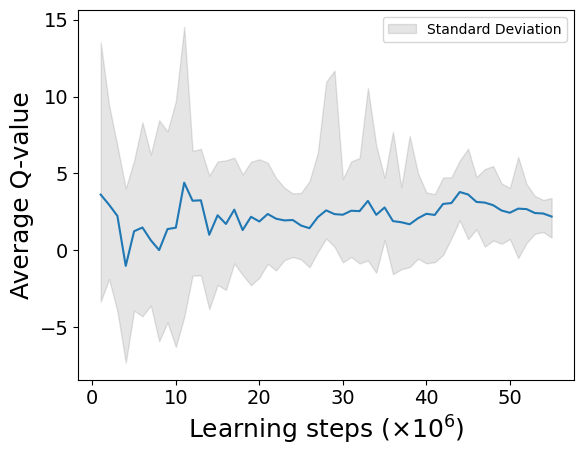

model updated

 time for simulate one day : 6327.7

average moving queuetime :  152.5 302.1
average stay queuetime :  765.0 1413.0
average total queuetime :  917.5 1715.1
average chargecount :  1.9 2.0
average ordercount :  39.8 40.0
[60, 0, 0, 9, 57, 68, 39, 45, 87, 73, 56, 44]
[69, 21, 44, 60, 23, 48, 63, 42, 86, 65, 47, 53]
[72, 29, 43, 39, 32, 35, 58, 70, 32, 70, 68, 47]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.562367125910432
code start to now : 268895.7
episode_reward :  -493.5832121540909
fit_count :  555471
TD max = 13.113651359176636 TD min = 0.0001002622604369229

episode 25
day : 0


2024-07-21 19:56:00.152263: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:13:12.193105: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


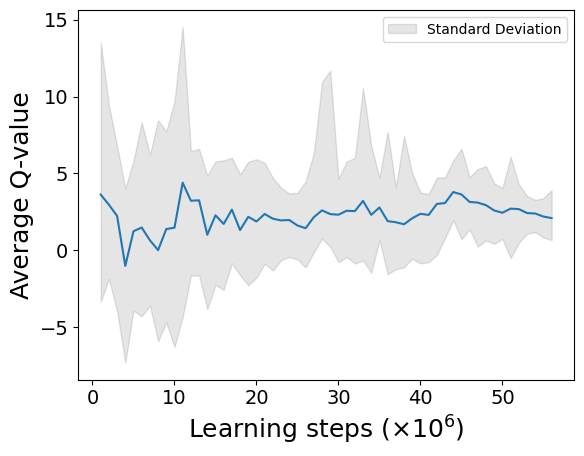

model updated


2024-07-21 20:19:41.148816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:22:06.050046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:39:25.769769: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 20:54:38.718216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:12:00.841169: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:13:09.766160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6168.4

average moving queuetime :  149.1 257.9
average stay queuetime :  716.9 1240.2
average total queuetime :  866.0 1498.1
average chargecount :  1.7 1.7
average ordercount :  40.3 40.3
day : 1


2024-07-21 21:20:10.721145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


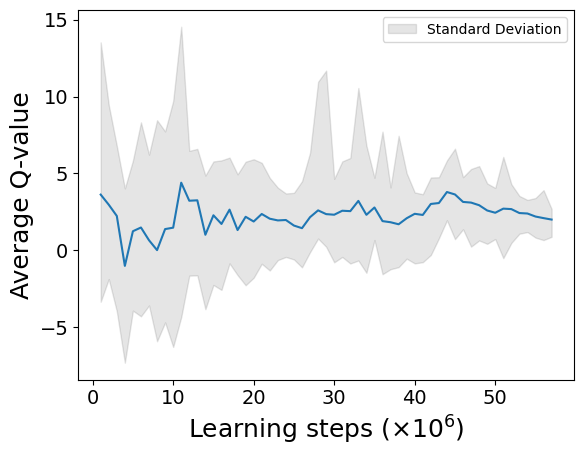

model updated


2024-07-21 21:41:30.550747: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:43:48.052745: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 21:55:43.271185: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:01:56.181118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:15:16.510301: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:31:47.661280: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:32:52.192382: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 22:38:05.735315: W tensorflow/core/data/root_dataset.cc:24

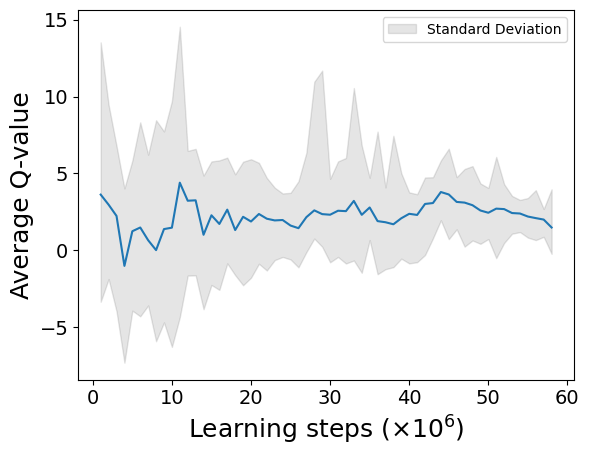

model updated
so long waited in  7
day start to termianl : 41492.2

 time for simulate one day : 5994.8
so long waited in  7
day start to termianl : 41492.2
so long waited in  7
day start to termianl : 41492.2
so long waited in  7
day start to termianl : 41492.2
so long waited in  7
day start to termianl : 41492.2
so long waited in  7
day start to termianl : 41492.2
so long waited in  7
day start to termianl : 41492.2

average moving queuetime :  145.7 278.1
average stay queuetime :  754.9 1537.9
average total queuetime :  900.6 1816.0
average chargecount :  1.8 1.9
average ordercount :  39.1 37.9
[52, 8, 0, 13, 60, 56, 39, 31, 64, 75, 67, 54]
[75, 20, 36, 44, 33, 42, 45, 48, 53, 85, 51, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.090588703198495
code start to now : 281070.7
episode_reward :  -546.9014633591252
fit_count :  580514
TD max = 64.05454122314454 TD min = 0.0001002622604369229

episode 26
day : 0


2024-07-21 23:01:11.988202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:07:03.231176: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:19:39.955579: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:24:55.290612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:26:33.862096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-21 23:29:21.684452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 37371.9

 time for simulate one day : 4373.3
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long waited in  7
day start to termianl : 37371.9
so long w

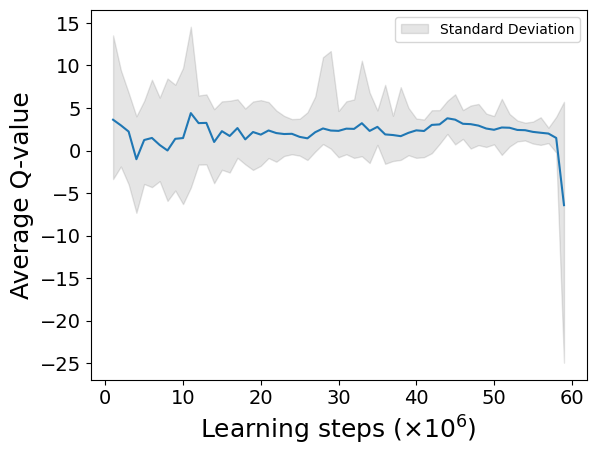

model updated


2024-07-22 00:18:06.552555: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:19:28.830353: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 00:49:24.458981: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:01:57.088787: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:08:49.200495: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:25:59.769081: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 01:35:17.411120: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


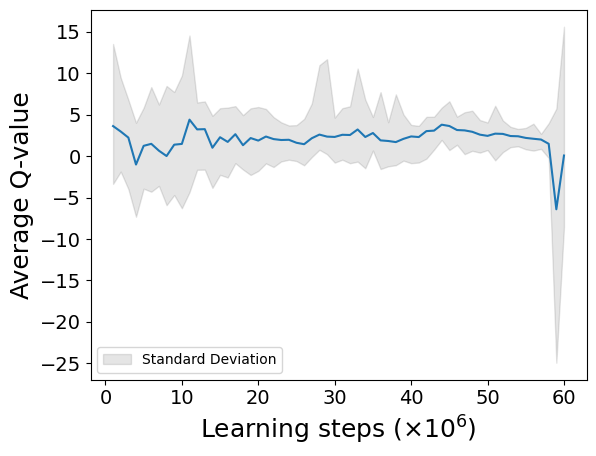

model updated

 time for simulate one day : 6269.3

average moving queuetime :  159.9 294.2
average stay queuetime :  1017.8 1872.8
average total queuetime :  1177.7 2167.0
average chargecount :  1.8 1.8
average ordercount :  39.5 39.5
day : 1


2024-07-22 02:03:06.741157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:17:47.371175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:26:26.079237: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:36:16.917992: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:46:10.045892: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 02:53:50.515065: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


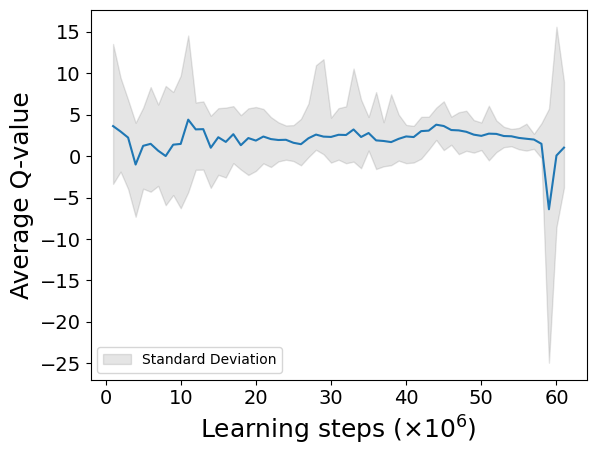

model updated


2024-07-22 03:27:12.591154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6307.5

average moving queuetime :  162.7 353.3
average stay queuetime :  979.4 2025.3
average total queuetime :  1142.1 2378.5
average chargecount :  2.0 2.1
average ordercount :  39.4 39.4
day : 2


2024-07-22 03:56:28.956615: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:01:06.670686: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:01:22.269648: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:08:26.046381: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:11:29.911163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:18:38.208835: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


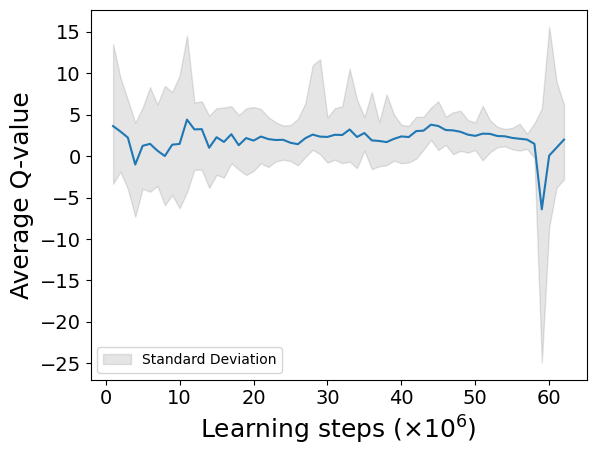

model updated


2024-07-22 04:40:53.020244: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:43:00.618282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:43:26.521239: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 04:49:23.161129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:11:33.241124: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42816.4

 time for simulate one day : 6011.5
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long waited in  7
day start to termianl : 42816.4
so long w

2024-07-22 05:26:49.155741: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 05:39:48.899319: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


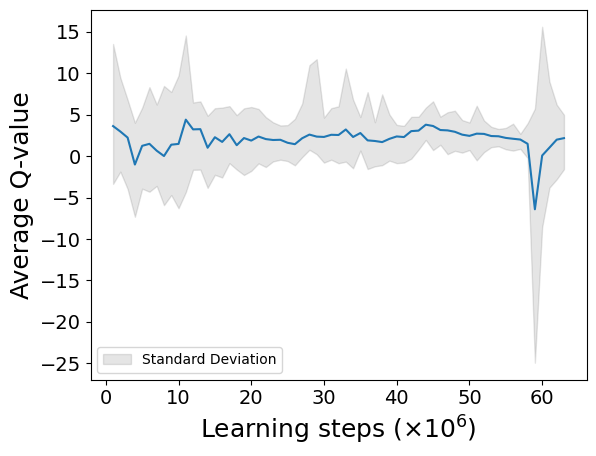

model updated


2024-07-22 05:53:44.774246: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 06:25:25.001247: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 36457.6

 time for simulate one day : 4107.1
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long waited in  7
day start to termianl : 36457.6
so long w

2024-07-22 06:43:47.140968: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 06:46:54.241219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 06:57:38.245801: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


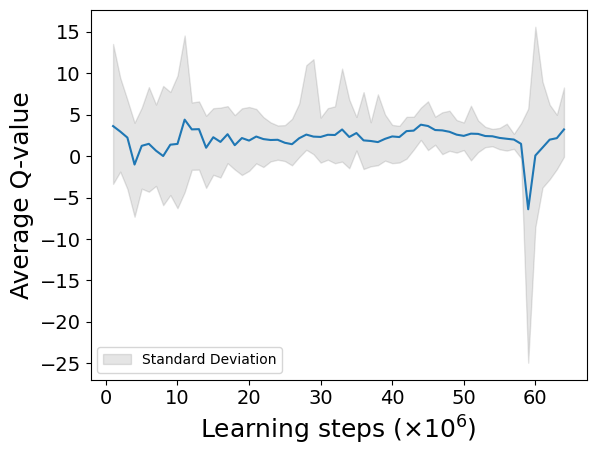

model updated


2024-07-22 07:08:59.174316: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:18:14.985959: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 07:39:58.993341: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 34496.9

 time for simulate one day : 4448.6
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9
so long waited in  7
day start to termianl : 34496.9

average moving queuetime :  147.6 166.3
average stay queuetime :  922.5 1039.3
average total queuetime :  1070.1 1205.6
average chargecount :  1.1 1.1
average ordercou

2024-07-22 08:10:30.037980: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:16:57.022983: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:17:06.829307: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 08:25:17.330974: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


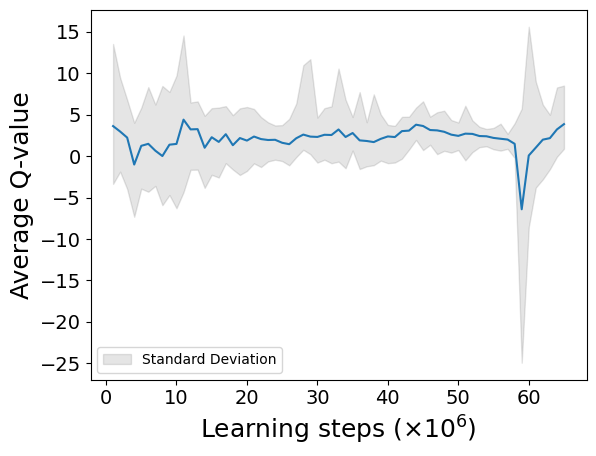

model updated


2024-07-22 08:44:27.383601: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 35100.4

 time for simulate one day : 4623.2

average moving queuetime :  159.9 228.1
average stay queuetime :  810.7 1156.6
average total queuetime :  970.6 1384.7
average chargecount :  1.4 1.4
average ordercount :  29.9 29.9
[43, 24, 32, 45, 29, 24, 27, 76, 67, 10, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.3268165514077008
code start to now : 317445.5
episode_reward :  -415.4609812872749
fit_count :  654273
TD max = 62.59568130264283 TD min = 0.00010064790248865965

episode 31
day : 0


2024-07-22 09:32:18.850822: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:35:03.323448: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 09:52:13.411184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


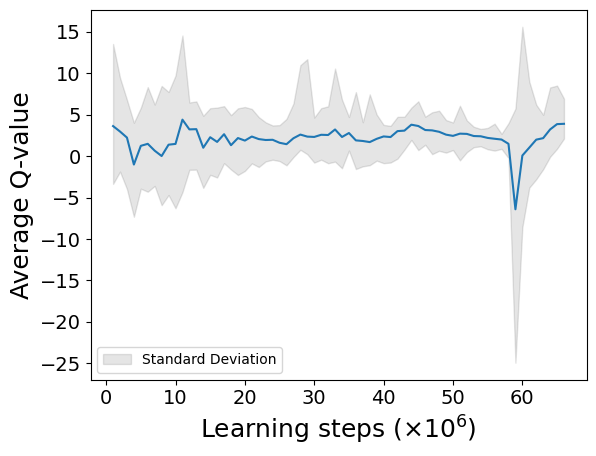

model updated


2024-07-22 10:10:15.583168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 10:15:10.451303: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 10:22:57.741209: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39315.4

 time for simulate one day : 5407.5
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4
so long waited in  7
day start to termianl : 39315.4

average 

2024-07-22 10:37:10.347486: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 10:59:37.263707: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


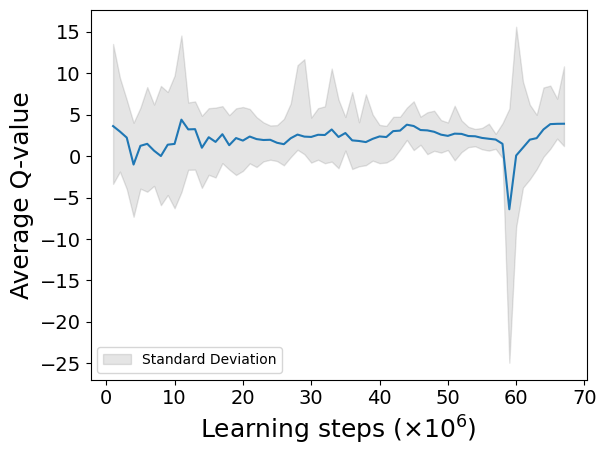

model updated


2024-07-22 11:37:44.392716: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:44:34.162730: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 11:58:26.549058: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 37054.1

 time for simulate one day : 5009.4
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1
so long waited in  7
day start to termianl : 37054.1

average moving queuetime :  157.0 196.8
average stay queuetim

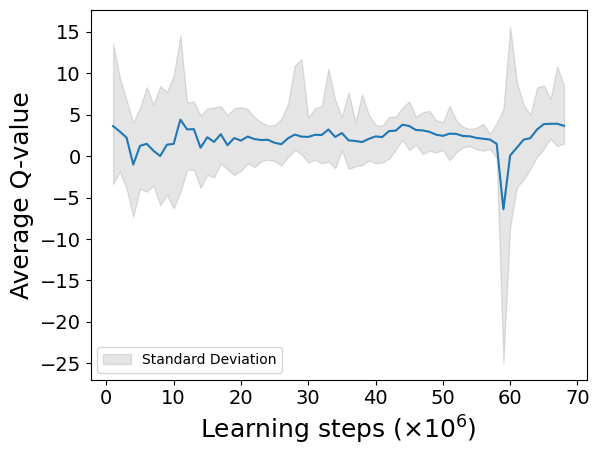

model updated


2024-07-22 12:56:11.330348: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 13:24:40.967623: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41732.3

 time for simulate one day : 5796.5
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long waited in  7
day start to termianl : 41732.3
so long w

2024-07-22 13:40:49.150497: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 13:55:01.899887: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 13:55:36.188627: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 13:55:47.621137: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


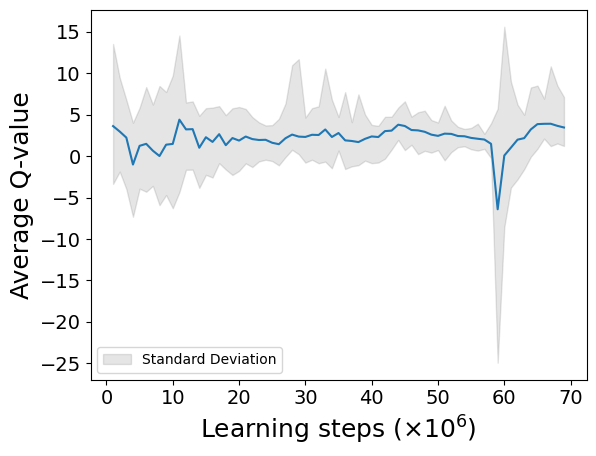

model updated


2024-07-22 14:07:36.220590: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:17:33.286727: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:18:27.841363: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:47:31.525386: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 14:53:21.380272: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39817.9

 time for simulate one day : 5497.7
so long waited in  7
day start to termianl : 39817.9
so long waited in  7
day start to termianl : 39817.9
so long waited in  7
day start to termianl : 39817.9
so long waited in  7
day start to termianl : 39817.9
so long waited in  7
day start to termianl : 39817.9
so long waited in  7
day start to termianl : 39817.9

average moving queuetime :  155.0 242.2
average stay queuetime :  1047.6 1637.7
average total queuetime :  1202.5 1879.9
average chargecount :  1.6 1.6
average ordercount :  36.0 36.0
[29, 17, 13, 3, 36, 40, 36, 56, 85, 71, 19, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.485994560907201
code start to now : 339209.8
episode_reward :  -624.4836983768416
fit_count :  698141
TD max = 77.15006070861817 TD min = 0.00010418186187745029

episode 35
day : 0


2024-07-22 15:19:44.689493: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


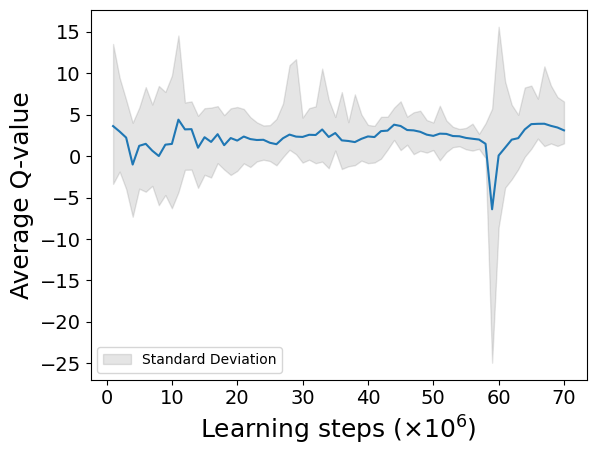

model updated


2024-07-22 15:29:37.191175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:00:41.869195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:02:55.425804: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:21:31.401272: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 16:28:11.202498: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 37807.6

 time for simulate one day : 5182.5
so long waited in  7
day start to termianl : 37807.6
so long waited in  7
day start to termianl : 37807.6
so long waited in  7
day start to termianl : 37807.6
so long waited in  7
day start to termianl : 37807.6

average moving queuetime :  152.0 210.3
average stay queuetime :  1040.9 1439.9
average total queuetime :  1192.9 1650.2
average chargecount :  1.4 1.4
average ordercount :  33.3 33.3
[39, 17, 4, 4, 8, 29, 44, 71, 80, 50, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4387255498485907
code start to now : 344399.5
episode_reward :  -538.7201482009629
fit_count :  708480
TD max = 77.67593379745483 TD min = 0.00010418186187745029

episode 36
day : 0


2024-07-22 16:52:45.624789: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


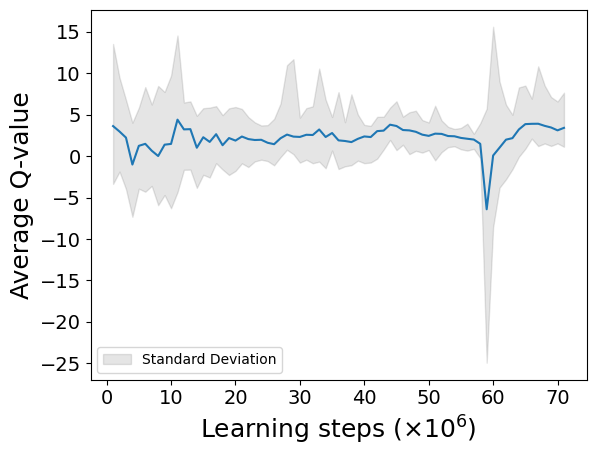

model updated


2024-07-22 17:15:10.191145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:04:04.941452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 34331.3

 time for simulate one day : 5581.8

average moving queuetime :  153.7 167.1
average stay queuetime :  772.9 839.8
average total queuetime :  926.6 1006.9
average chargecount :  1.1 1.1
average ordercount :  29.2 29.2
[40, 12, 8, 2, 15, 21, 46, 84, 61, 4, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.267336220144895
code start to now : 349984.6
episode_reward :  -328.4212571467171
fit_count :  717521
TD max = 82.4049494720459 TD min = 0.00010418186187745029

episode 37
day : 0


2024-07-22 18:12:19.140828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:15:47.680108: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 18:24:33.422192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


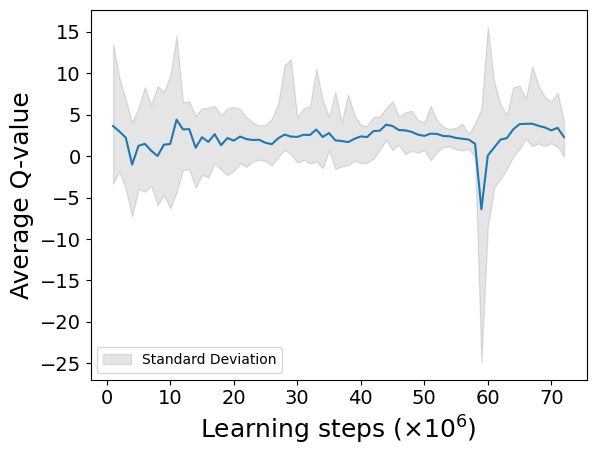

model updated


2024-07-22 18:58:22.179306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 19:03:42.101145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 19:10:41.953104: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 19:34:45.291072: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39747.4

 time for simulate one day : 5550.2
so long waited in  7
day start to termianl : 39747.4

average moving queuetime :  152.4 242.3
average stay queuetime :  948.7 1508.4
average total queuetime :  1101.1 1750.7
average chargecount :  1.6 1.6
average ordercount :  35.9 35.9
[45, 4, 10, 6, 42, 59, 35, 21, 99, 78, 13, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4907583952868493
code start to now : 355538.7
episode_reward :  -527.1404570684646
fit_count :  728707
TD max = 39.322607934570314 TD min = 0.00010418186187745029

episode 38
day : 0


2024-07-22 19:43:22.259077: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 19:49:05.401184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


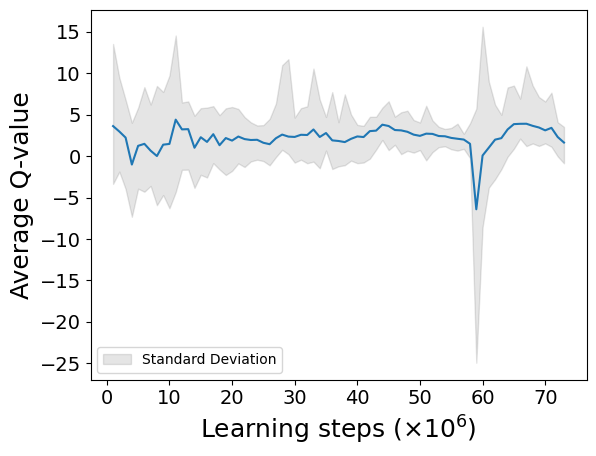

model updated


2024-07-22 19:52:50.448038: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 20:00:41.728925: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 20:01:52.139412: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 20:06:24.161672: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 20:20:59.481926: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 31650.8

 time for simulate one day : 3847.5
so long waited in  7
day start to termianl : 31650.8
so long waited in  7
day start to termianl : 31650.8
so long waited in  7
day start to termianl : 31650.8

average moving queuetime :  168.8 157.0
average stay queuetime :  706.7 657.3
average total queuetime :  875.5 814.2
average chargecount :  0.9 0.9
average ordercount :  25.2 25.2
[42, 6, 8, 5, 14, 19, 18, 104, 20, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.1943572548674581
code start to now : 359392.9
episode_reward :  -229.66889801679585
fit_count :  736497
TD max = 55.88584390411377 TD min = 0.00011323699951161217

episode 39
day : 0


2024-07-22 21:12:35.300462: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


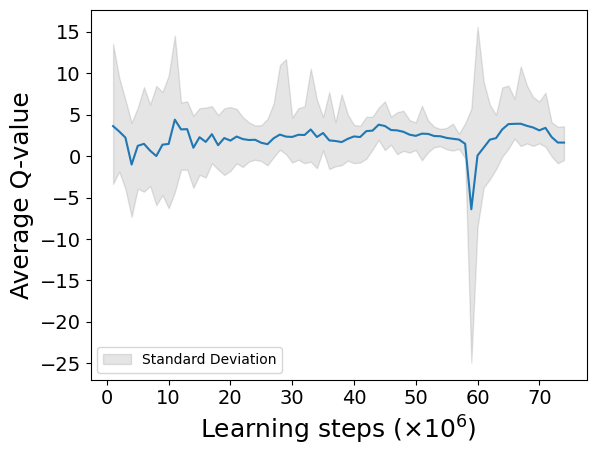

model updated


2024-07-22 21:13:55.300076: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 21:15:50.243017: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:04:04.030491: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 22:12:00.346160: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6021.5

average moving queuetime :  167.8 295.3
average stay queuetime :  1201.9 2115.3
average total queuetime :  1369.6 2410.6
average chargecount :  1.8 1.8
average ordercount :  38.9 38.9
day : 1


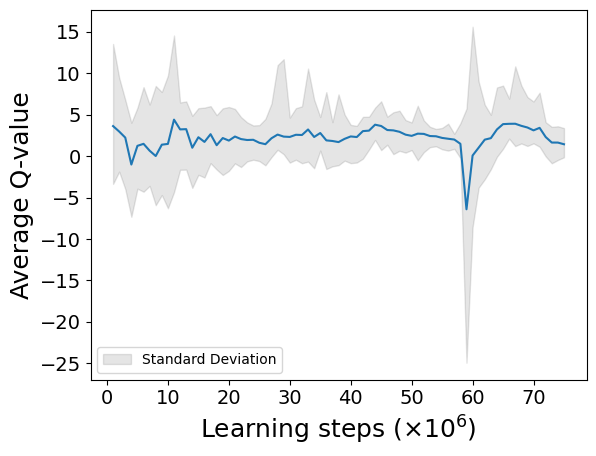

model updated


2024-07-22 22:52:07.329105: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:03:39.760387: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:06:40.568971: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:25:53.731202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:29:45.826954: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:38:34.601168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-22 23:46:56.191219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


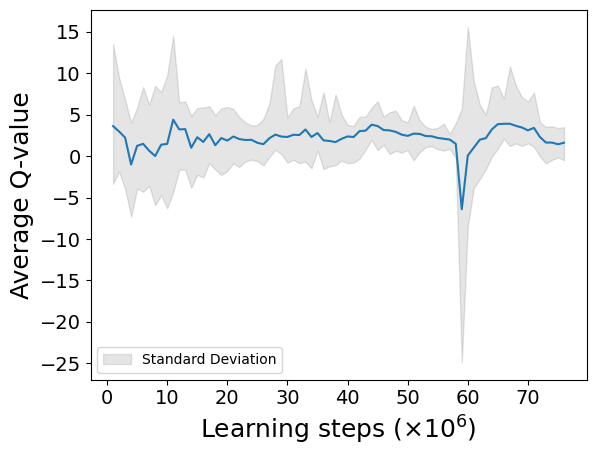

model updated


2024-07-23 00:00:41.628446: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:02:58.502046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6280.3

average moving queuetime :  164.4 298.3
average stay queuetime :  1108.6 1886.6
average total queuetime :  1273.0 2184.8
average chargecount :  1.8 1.9
average ordercount :  39.1 39.3
day : 2


2024-07-23 00:21:10.637054: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:35:37.974412: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:39:38.208045: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 00:54:35.281211: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 01:05:04.127261: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


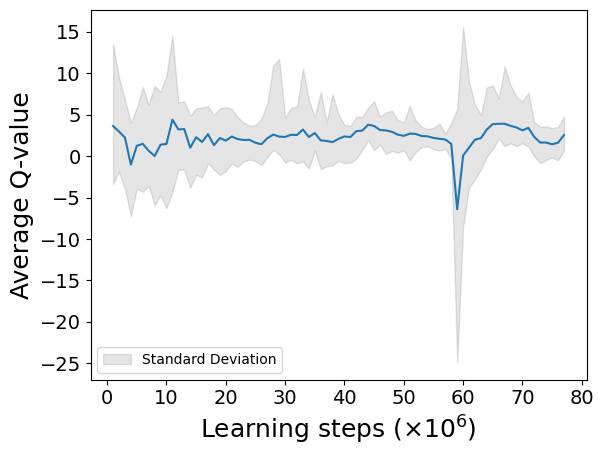

model updated


2024-07-23 01:25:36.039699: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 01:29:09.291146: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6179.1

average moving queuetime :  165.3 298.8
average stay queuetime :  1080.0 1830.4
average total queuetime :  1245.3 2129.2
average chargecount :  1.8 1.8
average ordercount :  39.2 39.2
[41, 10, 4, 1, 17, 44, 51, 90, 80, 63, 74, 53]
[16, 13, 53, 31, 22, 65, 28, 68, 80, 57, 77, 45]
[30, 24, 42, 32, 22, 42, 81, 60, 60, 61, 39, 44]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.572883247907341
code start to now : 377886.0
episode_reward :  -1193.996507639658
fit_count :  774637
TD max = 37.03960808048249 TD min = 0.00010411987304671513

episode 40
day : 0


2024-07-23 01:58:48.274618: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:12:33.851853: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:18:56.941386: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:34:33.561142: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 02:35:18.691306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


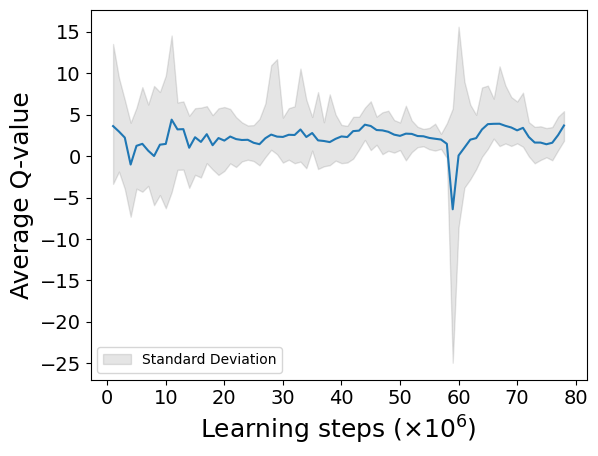

model updated


2024-07-23 03:13:22.151181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 03:22:16.149990: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42653.7

 time for simulate one day : 6020.2

average moving queuetime :  161.1 312.1
average stay queuetime :  886.8 1717.4
average total queuetime :  1047.9 2029.5
average chargecount :  1.9 1.9
average ordercount :  38.7 38.7
[77, 46, 27, 30, 39, 34, 30, 72, 47, 84, 60, 9]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5158197160865425
code start to now : 383910.2
episode_reward :  -538.4660511632364
fit_count :  786875
TD max = 34.44892133483887 TD min = 0.00010006437301647289

episode 41
day : 0


2024-07-23 03:35:07.931227: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


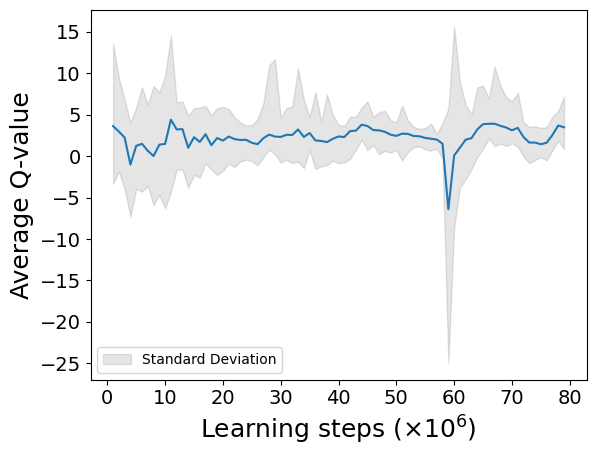

model updated


2024-07-23 04:19:23.071150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:21:29.852517: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:22:03.903803: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:35:50.217180: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:39:31.795787: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 04:53:11.597636: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 40444.4

 time for simulate one day : 5677.8
so long waited in  7
day start to termianl : 40444.4
so long waited in  7
day start to termianl : 40444.4

average moving queuetime :  154.0 228.4
average stay queuetime :  866.4 1285.2
average total queuetime :  1020.4 1513.6
average chargecount :  1.5 1.5
average ordercount :  36.8 36.8
[38, 5, 15, 1, 35, 38, 35, 44, 77, 69, 37, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.505941630772365
code start to now : 389591.9
episode_reward :  -479.2653382894451
fit_count :  798317
TD max = 46.742422592735295 TD min = 0.00010006437301647289

episode 42
day : 0


2024-07-23 05:08:01.801206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


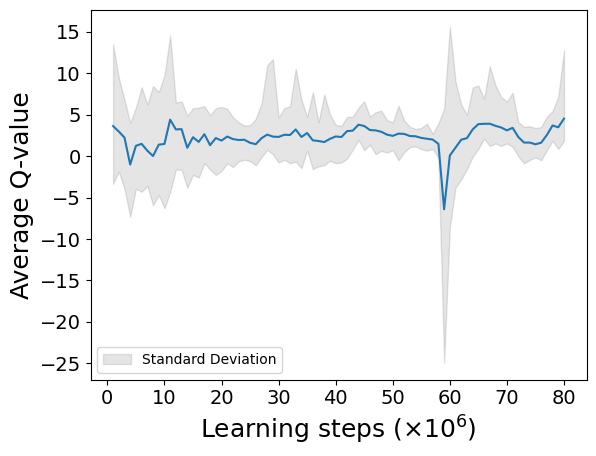

model updated


2024-07-23 05:31:19.339696: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:51:11.652289: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:56:03.611308: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:57:02.553517: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:58:28.888328: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 05:58:58.750484: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 06:15:56.831222: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


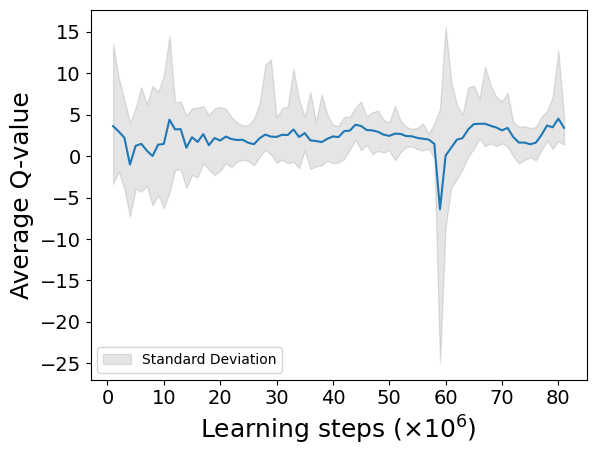

model updated
so long waited in  7
day start to termianl : 42222.7

 time for simulate one day : 6039.3
so long waited in  7
day start to termianl : 42222.7
so long waited in  7
day start to termianl : 42222.7
so long waited in  7
day start to termianl : 42222.7

average moving queuetime :  160.5 253.0
average stay queuetime :  1006.9 1587.5
average total queuetime :  1167.4 1840.5
average chargecount :  1.6 1.6
average ordercount :  38.6 38.6
[55, 3, 2, 5, 24, 49, 35, 51, 69, 75, 57, 12]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5418285315978482
code start to now : 395638.9
episode_reward :  -556.3988954402979
fit_count :  810338
TD max = 47.79415350208283 TD min = 0.00010006437301647289

episode 43
day : 0


2024-07-23 07:44:00.711147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 07:54:42.611338: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:00:44.991396: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:07:21.624062: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


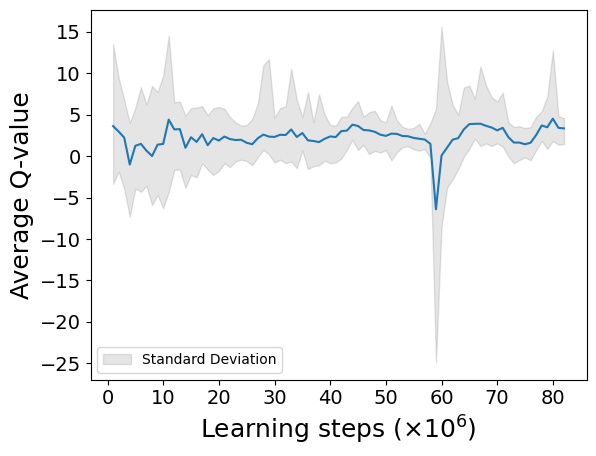

model updated
so long waited in  7
day start to termianl : 41594.5

 time for simulate one day : 5824.1
so long waited in  7
day start to termianl : 41594.5

average moving queuetime :  171.4 260.6
average stay queuetime :  966.7 1469.4
average total queuetime :  1138.1 1730.0
average chargecount :  1.5 1.5
average ordercount :  37.8 37.8
[33, 20, 7, 2, 28, 35, 31, 75, 63, 70, 51, 2]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5127209219009992
code start to now : 401470.8
episode_reward :  -557.0631578792305
fit_count :  822104
TD max = 47.79415350208283 TD min = 0.00010006437301647289

episode 44
day : 0


2024-07-23 08:25:35.419374: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:29:20.851448: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:34:43.480096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 08:48:31.575080: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 09:00:55.356644: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 09:23:00.209427: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


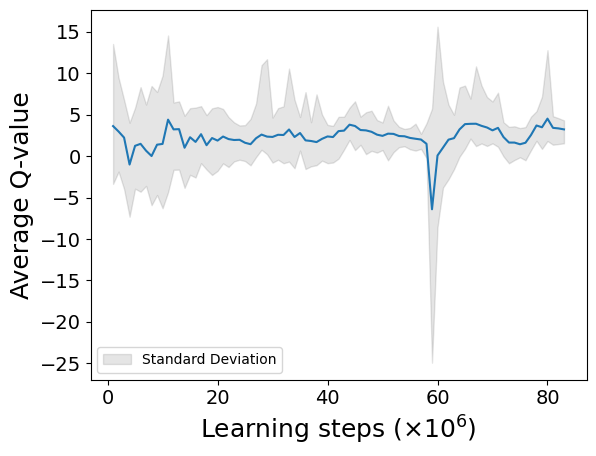

model updated


2024-07-23 09:51:41.320844: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 10:07:53.914410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38981.0

 time for simulate one day : 6566.7

average moving queuetime :  167.6 234.1
average stay queuetime :  936.2 1307.5
average total queuetime :  1103.7 1541.6
average chargecount :  1.4 1.4
average ordercount :  35.1 35.1
[34, 12, 12, 3, 32, 42, 18, 74, 78, 61, 16, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4366208424865354
code start to now : 408041.2
episode_reward :  -510.1727934492404
fit_count :  833013
TD max = 39.732956039669034 TD min = 0.00010006437301647289

episode 45
day : 0


2024-07-23 10:54:01.631264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:01:56.764468: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


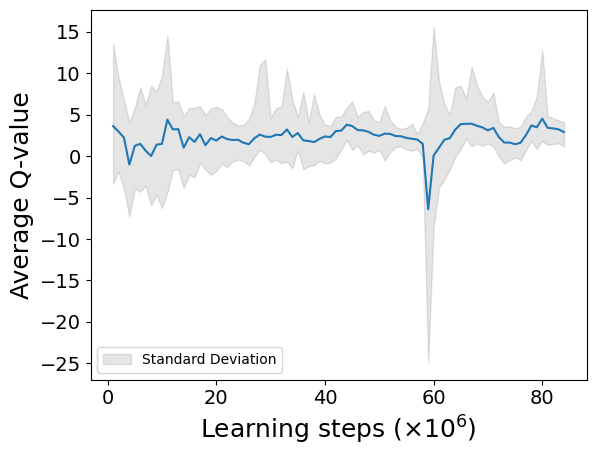

model updated


2024-07-23 11:33:30.789959: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 11:41:49.509385: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41460.4

 time for simulate one day : 5820.7
so long waited in  7
day start to termianl : 41460.4
so long waited in  7
day start to termianl : 41460.4
so long waited in  7
day start to termianl : 41460.4

average moving queuetime :  161.7 241.5
average stay queuetime :  855.9 1278.2
average total queuetime :  1017.6 1519.6
average chargecount :  1.5 1.5
average ordercount :  38.0 38.0
[28, 13, 17, 3, 10, 45, 40, 56, 55, 61, 62, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.549671426303051
code start to now : 413866.0
episode_reward :  -451.3008595955293
fit_count :  844804
TD max = 28.15151001701355 TD min = 0.00010006437301647289

episode 46
day : 0


2024-07-23 11:57:49.026793: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:26:22.297537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:26:27.628683: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:29:21.828749: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


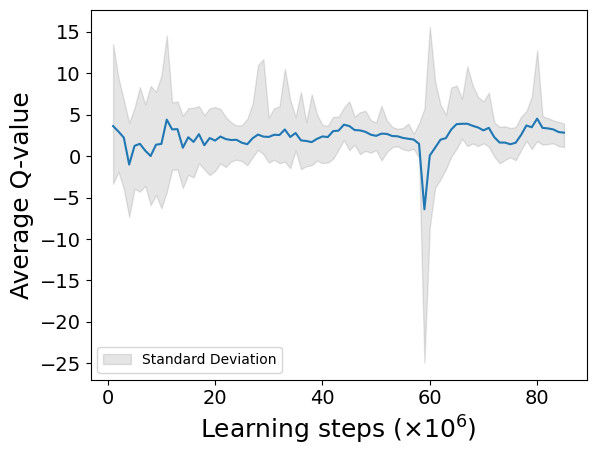

model updated


2024-07-23 12:49:54.961166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 12:55:25.355353: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:12:52.932040: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:13:33.526069: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 35947.8

 time for simulate one day : 4932.3
so long waited in  7
day start to termianl : 35947.8

average moving queuetime :  178.2 212.6
average stay queuetime :  606.1 723.2
average total queuetime :  784.3 935.9
average chargecount :  1.2 1.2
average ordercount :  32.0 32.0
[58, 1, 1, 0, 37, 58, 5, 53, 84, 25, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.3235594552200105
code start to now : 418801.9
episode_reward :  -298.1582334667616
fit_count :  854733
TD max = 26.501659486389162 TD min = 0.00010006437301647289

episode 47
day : 0


2024-07-23 13:15:21.363115: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:19:48.803415: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 13:54:48.591130: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


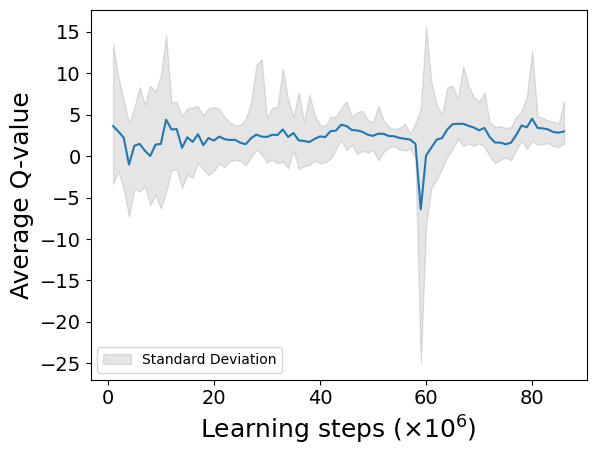

model updated


2024-07-23 14:00:06.971307: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:20:26.922915: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:20:54.101178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:30:27.790971: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 14:41:42.959277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43943.0

 time for simulate one day : 6034.1
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0
so long waited in  7
day start to termianl : 43943.0

average moving queuetime :  161.1 257.7
average stay queuetime :  1193.6 1909.7
average total queuetime :  1354.7 2167.5
average chargecount :  1.6 1.6
average ordercount :  39.3 39.3
[57, 0, 3, 2, 19, 32, 47, 45, 73, 66, 57, 35]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]


2024-07-23 15:01:16.441172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:13:30.460318: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


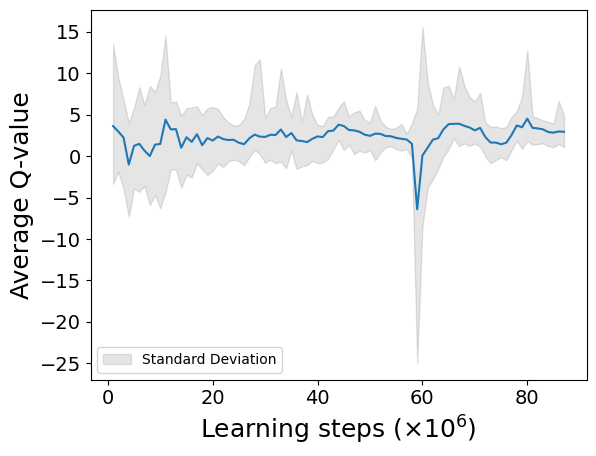

model updated


2024-07-23 15:20:00.131155: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:21:20.105204: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:32:45.318203: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:49:42.557007: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 15:56:26.949549: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:01:16.088985: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:05:38.783947: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:07:31.482571: W tensorflow/core/data/root_dataset.cc:24

so long waited in  7
day start to termianl : 42447.4

 time for simulate one day : 5908.4
so long waited in  7
day start to termianl : 42447.4

average moving queuetime :  162.1 261.6
average stay queuetime :  966.7 1559.6
average total queuetime :  1128.8 1821.2
average chargecount :  1.6 1.6
average ordercount :  38.4 38.4
[44, 8, 7, 4, 34, 45, 15, 56, 81, 66, 49, 2]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5989423206229754
code start to now : 430779.3
episode_reward :  -487.83253573820457
fit_count :  879176
TD max = 37.83754250297547 TD min = 0.00010006437301647289

episode 49
day : 0


2024-07-23 16:33:51.949816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:36:23.138314: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 16:38:12.101184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


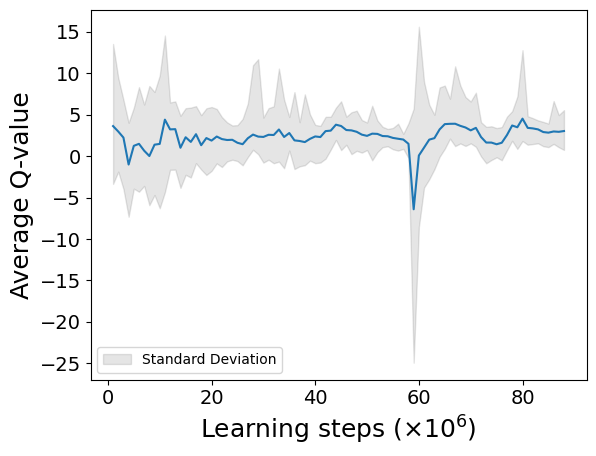

model updated


2024-07-23 17:11:35.745046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:13:23.807744: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:30:27.703523: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 17:52:38.881172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 18:08:45.290118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


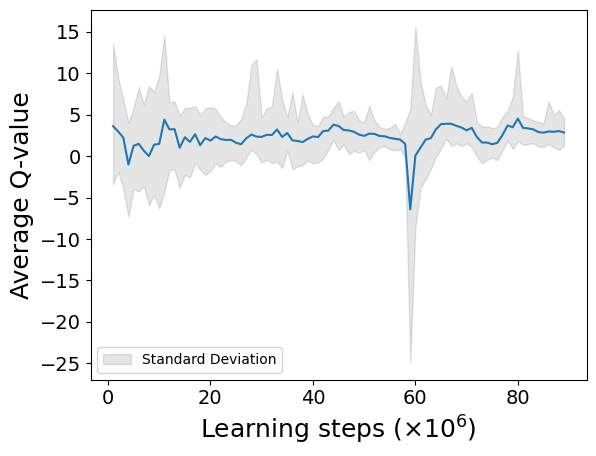

model updated
so long waited in  7
day start to termianl : 42976.6

 time for simulate one day : 7100.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6
so long waited in  7
day start to termianl : 42976.6

average moving queuetime :  167.9 296.0
average stay queuetime :  1134.0 1999.6
average total queuetime :  1301.9 2295.6
average chargecount :  1.8 1.8
average ordercount :  38.7 38.7
[52, 5, 3, 5, 42, 42, 52, 45, 77, 83, 52, 21]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5768485791160944
code start to now : 437887.8
episode_reward :  -571.8782573152557
fit_count :  891413
TD max = 40.2229332901001 TD mi

2024-07-23 18:35:47.891172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 19:35:18.155219: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


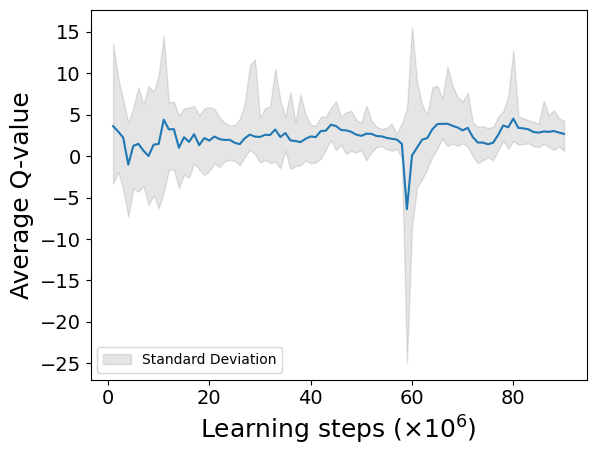

model updated


2024-07-23 19:59:11.946162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:08:46.378335: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43918.3

 time for simulate one day : 6167.2
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3
so long waited in  7
day start to termianl : 43918.3

average moving queuetime :  168.8 320.2
average stay queuetime :  1145.4 2172.4
average total queuetime :  1314.2 2492.6
average chargecount :  1.9 1.9
average ordercount :  39.0 39.0
[97, 15, 23, 22, 32, 26, 31, 75, 58, 65, 63, 26]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5795532664178487
code start to now : 444077.6
episode_reward :  -633.6608559999545
fit_count :  903905
TD max = 59.216307504272464 TD min = 0.000

2024-07-23 20:23:23.629440: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:26:25.298270: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:29:32.565188: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:35:34.869802: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:38:48.791155: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 20:44:27.304750: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:02:05.608008: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


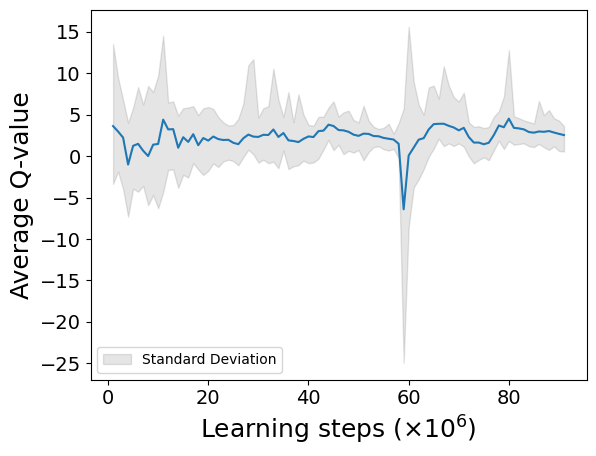

model updated


2024-07-23 21:07:05.506832: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:11:18.107908: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:30:20.337605: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:30:56.889581: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:43:08.111132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 21:46:40.129568: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42443.5

 time for simulate one day : 6051.9
so long waited in  7
day start to termianl : 42443.5
so long waited in  7
day start to termianl : 42443.5
so long waited in  7
day start to termianl : 42443.5

average moving queuetime :  150.6 255.0
average stay queuetime :  859.9 1456.2
average total queuetime :  1010.6 1711.2
average chargecount :  1.7 1.7
average ordercount :  39.1 39.1
[37, 19, 4, 7, 57, 57, 30, 33, 100, 42, 67, 15]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.532165159357705
code start to now : 450137.4
episode_reward :  -481.43261983867075
fit_count :  916145
TD max = 79.88472521076203 TD min = 0.0001003725290298462

episode 52
day : 0


2024-07-23 22:21:54.953457: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 22:25:50.624178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


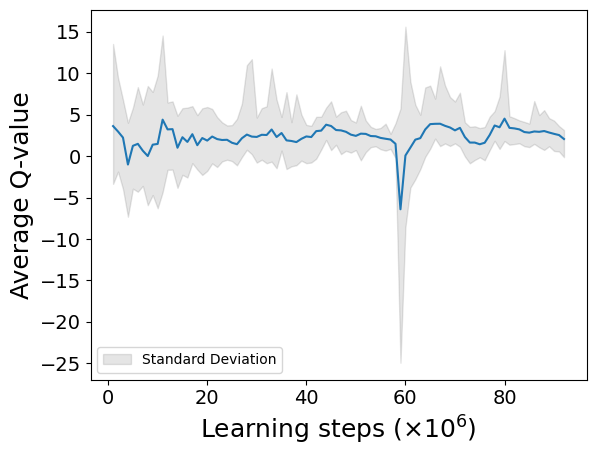

model updated


2024-07-23 22:33:25.265621: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 22:58:31.109064: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:13:32.396979: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:15:35.031055: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-23 23:35:57.992886: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6087.7

average moving queuetime :  143.9 248.5
average stay queuetime :  1049.3 1811.8
average total queuetime :  1193.2 2060.2
average chargecount :  1.7 1.7
average ordercount :  39.4 39.4
day : 1


2024-07-23 23:44:12.250938: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


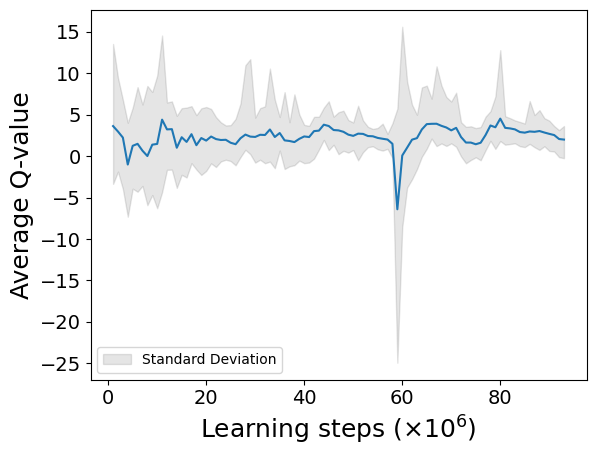

model updated


2024-07-24 00:02:40.311167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:23:45.950802: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 00:27:06.731236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


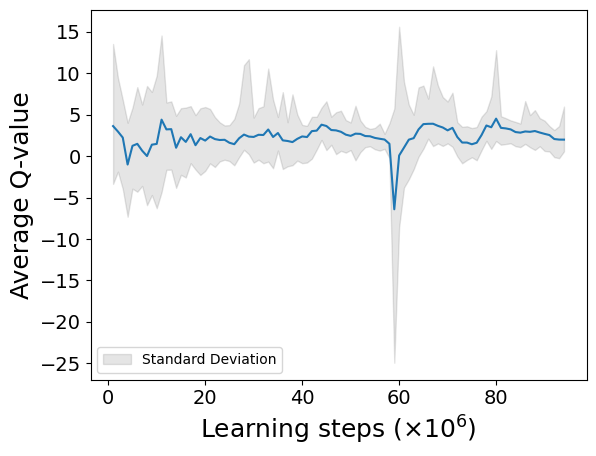

model updated
so long waited in  7
day start to termianl : 42061.9

 time for simulate one day : 6011.7
so long waited in  7
day start to termianl : 42061.9
so long waited in  7
day start to termianl : 42061.9

average moving queuetime :  144.7 268.4
average stay queuetime :  1055.8 1960.9
average total queuetime :  1200.4 2229.3
average chargecount :  1.8 1.8
average ordercount :  38.6 37.7
[37, 20, 3, 7, 40, 47, 33, 81, 89, 54, 33, 74]
[48, 23, 34, 35, 23, 29, 52, 64, 71, 78, 46, 13]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.0583142732404314
code start to now : 462244.5
episode_reward :  -967.2327885615766
fit_count :  940846
TD max = 38.01335351715088 TD min = 0.00010177145004276458

episode 53
day : 0


2024-07-24 01:23:24.851120: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 01:45:53.122534: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:01:48.119058: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:01:49.884280: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:03:58.638059: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:07:21.320151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:08:03.042969: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:14:09.761691: W tensorflow/core/data/root_dataset.cc:24

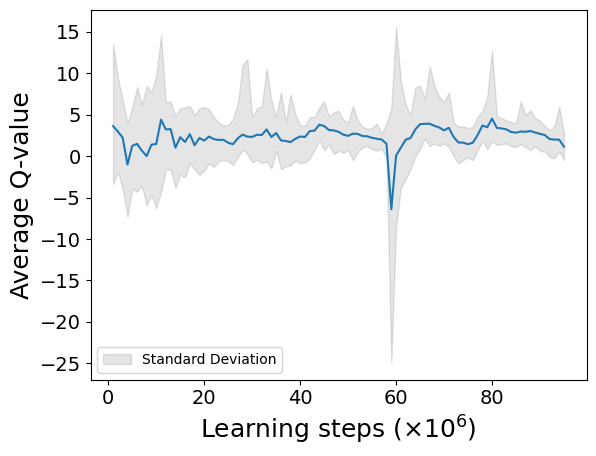

model updated


2024-07-24 02:36:56.081847: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:38:12.751181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:46:45.139429: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 02:48:18.191125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39462.6

 time for simulate one day : 5510.4

average moving queuetime :  143.2 230.1
average stay queuetime :  983.2 1579.6
average total queuetime :  1126.4 1809.7
average chargecount :  1.6 1.6
average ordercount :  35.5 35.5
[42, 8, 8, 3, 53, 35, 52, 67, 52, 87, 26, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4636647465626171
code start to now : 467763.2
episode_reward :  -543.6791402213057
fit_count :  951939
TD max = 43.058562791442874 TD min = 0.00010177145004276458

episode 54
day : 0


2024-07-24 03:01:29.370057: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:05:04.662546: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:21:22.092808: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:21:34.501612: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:22:08.756766: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:49.405011: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:52.749793: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 03:33:57.481186: W tensorflow/core/data/root_dataset.cc:24

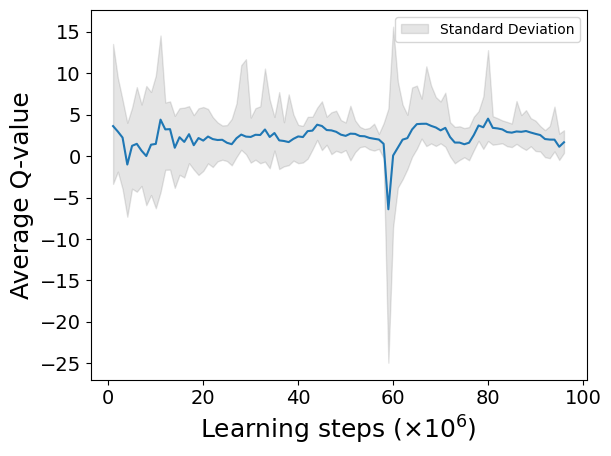

model updated


2024-07-24 04:23:30.858224: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 04:25:22.518045: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6153.0

average moving queuetime :  159.1 278.4
average stay queuetime :  944.3 1652.6
average total queuetime :  1103.4 1931.0
average chargecount :  1.8 1.8
average ordercount :  39.4 39.4
day : 1


2024-07-24 04:50:56.738277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 04:53:21.231159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


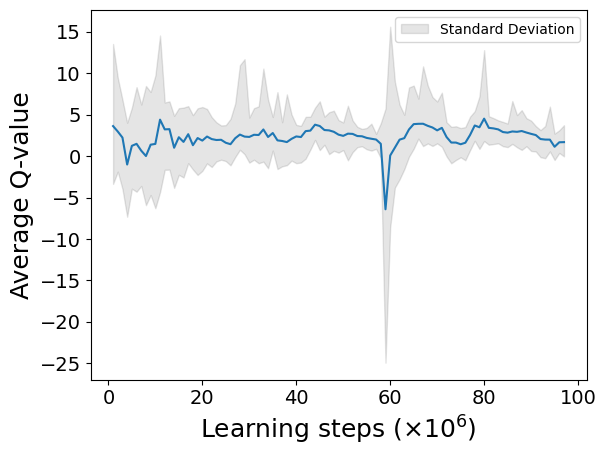

model updated


2024-07-24 05:28:54.409926: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:30:37.199961: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:40:07.408593: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:41:12.971207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 05:55:20.375902: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6357.6

average moving queuetime :  155.9 306.6
average stay queuetime :  874.9 1631.4
average total queuetime :  1030.8 1938.0
average chargecount :  1.9 2.0
average ordercount :  39.6 39.7
day : 2


2024-07-24 06:33:12.291232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


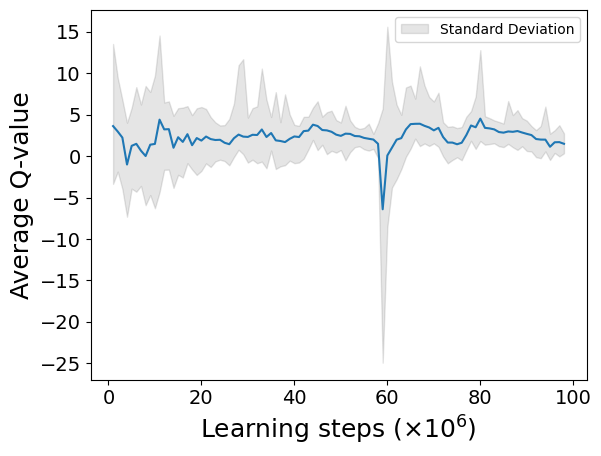

model updated


2024-07-24 06:40:13.910721: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:05:15.579737: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:08:45.301251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:23:10.901257: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:29:12.958120: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:46:08.331512: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 07:49:25.400748: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 40160.7

 time for simulate one day : 5725.9
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7
so long waited in  7
day start to termianl : 40160.7

average moving queuetime :  153.6 263.4
average stay queuetime :  942.8 1923.7
average total queuetime :  1096.5 2187.2
average chargecount :  1.8 1.8
average ordercou

2024-07-24 08:00:53.170426: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


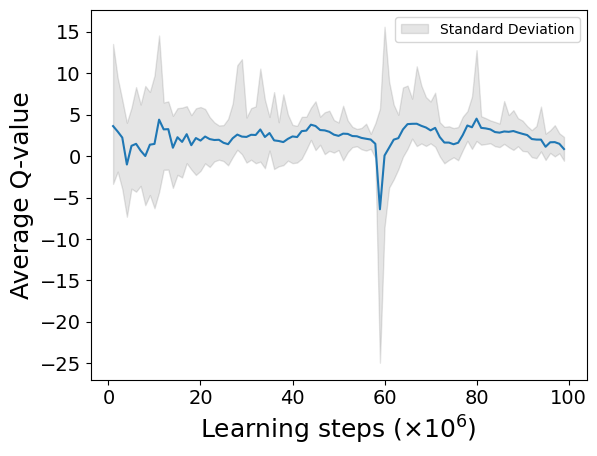

model updated


2024-07-24 08:21:16.319067: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 08:41:06.064014: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:05:13.795017: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:20:22.132933: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


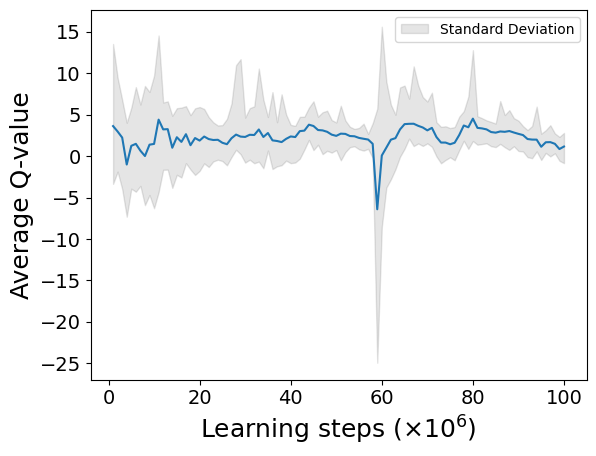

so long waited in  7
day start to termianl : 39660.5

 time for simulate one day : 5710.9
so long waited in  7
day start to termianl : 39660.5
so long waited in  7
day start to termianl : 39660.5
so long waited in  7
day start to termianl : 39660.5

average moving queuetime :  144.2 215.8
average stay queuetime :  885.8 1325.7
average total queuetime :  1030.0 1541.6
average chargecount :  1.5 1.5
average ordercount :  36.2 36.2
[31, 23, 5, 7, 51, 54, 24, 35, 54, 82, 18, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4973069381589241
code start to now : 491742.2
episode_reward :  -424.778549624201
fit_count :  1000393
TD max = 21.102351987457276 TD min = 0.00010840663909906781
model updated

episode 56
day : 0


2024-07-24 09:32:53.134511: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:34:34.809351: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:38:10.671232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:52:22.689024: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 09:57:33.561200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 10:01:59.617178: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 10:02:16.469236: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 10:07:19.146091: W tensorflow/core/data/root_dataset.cc:24

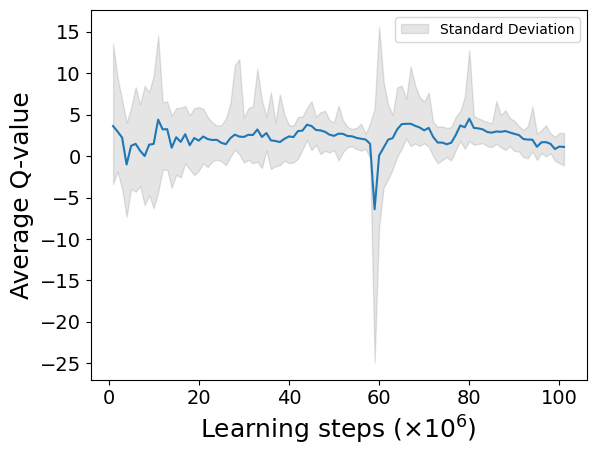

so long waited in  7
day start to termianl : 38405.1

 time for simulate one day : 5368.4

average moving queuetime :  145.4 193.8
average stay queuetime :  853.3 1137.7
average total queuetime :  998.6 1331.5
average chargecount :  1.3 1.3
average ordercount :  34.6 34.6
[50, 7, 1, 4, 42, 41, 20, 39, 76, 75, 1, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4270630071380854
code start to now : 497114.6
episode_reward :  -421.1041269280842
fit_count :  1011139
TD max = 36.02869371185303 TD min = 0.00010840663909906781
model updated

episode 57
day : 0


2024-07-24 11:20:21.118882: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:26:07.699802: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:32:51.250472: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 11:48:34.298544: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


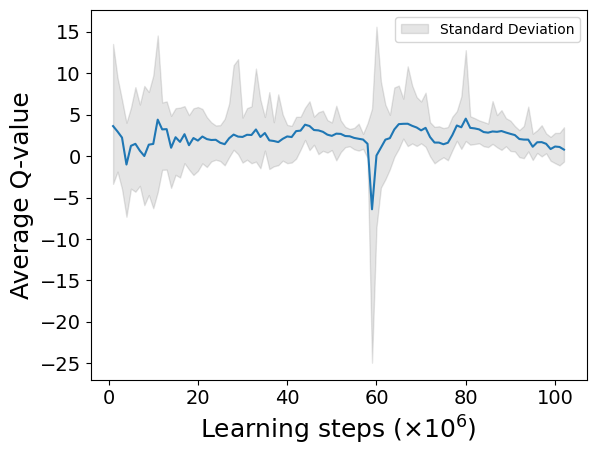

2024-07-24 12:14:12.361225: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 35719.8

 time for simulate one day : 4817.6

average moving queuetime :  161.2 197.8
average stay queuetime :  821.8 1008.0
average total queuetime :  983.0 1205.8
average chargecount :  1.2 1.2
average ordercount :  31.3 31.3
[46, 9, 5, 4, 48, 22, 27, 42, 91, 26, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.3475388984431569
code start to now : 501935.6
episode_reward :  -369.633077562151
fit_count :  1020850
TD max = 36.235618188476565 TD min = 0.00011515507698068852
model updated

episode 58
day : 0


2024-07-24 12:33:20.688815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:39:47.921142: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:40:08.145790: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:45:11.543232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:45:15.936446: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:51:52.776210: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 12:55:32.224989: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 13:00:26.461151: W tensorflow/core/data/root_dataset.cc:24

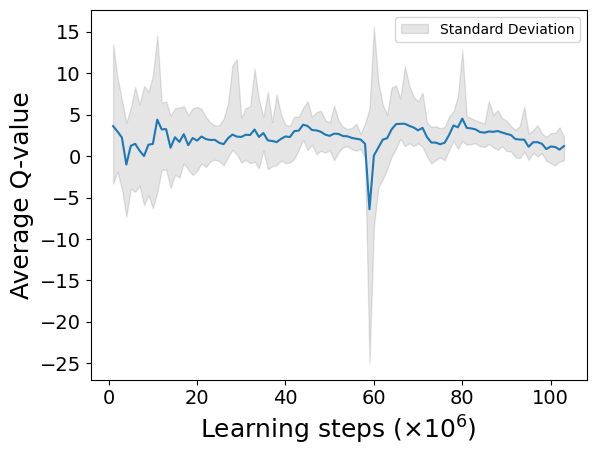

2024-07-24 13:41:34.111490: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 13:59:25.371154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:00:37.140115: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6196.2

average moving queuetime :  158.5 257.9
average stay queuetime :  1042.7 1696.2
average total queuetime :  1201.2 1954.0
average chargecount :  1.6 1.6
average ordercount :  40.2 40.2
day : 1


2024-07-24 14:03:36.454290: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:03:51.270559: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:22:00.831615: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:33:23.079559: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 14:53:27.191285: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


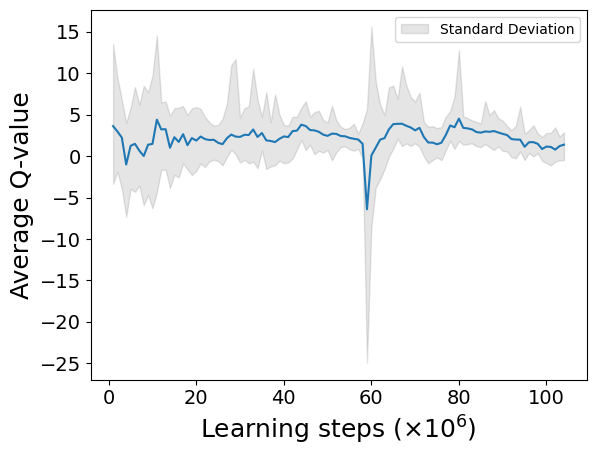

2024-07-24 14:58:51.844251: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:27:46.101311: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 37957.8

 time for simulate one day : 5395.1
so long waited in  7
day start to termianl : 37957.8

average moving queuetime :  153.4 278.2
average stay queuetime :  956.9 1646.5
average total queuetime :  1110.3 1924.7
average chargecount :  1.7 1.9
average ordercount :  36.9 33.7
[56, 4, 0, 5, 39, 58, 22, 66, 71, 53, 68, 46]
[102, 37, 38, 38, 49, 28, 21, 30, 55, 74, 2, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.4083808642500153
code start to now : 513538.5
episode_reward :  -505.6599736305169
fit_count :  1044496
TD max = 36.00368499526978 TD min = 0.0001083535909652932
model updated

episode 59
day : 0


2024-07-24 15:37:07.719072: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:37:50.761279: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:39:52.759951: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 15:48:03.328604: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:07:09.928452: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:24:11.709418: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


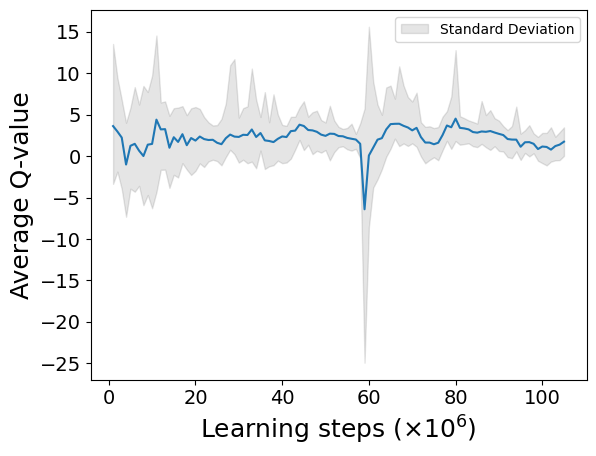

2024-07-24 16:38:28.763481: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:41:02.259727: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:47:47.675035: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 16:59:36.891148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:16:28.159096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 17:31:11.461162: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7278.6

average moving queuetime :  146.9 233.1
average stay queuetime :  925.6 1468.6
average total queuetime :  1072.5 1701.7
average chargecount :  1.6 1.6
average ordercount :  39.9 39.9
day : 1


2024-07-24 17:38:14.187978: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


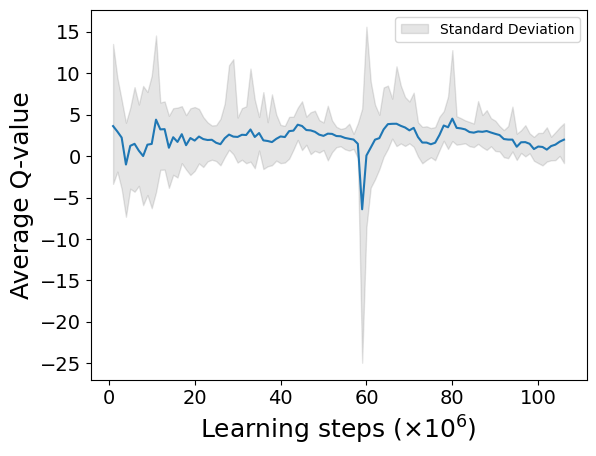

2024-07-24 19:05:11.237222: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42903.1

 time for simulate one day : 6245.0
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1
so long waited in  7
day start to termianl : 42903.1

average moving queuetime :  149.6 292.6
average stay queuetime :  1002.1 2052.0
average total queuetime :  1151.7 2344.7
average chargecount :  1.8 1.9
average ordercount :  39.4 38.9
[56, 4, 0, 7, 43, 25, 54, 56, 49, 68, 61, 53]
[83, 33, 14, 34, 29, 46, 36, 58, 57, 64, 61, 16]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.2676530540433872
code start to now : 527073.7
episode_reward :  -662.58574829825
fit_count :  1069803
TD max = 36.00368499526978 TD min = 0.000100996589

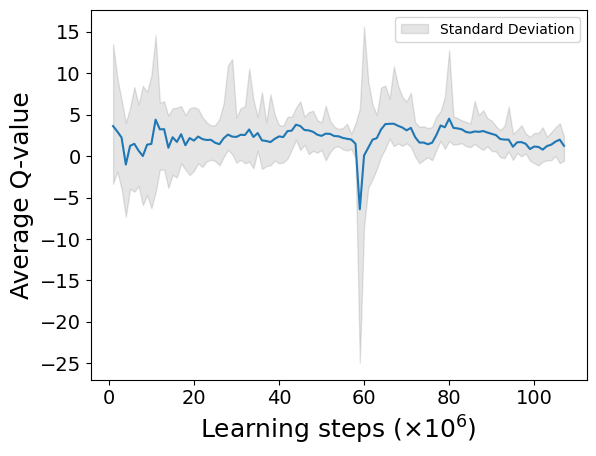

2024-07-24 19:39:29.461348: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:47:08.446824: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 19:58:54.291266: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:03:44.234161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:10:33.046946: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:28:54.764111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 20:40:57.458282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


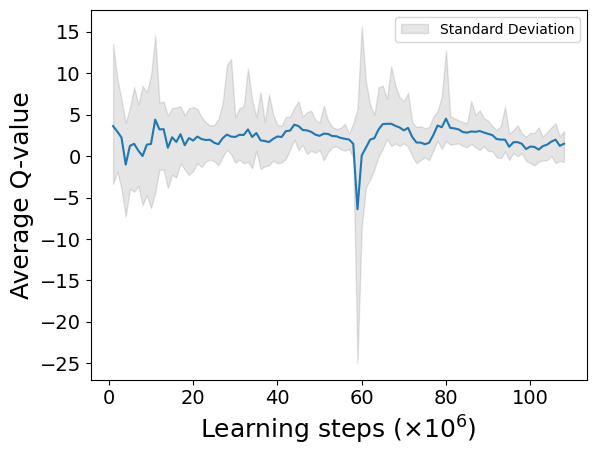

so long waited in  7
day start to termianl : 43036.2

 time for simulate one day : 6032.5
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2
so long waited in  7
day start to termianl : 43036.2

average moving queuetime :  149.4 294.3
average stay queuetime :  1053.4 2075.1
average total queuetime :  1202.8 2369.4
average chargecount :  2.0 2.0
average ordercount :  38.9 38.9
[63, 33, 30, 15, 20, 51, 89, 50, 38, 66, 77, 18]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5670119605435124
code start to now : 533114.1
episode_reward :  -524.3117135761439
fit_count :  1082168
TD max = 31.784702546691893 TD min = 0.00010099658966057348
model updated

episode 61
day : 0


2024-07-24 21:42:11.778773: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 21:58:25.180212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:14:21.320118: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


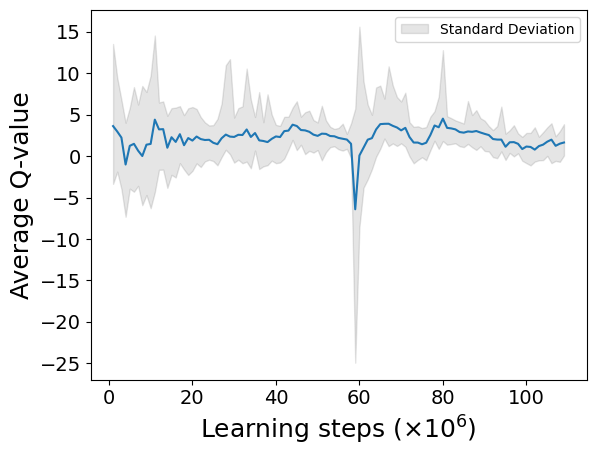

2024-07-24 22:37:48.001136: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:41:58.856398: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:48:58.538635: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 22:54:02.968809: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43260.0

 time for simulate one day : 7258.7
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0
so long waited in  7
day start to termianl : 43260.0

average moving queuetime :  152.5 256.2
average stay queuetime :  842.8 1415.9
average total queuetime :  995.3 1672.1
average chargecount :  1.7 1.7
average ordercount :  39.9 39.9
[46, 11, 2, 4, 12, 62, 50, 55, 74, 42, 78, 36]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5702614109325221
code start to now : 540391.8
episode_reward :  -370.782782117335
fit_count :  1

2024-07-24 23:06:03.081150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-24 23:10:07.774767: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


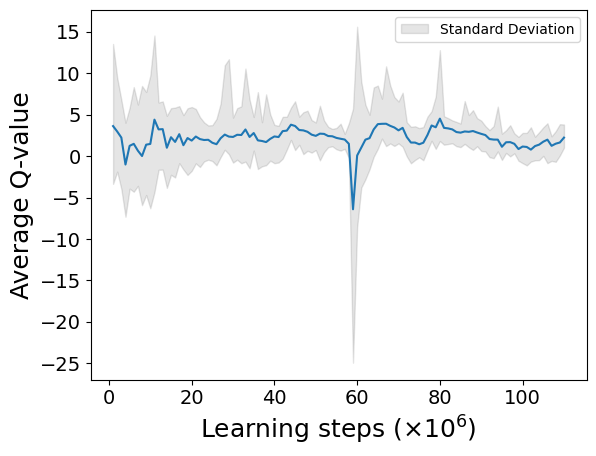

2024-07-24 23:59:45.512535: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:04:30.970522: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:12:53.216816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:15:33.681129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:16:24.538964: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 00:22:47.488428: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 45231.6

 time for simulate one day : 6236.0
so long waited in  7
day start to termianl : 45231.6

average moving queuetime :  150.7 239.7
average stay queuetime :  1081.1 1718.9
average total queuetime :  1231.8 1958.6
average chargecount :  1.6 1.6
average ordercount :  39.9 39.9
[44, 2, 5, 9, 2, 51, 81, 19, 54, 63, 72, 59]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5971081201184234
code start to now : 546639.4
episode_reward :  -406.19811960966433
fit_count :  1107483
TD max = 40.92840799015459 TD min = 0.00010393629074091351
model updated

episode 63
day : 0


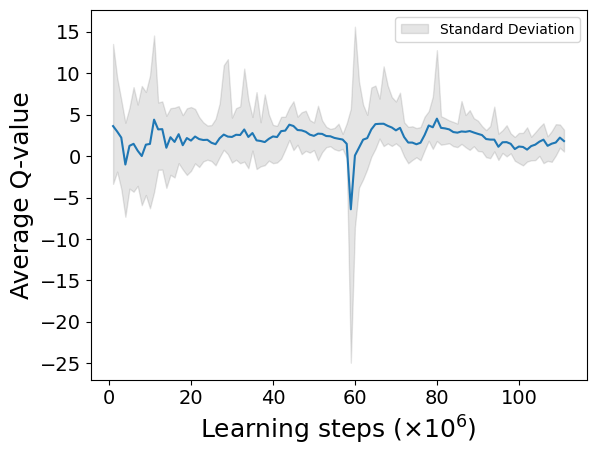

2024-07-25 01:17:35.365482: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:21:27.149420: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:29:03.580682: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:39:30.147326: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:42:38.780916: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 01:49:23.010502: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:07:19.331896: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:13:59.141228: W tensorflow/core/data/root_dataset.cc:24

so long waited in  7
day start to termianl : 40787.6

 time for simulate one day : 5712.7
so long waited in  7
day start to termianl : 40787.6
so long waited in  7
day start to termianl : 40787.6

average moving queuetime :  154.7 226.8
average stay queuetime :  1013.1 1485.8
average total queuetime :  1167.7 1712.7
average chargecount :  1.5 1.5
average ordercount :  36.9 36.9
[41, 15, 4, 1, 40, 23, 50, 39, 64, 81, 47, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4996382692467116
code start to now : 552356.0
episode_reward :  -545.1823116253879
fit_count :  1118965
TD max = 22.821015679931637 TD min = 0.00010246047973639918
model updated

episode 64
day : 0


2024-07-25 02:20:45.806834: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:23:34.324537: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


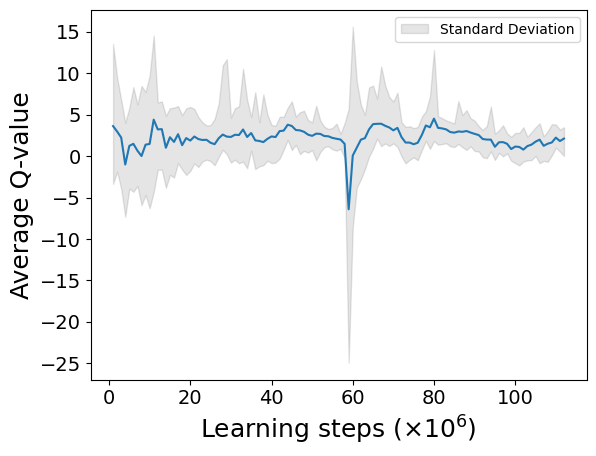

2024-07-25 02:31:35.451136: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 02:39:27.403597: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:17:30.033938: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:20:55.491853: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


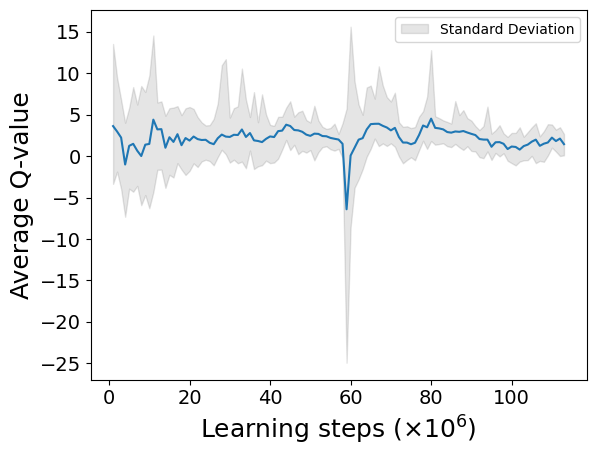

2024-07-25 03:51:49.637004: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 03:56:44.378682: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:01:12.220279: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43042.1

 time for simulate one day : 6085.9
so long waited in  7
day start to termianl : 43042.1
so long waited in  7
day start to termianl : 43042.1
so long waited in  7
day start to termianl : 43042.1

average moving queuetime :  156.1 244.1
average stay queuetime :  964.2 1507.4
average total queuetime :  1120.4 1751.5
average chargecount :  1.6 1.6
average ordercount :  39.5 39.5
[58, 1, 0, 1, 13, 57, 16, 68, 58, 71, 68, 10]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5852962952737852
code start to now : 558446.3
episode_reward :  -405.6173060115048
fit_count :  1131383
TD max = 51.70523950347901 TD min = 0.00010246047973639918
model updated

episode 65
day : 0


2024-07-25 04:04:42.032288: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:09:59.398103: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:10:04.030356: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:10:04.716063: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:10:30.651323: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:12:37.209275: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:12:45.767729: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 04:28:22.964444: W tensorflow/core/data/root_dataset.cc:24

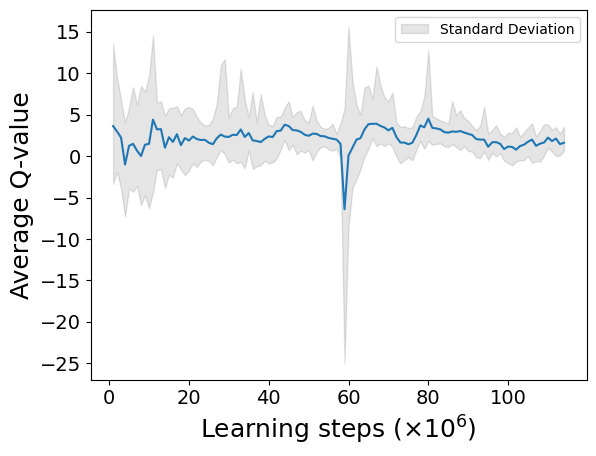

2024-07-25 05:26:04.887100: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41765.2

 time for simulate one day : 5802.4
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long waited in  7
day start to termianl : 41765.2
so long w

2024-07-25 06:18:18.331261: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:23:17.810822: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 06:27:55.016584: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


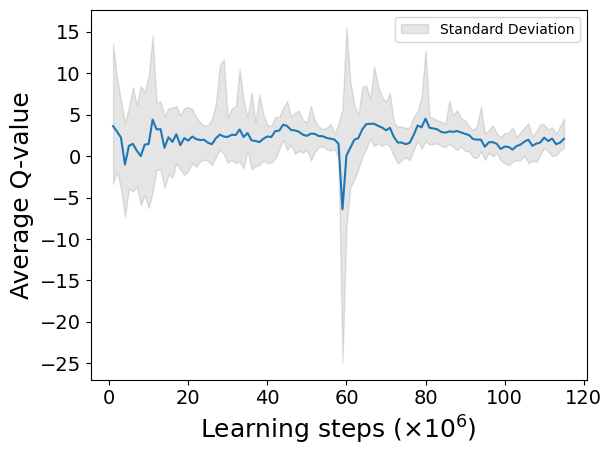

2024-07-25 06:46:23.991482: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:14:20.458952: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42488.9

 time for simulate one day : 5954.5
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long waited in  7
day start to termianl : 42488.9
so long w

2024-07-25 07:21:54.007753: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:29:46.181198: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:36:14.940156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:37:46.871136: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:38:23.468885: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 07:39:53.334655: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


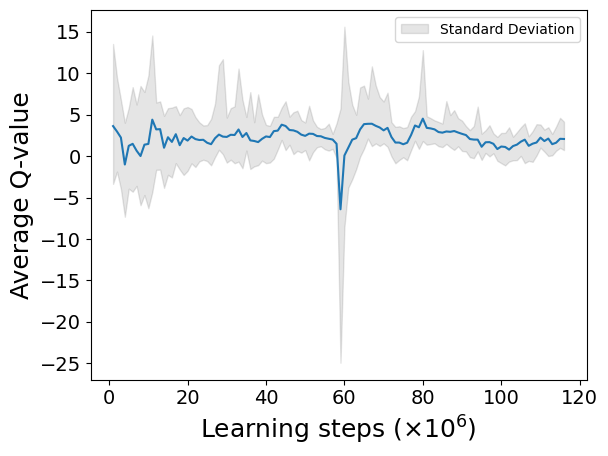

2024-07-25 07:59:11.781280: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:03:22.281124: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:10:53.924624: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:22:19.815781: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:30:08.949860: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 08:39:52.215449: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38937.8

 time for simulate one day : 5422.3

average moving queuetime :  156.8 233.1
average stay queuetime :  948.1 1409.5
average total queuetime :  1104.9 1642.5
average chargecount :  1.5 1.5
average ordercount :  35.2 35.2
[60, 0, 0, 3, 15, 72, 22, 45, 60, 80, 8, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5105368644930575
code start to now : 575660.0
episode_reward :  -394.6800547293349
fit_count :  1166130
TD max = 17.637689263916016 TD min = 0.0001007522106170721
model updated

episode 68
day : 0


2024-07-25 08:57:14.659437: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 09:12:25.039020: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


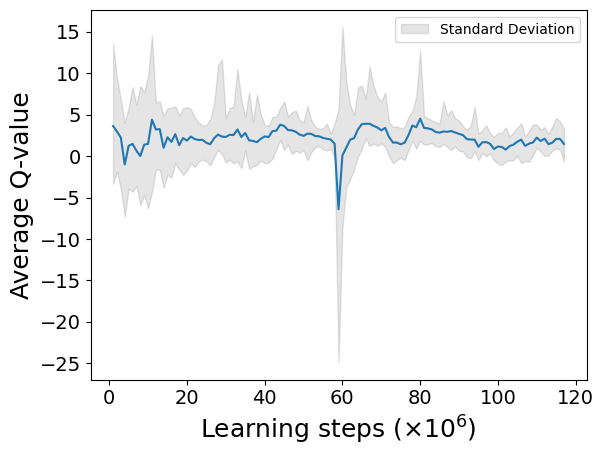

2024-07-25 09:29:23.078135: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 09:54:56.952408: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:00:45.141194: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:20:36.601197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 39503.0

 time for simulate one day : 5541.7
so long waited in  7
day start to termianl : 39503.0
so long waited in  7
day start to termianl : 39503.0
so long waited in  7
day start to termianl : 39503.0
so long waited in  7
day start to termianl : 39503.0
so long waited in  7
day start to termianl : 39503.0

average moving queuetime :  154.0 245.9
average stay queuetime :  1007.8 1609.1
average total queuetime :  1161.8 1855.1
average chargecount :  1.6 1.6
average ordercount :  35.3 35.3
[60, 0, 0, 6, 45, 61, 23, 33, 83, 77, 25, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4956723352891523
code start to now : 581209.5
episode_reward :  -521.2625552976069
fit_count :  1177152
TD max = 21.307025983428954 TD min = 0.0001007522106170721
model updated

episode 69
day : 0


2024-07-25 10:22:54.540722: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:26:06.549057: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:38:26.679575: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:44:24.840710: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:51:51.266494: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 10:54:01.433544: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


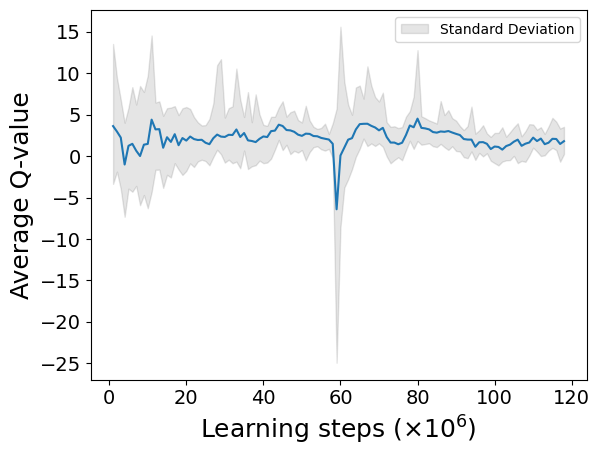

2024-07-25 11:13:08.787663: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:13:11.927045: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:18:06.259147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:21:43.367261: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:54:37.200777: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 11:57:22.195731: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 12:11:50.699111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 40431.9

 time for simulate one day : 6816.6
so long waited in  7
day start to termianl : 40431.9
so long waited in  7
day start to termianl : 40431.9
so long waited in  7
day start to termianl : 40431.9
so long waited in  7
day start to termianl : 40431.9

average moving queuetime :  140.5 226.7
average stay queuetime :  971.4 1567.2
average total queuetime :  1111.9 1793.9
average chargecount :  1.6 1.6
average ordercount :  36.6 36.6
[57, 3, 0, 7, 39, 42, 70, 38, 57, 88, 36, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.488409180381774
code start to now : 588033.9
episode_reward :  -548.9076889240811
fit_count :  1188586
TD max = 17.222164957618713 TD min = 0.0001007522106170721
model updated

episode 70
day : 0


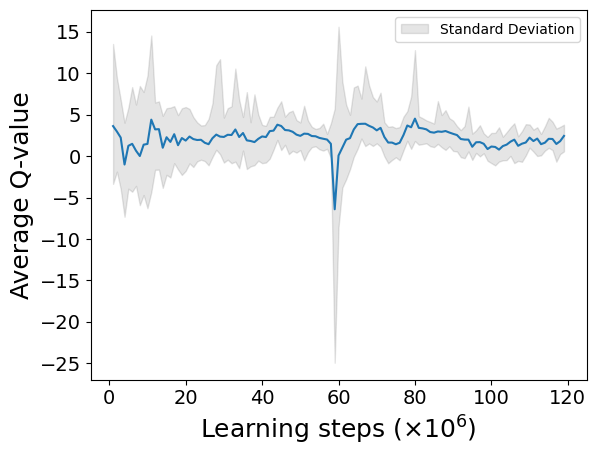

2024-07-25 12:27:59.721407: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:21:54.270439: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 13:45:01.644815: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


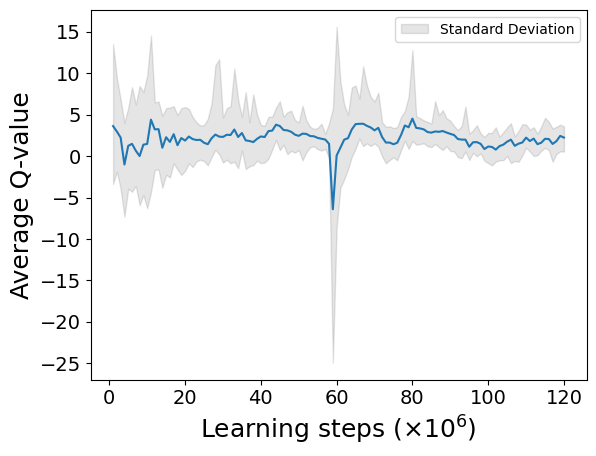

2024-07-25 13:51:12.617894: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43628.8

 time for simulate one day : 6174.7
so long waited in  7
day start to termianl : 43628.8
so long waited in  7
day start to termianl : 43628.8

average moving queuetime :  153.1 311.3
average stay queuetime :  1007.0 2047.6
average total queuetime :  1160.1 2358.8
average chargecount :  2.0 2.0
average ordercount :  38.9 38.9
[87, 42, 35, 20, 37, 42, 47, 44, 76, 75, 60, 25]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5308524881732803
code start to now : 594220.4
episode_reward :  -549.2749775552375
fit_count :  1201111
TD max = 17.222164957618713 TD min = 0.0001007522106170721
model updated

episode 71
day : 0


2024-07-25 14:00:09.027954: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:50:07.048559: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:53:32.220782: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 14:59:21.663005: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


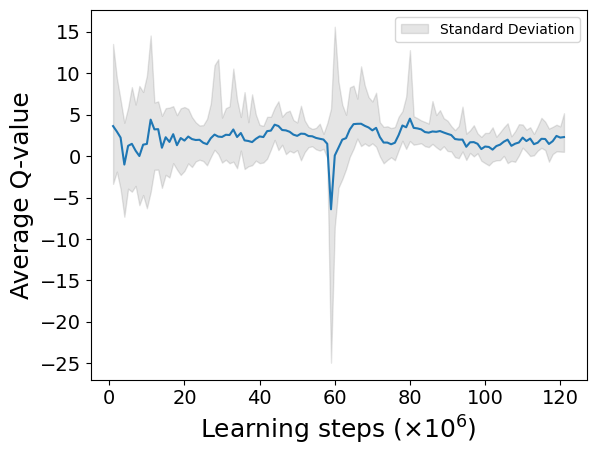

2024-07-25 15:34:30.421172: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 46488.1

 time for simulate one day : 6065.3
so long waited in  7
day start to termianl : 46488.1
so long waited in  7
day start to termianl : 46488.1

average moving queuetime :  145.3 236.8
average stay queuetime :  1143.4 1863.8
average total queuetime :  1288.7 2100.6
average chargecount :  1.6 1.6
average ordercount :  39.6 39.6
[49, 11, 0, 6, 32, 50, 37, 61, 47, 85, 59, 43]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5570331748532182
code start to now : 600293.6
episode_reward :  -473.58033125126644
fit_count :  1213698
TD max = 25.272241532897947 TD min = 0.0001007522106170721
model updated

episode 72
day : 0


2024-07-25 16:03:02.263439: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:16:23.411157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:20:09.976539: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


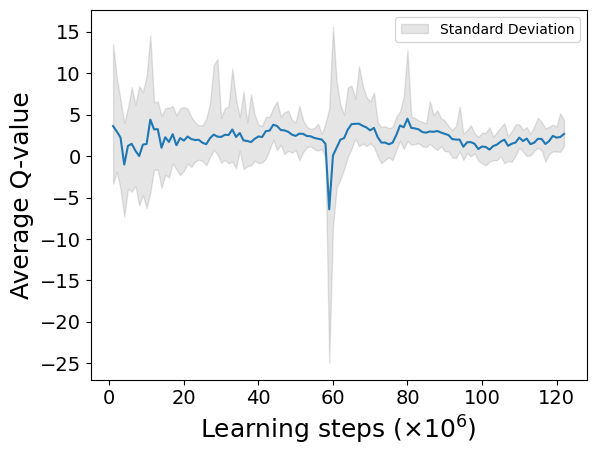

2024-07-25 16:32:22.830800: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 16:40:32.746292: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:01:05.901027: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 17:20:53.641129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43363.1

 time for simulate one day : 6191.3

average moving queuetime :  142.4 238.4
average stay queuetime :  935.8 1565.8
average total queuetime :  1078.2 1804.2
average chargecount :  1.7 1.7
average ordercount :  39.6 39.6
[57, 3, 0, 6, 31, 46, 54, 47, 61, 84, 67, 19]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.54835159890851
code start to now : 606500.2
episode_reward :  -391.39742883745953
fit_count :  1226302
TD max = 26.08355382690429 TD min = 0.0001007522106170721
model updated

episode 73
day : 0


2024-07-25 17:35:28.449207: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


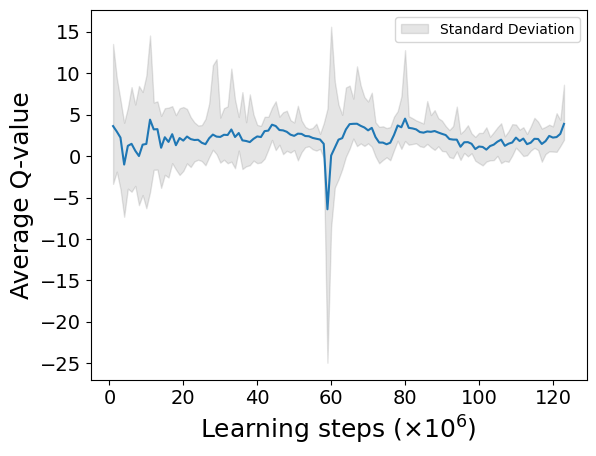

2024-07-25 18:02:23.091245: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:32:13.747960: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:33:37.371169: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:45:11.474125: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 18:55:30.766398: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42823.3

 time for simulate one day : 6062.0

average moving queuetime :  153.4 278.2
average stay queuetime :  903.8 1639.0
average total queuetime :  1057.2 1917.1
average chargecount :  1.8 1.8
average ordercount :  38.8 38.8
[60, 0, 0, 7, 63, 79, 13, 45, 86, 63, 82, 19]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5339551887278302
code start to now : 612566.4
episode_reward :  -487.90828169431245
fit_count :  1238568
TD max = 20.37195619354248 TD min = 0.0001007522106170721
model updated

episode 74
day : 0


2024-07-25 19:06:02.642140: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


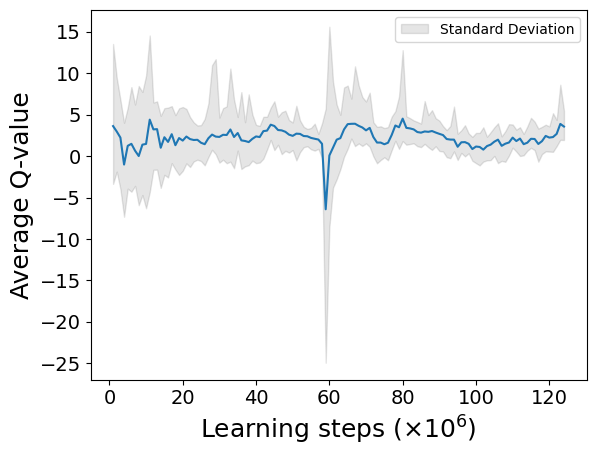

2024-07-25 19:54:12.159821: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:00:17.927884: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:29:55.423326: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:48:01.505158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 20:50:44.084914: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


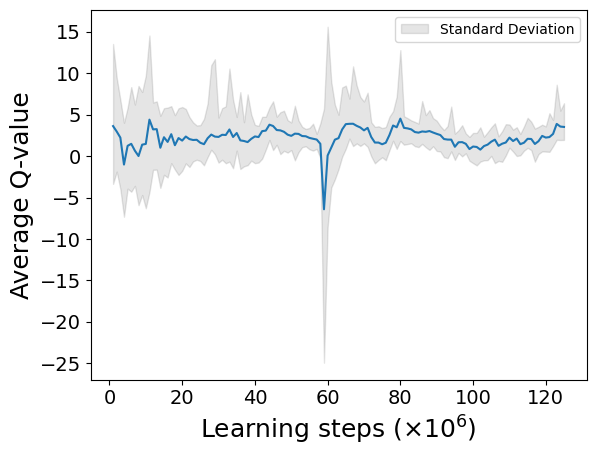

2024-07-25 21:00:11.790866: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 7253.7

average moving queuetime :  153.4 277.6
average stay queuetime :  1085.2 1964.1
average total queuetime :  1238.5 2241.8
average chargecount :  1.8 1.8
average ordercount :  39.7 39.7
day : 1


2024-07-25 21:06:27.561168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:27:03.081301: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:38:52.416662: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 21:42:35.059854: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:04:13.318326: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:10:19.673532: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 22:12:25.818002: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


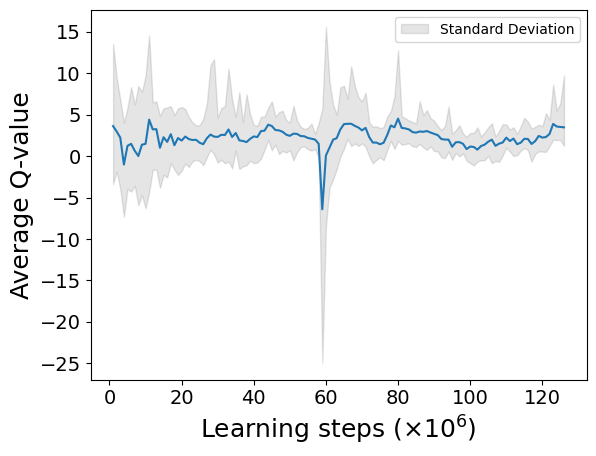

2024-07-25 22:47:51.754404: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6268.8

average moving queuetime :  151.2 350.8
average stay queuetime :  996.3 2177.0
average total queuetime :  1147.4 2527.8
average chargecount :  2.1 2.3
average ordercount :  39.4 39.1
day : 2


2024-07-25 23:16:26.385740: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-25 23:28:15.976945: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


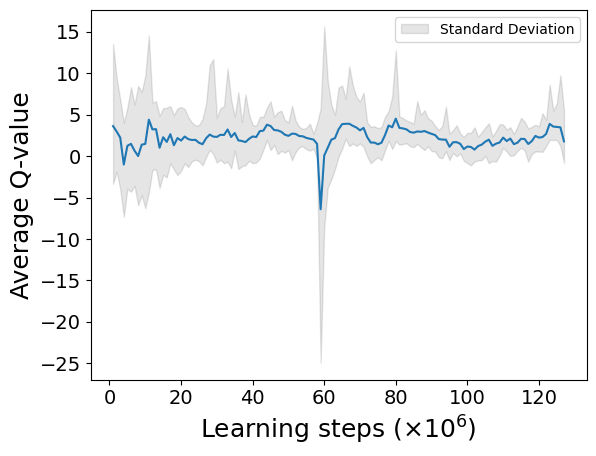

2024-07-25 23:53:06.101181: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:20:18.831580: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:30:06.947441: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 00:32:45.455585: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6308.9

average moving queuetime :  153.1 389.7
average stay queuetime :  1007.9 2561.5
average total queuetime :  1161.0 2951.1
average chargecount :  2.2 2.5
average ordercount :  39.1 38.5
[58, 2, 0, 13, 53, 74, 22, 41, 78, 88, 60, 54]
[89, 31, 28, 43, 57, 62, 46, 47, 102, 60, 81, 58]
[69, 30, 48, 51, 67, 49, 36, 85, 91, 79, 66, 77]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.6443782105847955
code start to now : 632409.9
episode_reward :  -1257.4159509358587
fit_count :  1277010
TD max = 63.50822309265136 TD min = 0.00010205636024475098
model updated

episode 75
day : 0


2024-07-26 00:36:32.611145: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


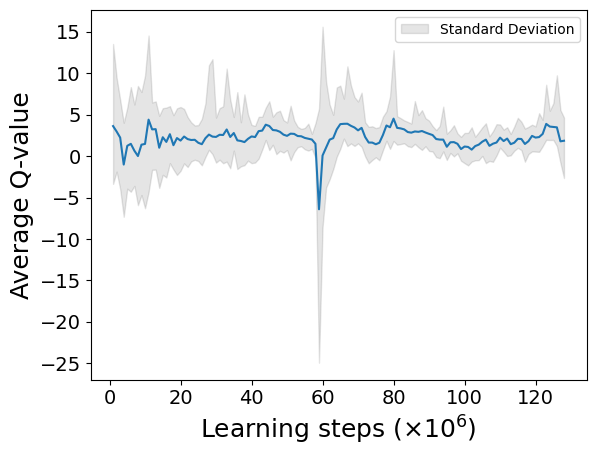

2024-07-26 01:11:10.900455: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:14:52.988121: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:23:05.881157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:28:10.646608: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:31:56.981253: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 29982.9

 time for simulate one day : 3483.3
so long waited in  7
day start to termianl : 29982.9
so long waited in  7
day start to termianl : 29982.9
so long waited in  7
day start to termianl : 29982.9

average moving queuetime :  165.0 163.3
average stay queuetime :  881.7 872.9
average total queuetime :  1046.7 1036.2
average chargecount :  1.0 1.0
average ordercount :  22.3 22.3
[60, 0, 0, 3, 17, 20, 89, 48, 0, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.1480975726640013
code start to now : 635899.7
episode_reward :  -198.99847044287128
fit_count :  1283945
TD max = 63.50822309265136 TD min = 0.00010205636024475098
model updated

episode 76
day : 0


2024-07-26 01:38:55.124987: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:55:07.896586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 01:56:35.930553: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


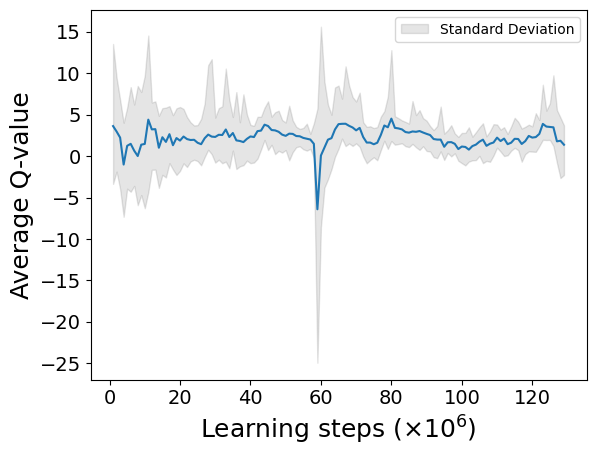

2024-07-26 02:29:59.657645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 02:54:10.441166: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:04:46.190310: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:06:13.053790: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:09:40.271110: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 5975.1

average moving queuetime :  145.0 308.9
average stay queuetime :  1311.3 2793.1
average total queuetime :  1456.3 3102.0
average chargecount :  2.1 2.1
average ordercount :  38.3 38.3
day : 1


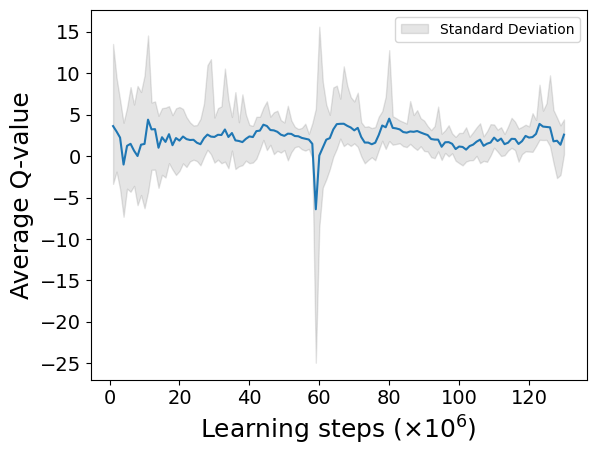

2024-07-26 03:50:33.452524: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:51:45.772891: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:54:52.476547: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 03:55:14.544551: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 04:15:01.505957: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 04:16:56.097197: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 04:18:06.310621: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 04:53:40.129886: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6361.9

average moving queuetime :  147.5 319.9
average stay queuetime :  1248.6 2530.1
average total queuetime :  1396.1 2850.0
average chargecount :  2.1 2.1
average ordercount :  38.4 38.5
day : 2


2024-07-26 05:05:33.414022: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:06:00.969594: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:06:20.737055: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


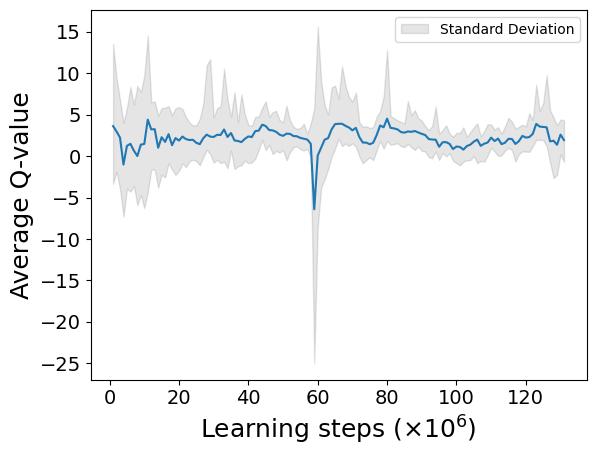

2024-07-26 05:44:39.802148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:47:24.391225: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 05:58:36.501101: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:10:37.955863: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 06:18:14.790422: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


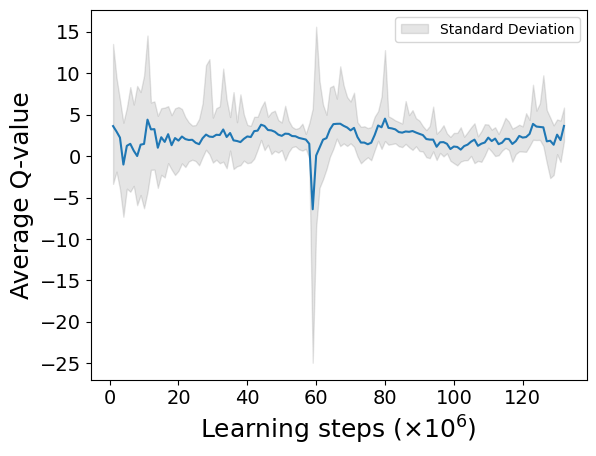

so long waited in  7
day start to termianl : 42758.2

 time for simulate one day : 6079.4
so long waited in  7
day start to termianl : 42758.2
so long waited in  7
day start to termianl : 42758.2
so long waited in  7
day start to termianl : 42758.2

average moving queuetime :  146.6 333.6
average stay queuetime :  1208.3 2607.2
average total queuetime :  1354.9 2940.8
average chargecount :  2.2 2.3
average ordercount :  38.1 37.5
[57, 3, 0, 6, 59, 78, 45, 61, 89, 88, 82, 71]
[37, 23, 29, 49, 77, 33, 37, 56, 99, 92, 53, 55]
[70, 40, 36, 50, 35, 54, 46, 55, 100, 80, 71, 9]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.5449166428090475
code start to now : 654331.7
episode_reward :  -1888.74343365939
fit_count :  1321274
TD max = 60.13164426574707 TD min = 0.00010132560729992904
model updated

episode 77
day : 0


2024-07-26 06:47:06.510903: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 07:26:26.971188: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 07:32:52.395410: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 07:44:50.130652: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


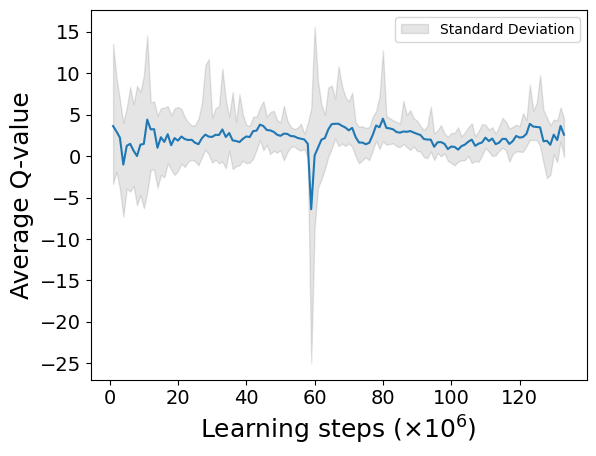


 time for simulate one day : 6206.9

average moving queuetime :  148.4 253.3
average stay queuetime :  790.5 1349.1
average total queuetime :  938.9 1602.4
average chargecount :  1.7 1.7
average ordercount :  39.7 39.7
day : 1


2024-07-26 08:29:57.540911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:33:00.961852: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:39:46.250043: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 08:56:10.611176: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:00:46.471725: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


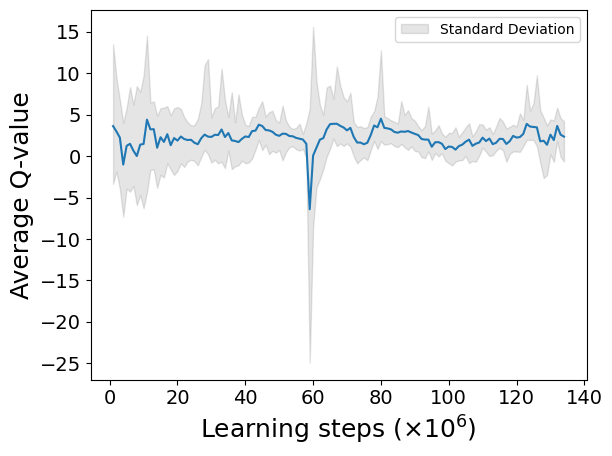

2024-07-26 09:25:03.164554: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:33:15.391216: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:41:16.034527: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:46:10.561170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 09:48:59.675388: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41291.8

 time for simulate one day : 5980.5
so long waited in  7
day start to termianl : 41291.8
so long waited in  7
day start to termianl : 41291.8
so long waited in  7
day start to termianl : 41291.8
so long waited in  7
day start to termianl : 41291.8
so long waited in  7
day start to termianl : 41291.8
so long waited in  7
day start to termianl : 41291.8

average moving queuetime :  151.8 322.4
average stay queuetime :  932.6 2188.6
average total queuetime :  1084.4 2510.9
average chargecount :  1.9 2.1
average ordercount :  38.4 37.0
[58, 2, 0, 4, 65, 48, 50, 50, 100, 49, 53, 33]
[74, 35, 29, 40, 47, 52, 51, 31, 77, 84, 47, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.0258996451931464
code start to now : 666530.7
episode_reward :  -761.500509878978
fit_count :  1345922
TD max = 45.10429609069824 TD min = 0.00010086426734924317
model updated

episode 78
day : 0


2024-07-26 10:02:51.828085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 10:04:00.740040: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 10:23:42.358527: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


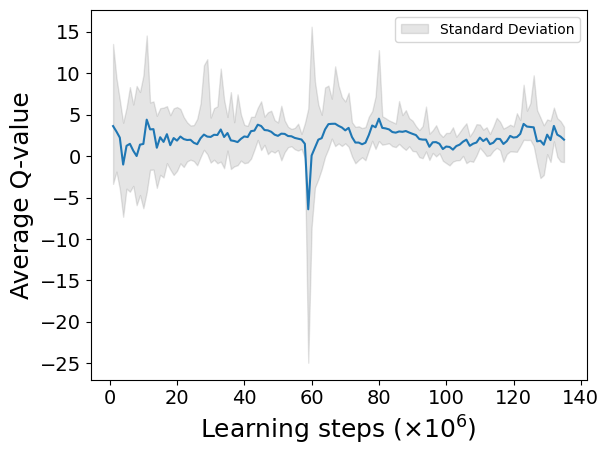

2024-07-26 10:44:49.275356: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:12:49.211159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:30:41.952341: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 11:41:54.878895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41962.8

 time for simulate one day : 5962.9

average moving queuetime :  157.1 272.8
average stay queuetime :  874.0 1517.9
average total queuetime :  1031.1 1790.7
average chargecount :  1.7 1.7
average ordercount :  38.2 38.2
[43, 9, 8, 10, 6, 104, 60, 45, 70, 95, 44, 20]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4618693145579544
code start to now : 672497.6
episode_reward :  -591.0314852844324
fit_count :  1357913
TD max = 27.035160781508466 TD min = 0.00010086426734924317
model updated

episode 79
day : 0


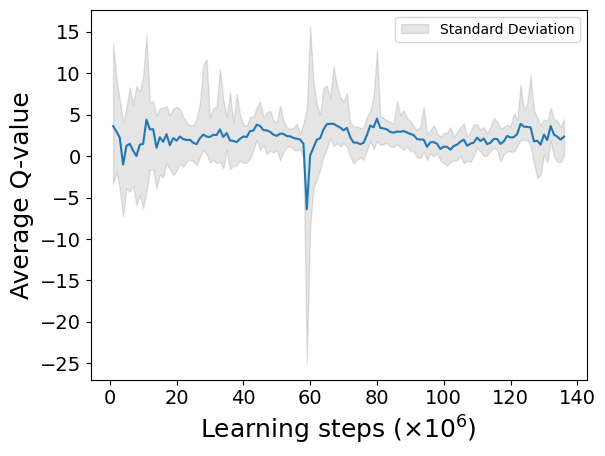

2024-07-26 12:11:00.883899: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:16:20.480396: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 12:30:17.411726: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:08:34.331634: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38917.2

 time for simulate one day : 5350.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long waited in  7
day start to termianl : 38917.2
so long w

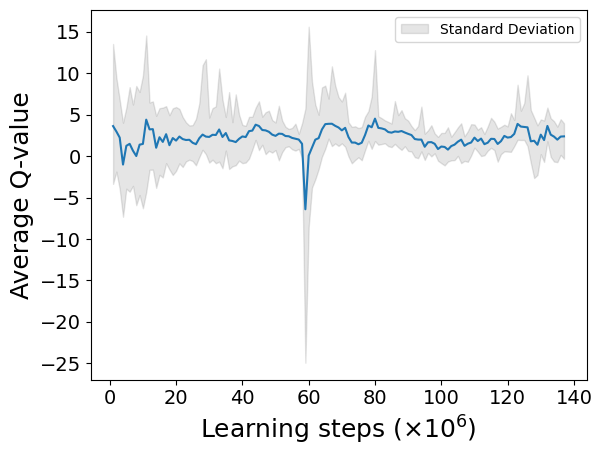

2024-07-26 13:25:17.248726: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:38:49.432471: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:45:45.078170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:48:54.648022: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:53:59.886853: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 13:56:36.951133: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


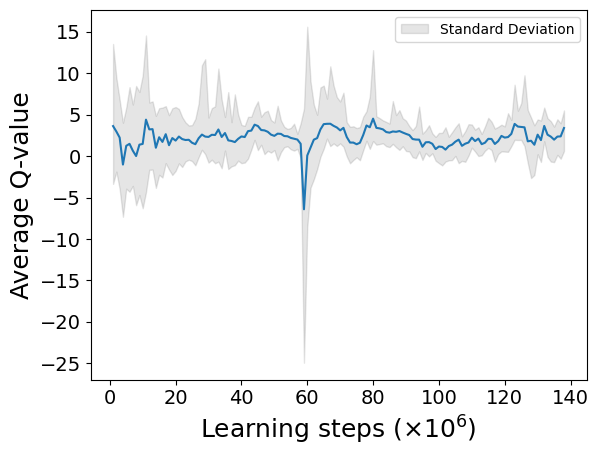

2024-07-26 14:46:53.761129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 44172.8

 time for simulate one day : 6090.9
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long waited in  7
day start to termianl : 44172.8
so long w

2024-07-26 14:59:46.350531: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:05:23.370719: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:10:22.757846: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:23:37.681377: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:33:13.741391: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 15:42:06.758791: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:05:26.691217: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 16:07:02.514696: W tensorflow/core/data/root_dataset.cc:24

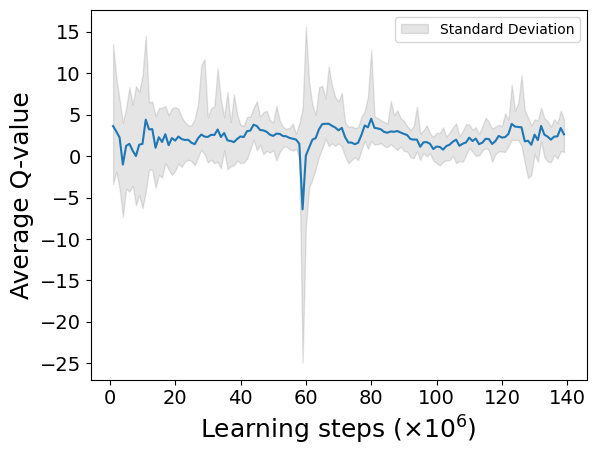

so long waited in  7
day start to termianl : 39379.8

 time for simulate one day : 5528.0
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8
so long waited in  7
day start to termianl : 39379.8

average 

2024-07-26 17:48:07.751173: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


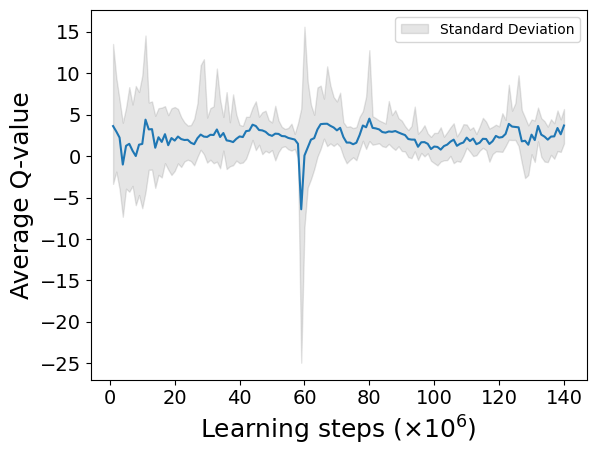

2024-07-26 18:04:06.382627: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 18:12:25.291916: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42477.7

 time for simulate one day : 7213.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long waited in  7
day start to termianl : 42477.7
so long w

2024-07-26 18:30:07.431170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:12:10.438876: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:12:52.731133: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


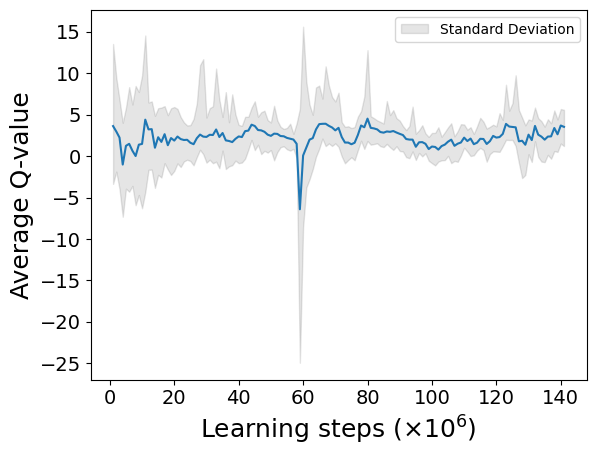

2024-07-26 19:34:08.441906: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:38:31.095432: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:42:30.566217: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 19:59:49.290548: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42843.9

 time for simulate one day : 6069.2
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long waited in  7
day start to termianl : 42843.9
so long w

2024-07-26 20:16:44.352020: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:36:56.270863: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


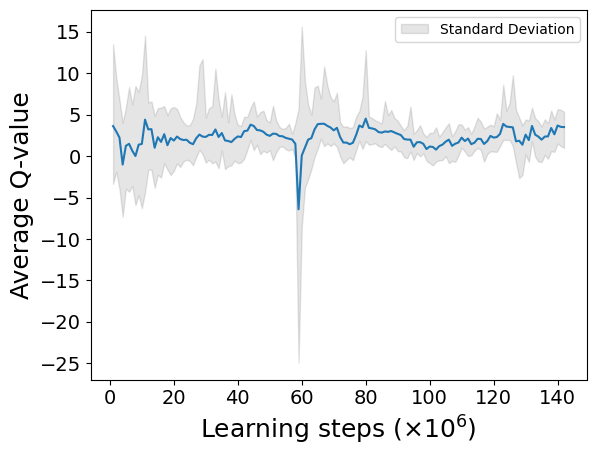

2024-07-26 20:44:50.128675: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:47:45.598397: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:49:39.450944: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:54:51.282294: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 20:56:26.139405: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:19:33.780383: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:32:19.822782: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 21:34:31.315167: W tensorflow/core/data/root_dataset.cc:24

so long waited in  7
day start to termianl : 40681.8

 time for simulate one day : 5729.6
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8
so long waited in  7
day start to termianl : 40681.8

average moving queuetime :  145.9 213.0
average stay queuetim

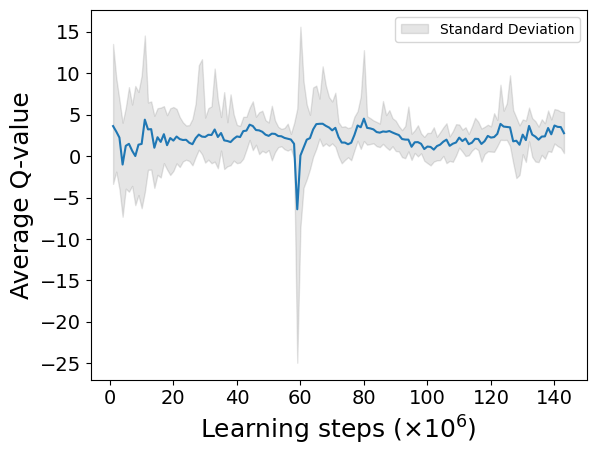

2024-07-26 22:29:28.788634: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 22:35:26.584778: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 22:58:01.029068: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:01:53.719415: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:03:43.171586: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:09:31.307822: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:16:30.471203: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:17:29.695020: W tensorflow/core/data/root_dataset.cc:24

so long waited in  7
day start to termianl : 41108.2

 time for simulate one day : 5823.0
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2
so long waited in  7
day start to termianl : 41108.2

average moving queuetime :  154.6 241.7
average stay queuetime :  900.9 1408.4
average total queuetime :  1055.5 1650.1
average chargecount :  1.6 1.6
average ordercount :  37.6 37.6
[60, 0, 0, 4, 44, 41, 37, 54, 31, 72, 52, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5741094537185332
code start to now : 714408.7
episode_reward :  -435.1116607150998
fit_count :  1

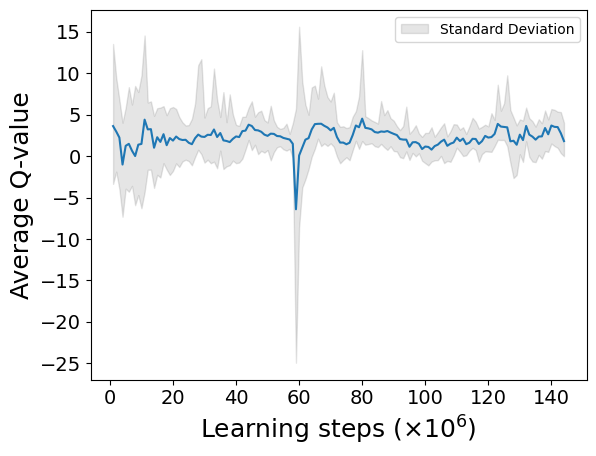

2024-07-26 23:24:19.870379: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:33:47.676814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:54:39.651262: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:54:42.650634: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-26 23:59:51.381213: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:02:29.448330: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:09:12.703320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 00:15:51.231220: W tensorflow/core/data/root_dataset.cc:24

so long waited in  7
day start to termianl : 37326.5

 time for simulate one day : 5096.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long waited in  7
day start to termianl : 37326.5
so long w

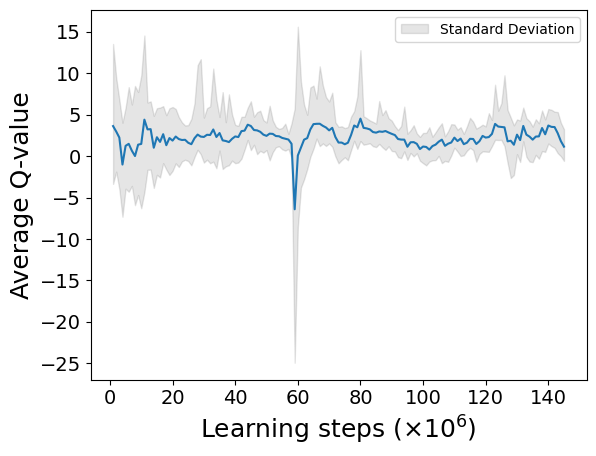

2024-07-27 00:58:24.369866: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:09:47.577382: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:12:56.344638: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:22:44.355805: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:49:13.571241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:49:35.606395: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:53:11.572231: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 01:57:03.991140: W tensorflow/core/data/root_dataset.cc:24

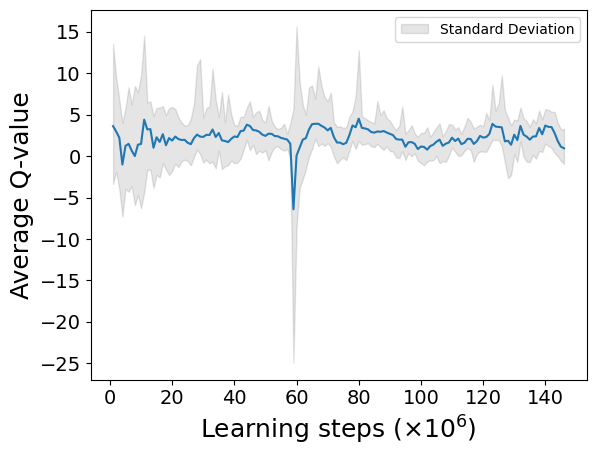

so long waited in  7
day start to termianl : 42193.4

 time for simulate one day : 5825.8
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long waited in  7
day start to termianl : 42193.4
so long w

2024-07-27 02:34:01.408769: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 02:55:36.508635: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:07:01.501151: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:22:25.981909: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:26:40.605147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 03:28:54.111164: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


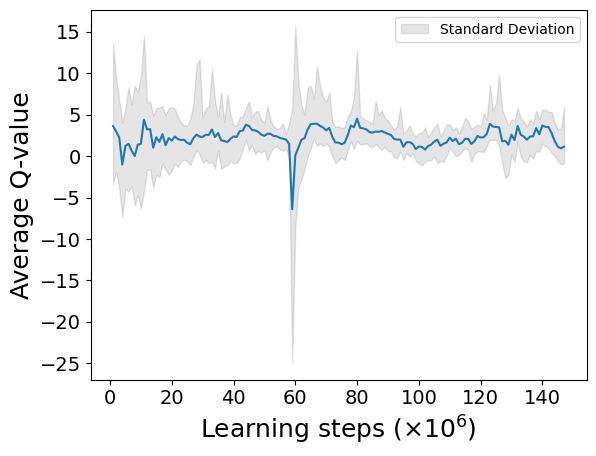

2024-07-27 03:38:17.802816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 35084.9

 time for simulate one day : 4646.2
so long waited in  7
day start to termianl : 35084.9
so long waited in  7
day start to termianl : 35084.9
so long waited in  7
day start to termianl : 35084.9
so long waited in  7
day start to termianl : 35084.9
so long waited in  7
day start to termianl : 35084.9

average moving queuetime :  137.9 144.4
average stay queuetime :  984.1 1030.0
average total queuetime :  1122.0 1174.4
average chargecount :  1.0 1.0
average ordercount :  30.0 30.0
[50, 9, 1, 0, 12, 18, 19, 83, 62, 15, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.3458262222594717
code start to now : 730018.2
episode_reward :  -378.58535996612784
fit_count :  1470797
TD max = 44.33832525024415 TD min = 0.00010444769859320183
model updated

episode 89
day : 0


2024-07-27 04:18:39.010816: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:27:01.667180: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:27:03.786347: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:27:06.160500: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 04:31:08.248353: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


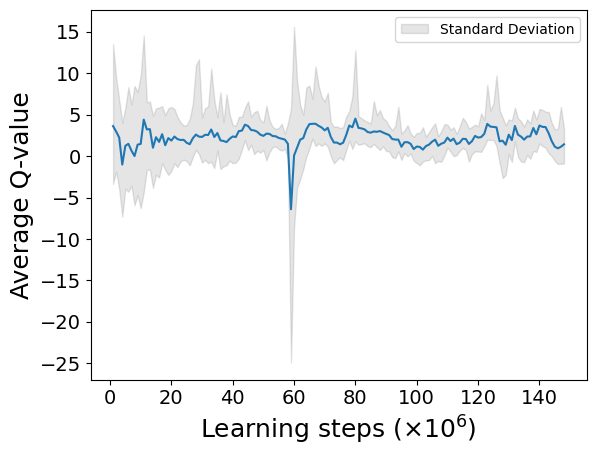

2024-07-27 05:01:40.386279: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38271.3

 time for simulate one day : 5268.5
so long waited in  7
day start to termianl : 38271.3
so long waited in  7
day start to termianl : 38271.3
so long waited in  7
day start to termianl : 38271.3

average moving queuetime :  142.4 187.0
average stay queuetime :  1058.7 1390.4
average total queuetime :  1201.1 1577.4
average chargecount :  1.3 1.3
average ordercount :  34.1 34.1
[45, 14, 1, 0, 34, 21, 26, 45, 72, 64, 1, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4886436981414992
code start to now : 735290.4
episode_reward :  -443.96487711544927
fit_count :  1481359
TD max = 30.16138215789795 TD min = 0.00010444769859320183
model updated

episode 90
day : 0


2024-07-27 05:11:59.840855: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 05:39:27.375320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:00:00.270882: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:05:23.365388: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:13:34.191570: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


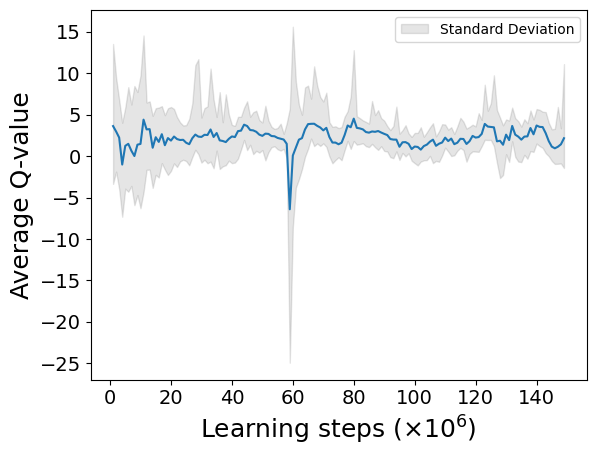

2024-07-27 06:22:32.450567: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:32:07.471157: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38811.3

 time for simulate one day : 5350.2

average moving queuetime :  131.3 208.3
average stay queuetime :  1202.1 1907.3
average total queuetime :  1333.4 2115.6
average chargecount :  1.6 1.6
average ordercount :  34.4 34.4
[60, 29, 26, 38, 31, 40, 33, 32, 53, 78, 4, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.4516360719146224
code start to now : 740644.3
episode_reward :  -527.3701877653799
fit_count :  1492102
TD max = 37.85522176513672 TD min = 0.00010444769859320183
model updated

episode 91
day : 0


2024-07-27 06:46:13.258143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 06:55:04.998170: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:02:24.428674: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:09:10.240523: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 07:17:51.518641: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


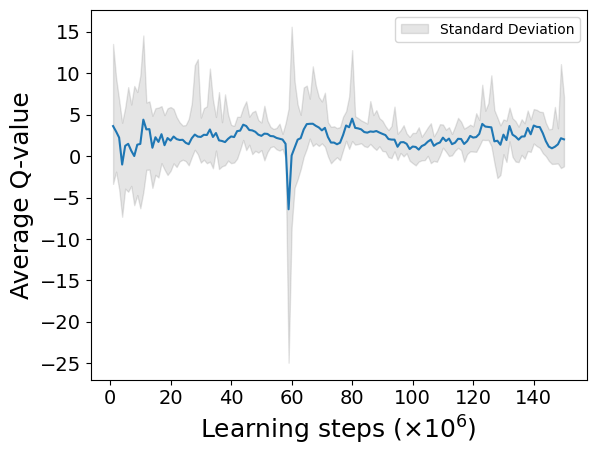

2024-07-27 07:56:03.874289: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 38734.2

 time for simulate one day : 5396.7
so long waited in  7
day start to termianl : 38734.2
so long waited in  7
day start to termianl : 38734.2
so long waited in  7
day start to termianl : 38734.2
so long waited in  7
day start to termianl : 38734.2
so long waited in  7
day start to termianl : 38734.2
so long waited in  7
day start to termianl : 38734.2

average moving queuetime :  131.5 172.3
average stay queuetime :  1269.5 1663.0
average total queuetime :  1401.0 1835.3
average chargecount :  1.3 1.3
average ordercount :  34.3 34.3
[49, 11, 0, 0, 23, 26, 24, 36, 72, 76, 2, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5073285336957167
code start to now : 746048.3
episode_reward :  -527.6075725354906
fit_count :  1502706
TD max = 83.9151260925293 TD min = 0.00010444769859320183
model updated

episode 92
day : 0


2024-07-27 08:17:49.001282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:35:07.358800: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:35:54.750832: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:38:15.335435: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 08:38:55.618015: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 09:01:25.961192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


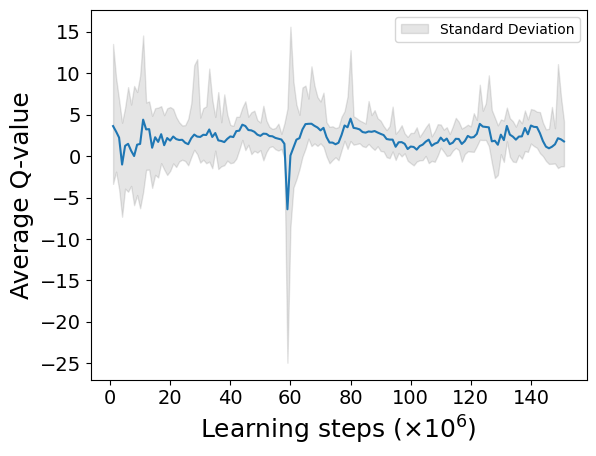

2024-07-27 09:11:54.789299: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41501.9

 time for simulate one day : 5790.3
so long waited in  7
day start to termianl : 41501.9

average moving queuetime :  135.2 201.9
average stay queuetime :  1171.9 1750.0
average total queuetime :  1307.1 1951.9
average chargecount :  1.5 1.5
average ordercount :  37.3 37.3
[56, 4, 0, 3, 28, 29, 37, 48, 71, 56, 44, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5704630931241796
code start to now : 751842.6
episode_reward :  -535.2813731079312
fit_count :  1514262
TD max = 29.19348216781616 TD min = 0.000102425909042314
model updated

episode 93
day : 0


2024-07-27 10:14:59.601179: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:15:15.070797: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:18:15.731316: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 10:28:42.189705: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


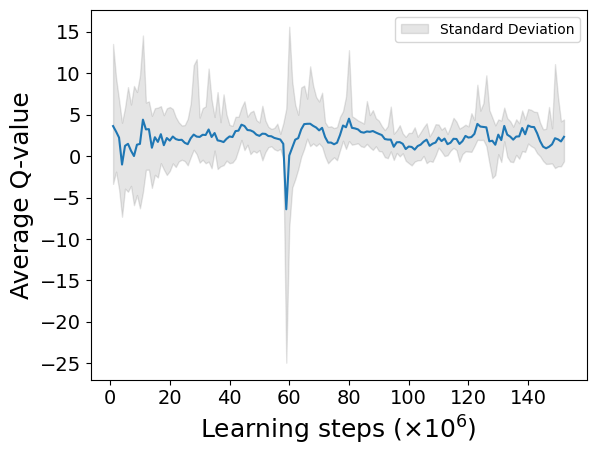

2024-07-27 11:07:29.861156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:13:16.034564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:20:22.228886: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 41644.1

 time for simulate one day : 5856.3
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long waited in  7
day start to termianl : 41644.1
so long w

2024-07-27 11:30:13.187200: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 11:37:01.631223: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


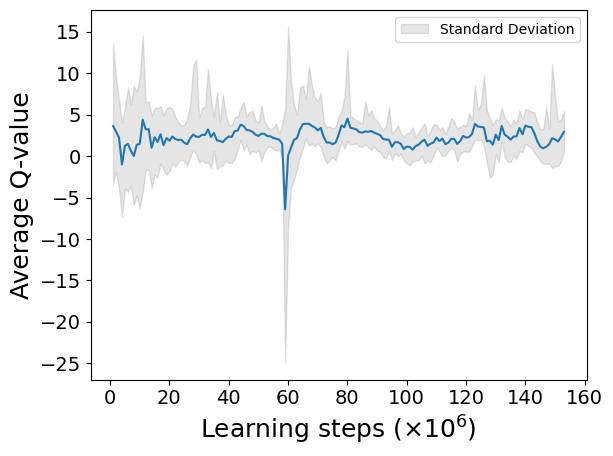

2024-07-27 12:04:24.387047: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:08:37.198496: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:11:07.151152: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:59:04.675976: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 12:59:23.480513: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 13:00:06.249719: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 13:02:51.251149: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42897.3

 time for simulate one day : 6111.2
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long waited in  7
day start to termianl : 42897.3
so long w

2024-07-27 13:13:13.452663: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


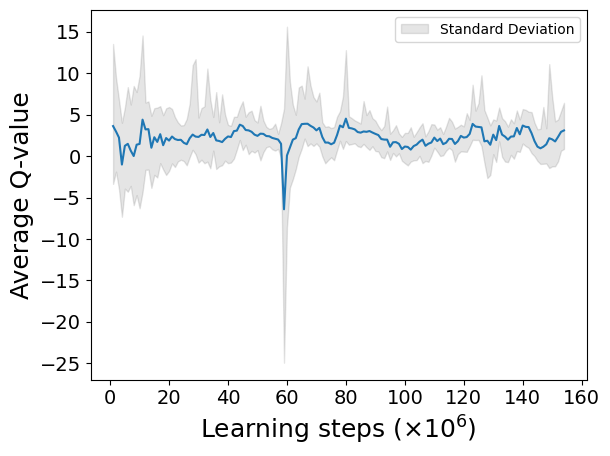

2024-07-27 14:29:08.055588: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 14:29:22.019791: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 40843.6

 time for simulate one day : 5848.8
so long waited in  7
day start to termianl : 40843.6
so long waited in  7
day start to termianl : 40843.6

average moving queuetime :  146.7 239.2
average stay queuetime :  932.6 1520.1
average total queuetime :  1079.3 1759.3
average chargecount :  1.6 1.6
average ordercount :  37.3 37.3
[60, 0, 0, 6, 41, 52, 38, 57, 38, 88, 54, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5496401225890952
code start to now : 769701.4
episode_reward :  -484.96271181081966
fit_count :  1549958
TD max = 37.2975365901947 TD min = 0.00010391006469727118
model updated

episode 96
day : 0


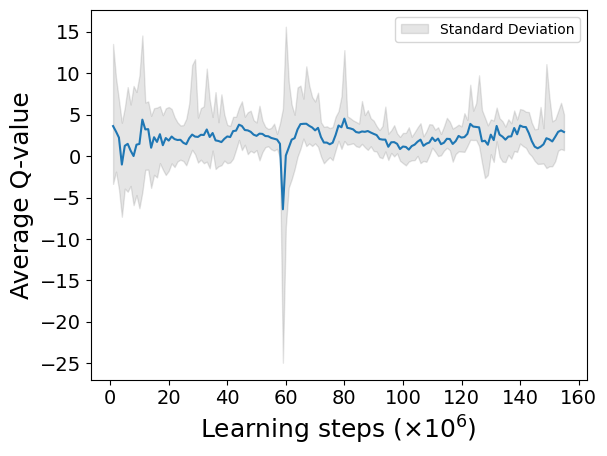

2024-07-27 14:58:06.253564: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:02:01.771218: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:10:10.387562: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:23:03.380911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:28:44.551182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:41:02.901351: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 15:55:54.470603: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


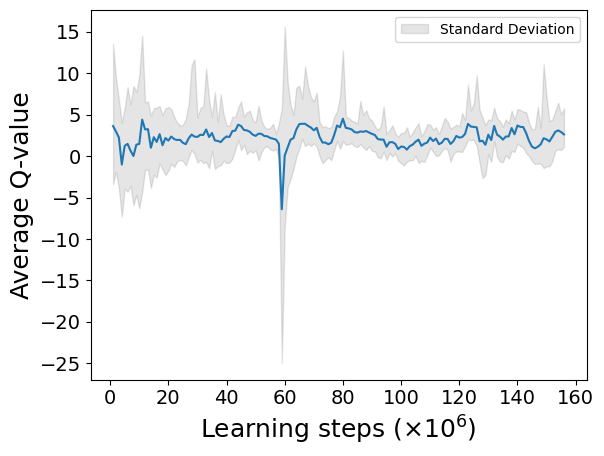

2024-07-27 16:19:37.271232: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 42438.4

 time for simulate one day : 6052.1
so long waited in  7
day start to termianl : 42438.4

average moving queuetime :  161.4 285.7
average stay queuetime :  994.5 1760.3
average total queuetime :  1155.9 2046.0
average chargecount :  1.8 1.8
average ordercount :  38.6 38.6
[55, 5, 0, 7, 43, 82, 37, 57, 34, 80, 68, 12]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5646900764963942
code start to now : 775757.6
episode_reward :  -541.3776154212521
fit_count :  1562035
TD max = 61.82785685310364 TD min = 0.00010292778015137385
model updated

episode 97
day : 0


2024-07-27 16:25:03.390150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 16:28:42.379481: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 16:42:49.377062: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 16:43:00.717709: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:03:30.272039: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:28:11.027951: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


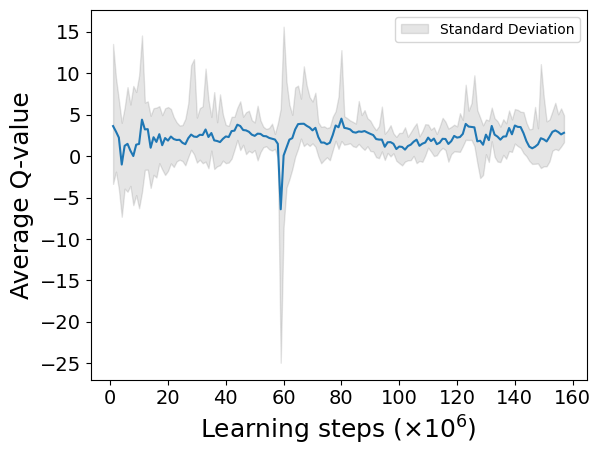

2024-07-27 17:46:00.313226: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 17:50:19.531240: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 44448.1

 time for simulate one day : 6210.8
so long waited in  7
day start to termianl : 44448.1

average moving queuetime :  163.1 290.9
average stay queuetime :  1083.1 1931.5
average total queuetime :  1246.2 2222.4
average chargecount :  1.8 1.8
average ordercount :  39.5 39.5
[60, 0, 0, 11, 56, 52, 51, 46, 81, 66, 63, 42]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5355928554153269
code start to now : 781976.4
episode_reward :  -462.3417808914515
fit_count :  1574654
TD max = 41.749894197082526 TD min = 0.00010112056732182176
model updated

episode 98
day : 0


2024-07-27 18:33:00.922758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 18:40:20.895693: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


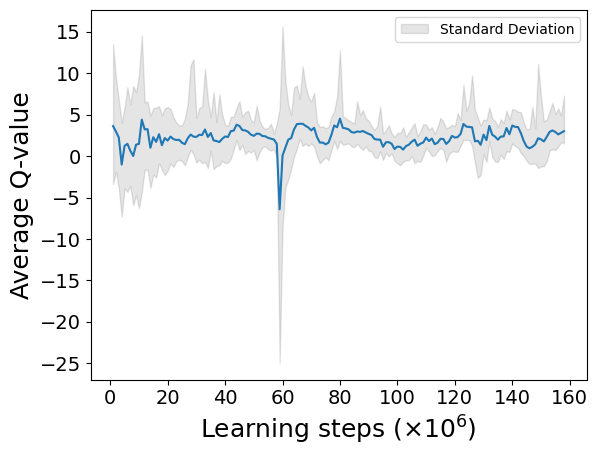

2024-07-27 19:08:51.589902: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6278.1

average moving queuetime :  158.1 287.8
average stay queuetime :  963.4 1753.4
average total queuetime :  1121.5 2041.2
average chargecount :  1.8 1.8
average ordercount :  39.9 39.9
day : 1


2024-07-27 19:56:04.721192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:01:12.052363: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:12:47.019978: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


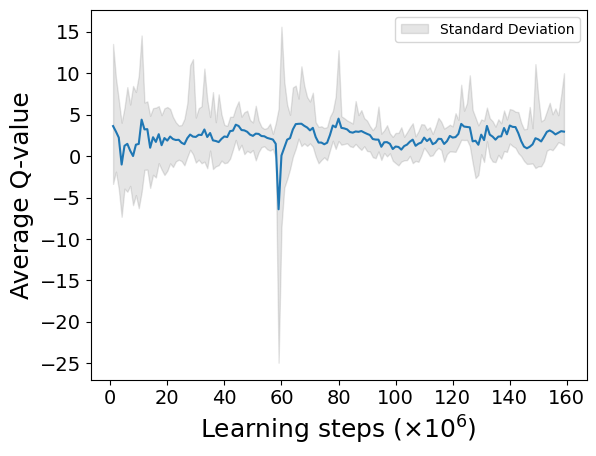

2024-07-27 20:18:09.871131: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:21:57.481217: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:22:16.770541: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 20:24:48.144987: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:15:42.343227: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:24:18.857256: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


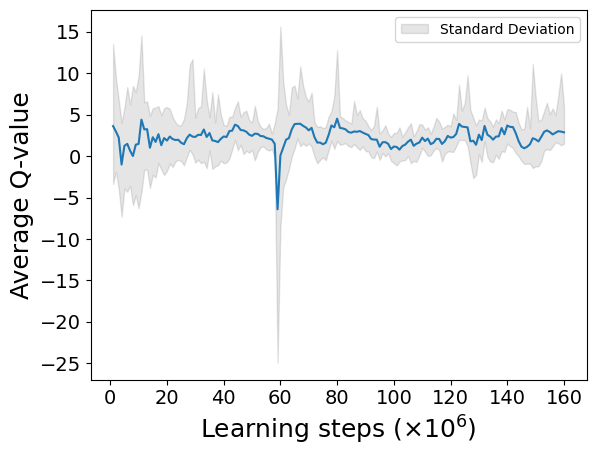


 time for simulate one day : 6476.8

average moving queuetime :  158.1 342.7
average stay queuetime :  881.0 1758.7
average total queuetime :  1039.1 2101.4
average chargecount :  2.0 2.2
average ordercount :  39.8 39.7
day : 2


2024-07-27 21:40:30.921206: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 21:58:01.227796: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:13:37.739111: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:18:33.761184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:25:42.935808: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:37:56.511227: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:43:36.869060: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 22:46:43.341673: W tensorflow/core/data/root_dataset.cc:24

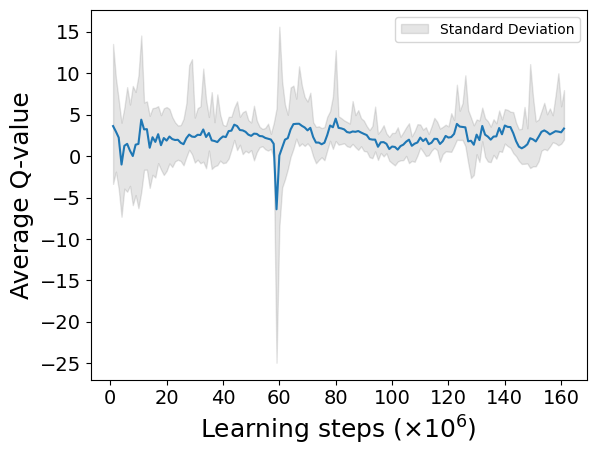

2024-07-27 23:02:53.617942: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:05:02.440595: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:07:14.568552: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:13:54.307908: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6355.0

average moving queuetime :  156.2 351.3
average stay queuetime :  929.5 2331.1
average total queuetime :  1085.6 2682.5
average chargecount :  2.1 2.3
average ordercount :  39.5 39.0
[59, 1, 0, 7, 60, 72, 38, 47, 67, 67, 71, 57]
[78, 42, 24, 51, 45, 66, 52, 52, 65, 51, 70, 54]
[100, 26, 48, 38, 51, 31, 59, 67, 78, 62, 55, 75]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.5971811861072815
code start to now : 801098.7
episode_reward :  -822.3736798315681
fit_count :  1613398
TD max = 41.749894197082526 TD min = 0.00010112056732182176
model updated

episode 99
day : 0


2024-07-27 23:26:25.641146: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:27:44.517757: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:32:57.670533: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:40:22.844245: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:50:03.291133: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:53:30.298826: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-27 23:54:12.691192: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:00:40.485448: W tensorflow/core/data/root_dataset.cc:24

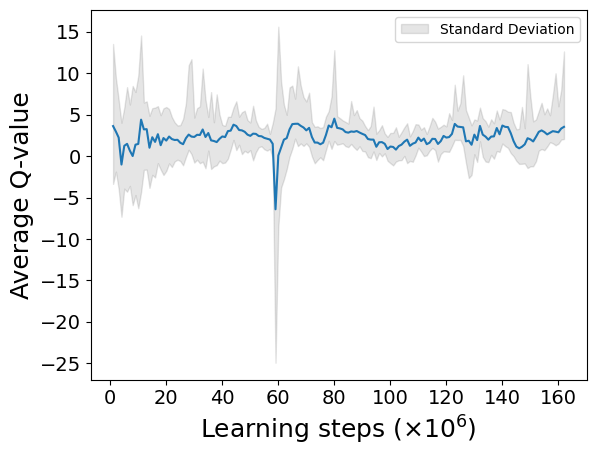

2024-07-28 00:41:58.741289: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:51:43.005171: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 00:51:46.369943: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6278.0

average moving queuetime :  148.8 276.8
average stay queuetime :  908.7 1690.2
average total queuetime :  1057.5 1966.9
average chargecount :  1.9 1.9
average ordercount :  40.0 40.0
day : 1


2024-07-28 01:10:21.018527: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:18:17.154465: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:25:32.930917: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:26:05.019016: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:26:49.121318: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:27:23.756883: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:38:48.391419: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 01:40:24.094529: W tensorflow/core/data/root_dataset.cc:24

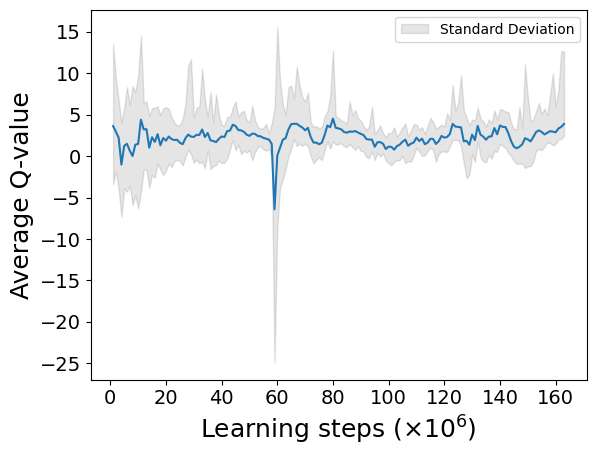

2024-07-28 01:48:31.991952: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 02:02:32.923432: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 02:23:17.511785: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 02:39:40.373250: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6342.7

average moving queuetime :  151.6 353.7
average stay queuetime :  961.8 2310.8
average total queuetime :  1113.3 2664.6
average chargecount :  2.1 2.3
average ordercount :  39.6 39.1
day : 2


2024-07-28 02:58:17.601150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


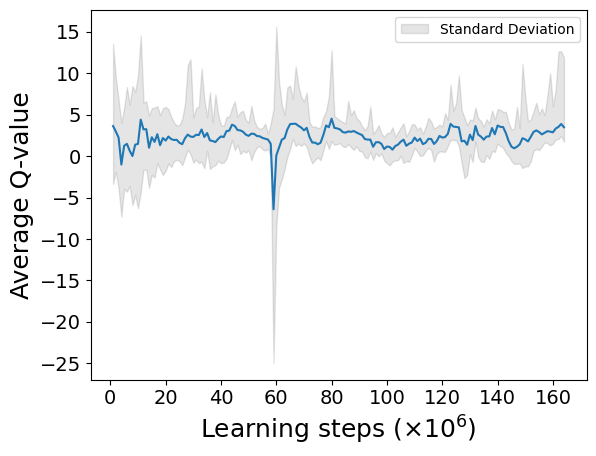

2024-07-28 03:15:57.944743: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 03:48:34.295138: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 03:55:32.836584: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 03:58:55.703097: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:08:41.760243: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:16:24.350306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:26:42.845046: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 04:27:09.505721: W tensorflow/core/data/root_dataset.cc:24

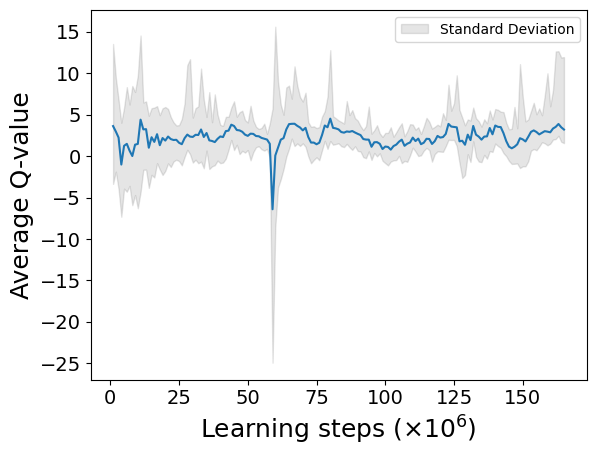


 time for simulate one day : 6448.6

average moving queuetime :  151.2 353.0
average stay queuetime :  909.1 1911.4
average total queuetime :  1060.4 2264.4
average chargecount :  2.2 2.3
average ordercount :  39.5 39.4
[60, 0, 0, 10, 48, 60, 66, 62, 81, 47, 66, 58]
[81, 18, 41, 51, 54, 55, 45, 64, 83, 71, 69, 58]
[86, 34, 40, 51, 57, 48, 58, 60, 87, 65, 53, 64]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.560630249017548
code start to now : 820180.3
episode_reward :  -929.7065468156869
fit_count :  1652190
TD max = 18.082914543038996 TD min = 0.0001035929679870761
model updated

episode 100
day : 0


2024-07-28 04:53:17.006085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:02:05.131146: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:27:13.040325: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


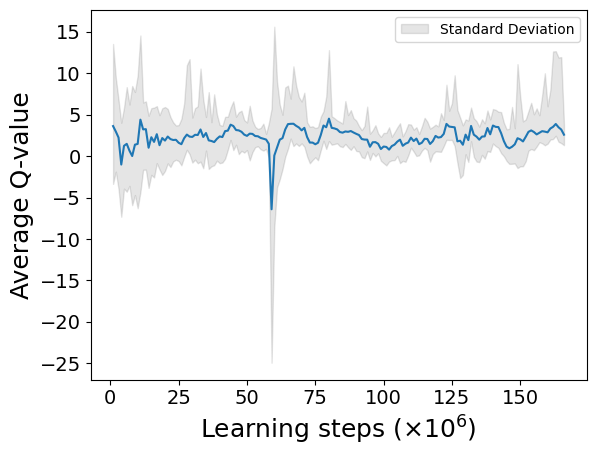

2024-07-28 05:55:25.179282: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 05:55:37.771175: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 06:19:02.621304: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6241.5

average moving queuetime :  151.2 346.7
average stay queuetime :  894.6 2051.5
average total queuetime :  1045.7 2398.2
average chargecount :  2.3 2.3
average ordercount :  39.2 39.2
day : 1


2024-07-28 06:42:22.218448: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:07:40.335241: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


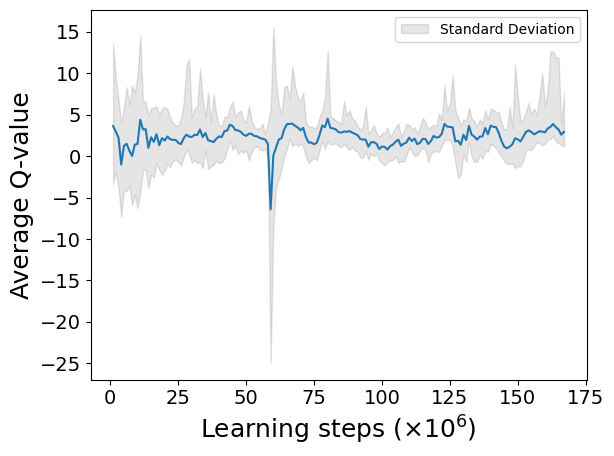

2024-07-28 07:16:23.721150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:17:06.810337: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:24:35.451199: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:38:06.359202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:44:45.401195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:48:06.333378: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:49:02.731161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 07:51:30.465723: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6470.5

average moving queuetime :  150.7 361.4
average stay queuetime :  849.7 1942.2
average total queuetime :  1000.4 2303.6
average chargecount :  2.4 2.4
average ordercount :  39.4 39.5
day : 2


2024-07-28 08:30:32.584914: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 08:31:08.571183: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


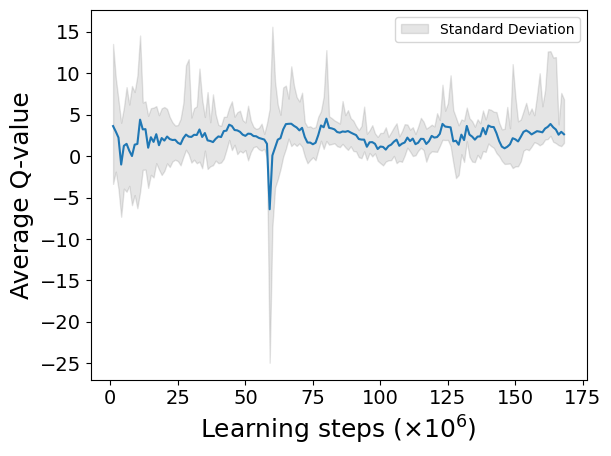

2024-07-28 08:46:26.241144: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 09:03:13.548631: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 09:29:42.429514: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 09:46:51.498911: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


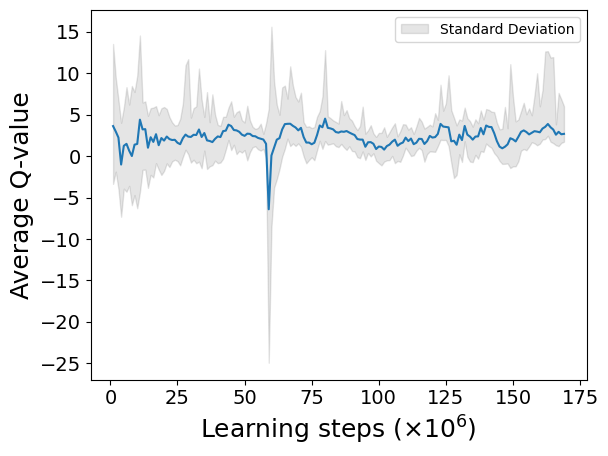


 time for simulate one day : 6512.8

average moving queuetime :  152.1 354.9
average stay queuetime :  793.7 1554.0
average total queuetime :  945.7 1908.9
average chargecount :  2.3 2.3
average ordercount :  39.6 40.0
[108, 34, 40, 23, 46, 63, 67, 64, 77, 70, 60, 36]
[100, 45, 47, 41, 45, 59, 46, 74, 86, 59, 49, 71]
[97, 39, 36, 44, 55, 57, 52, 73, 90, 57, 45, 42]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.474266692326656
code start to now : 839417.8
episode_reward :  -800.4669846785381
fit_count :  1691220
TD max = 14.607186787223815 TD min = 0.00010300884246806632
model updated

episode 101
day : 0


2024-07-28 10:04:45.162907: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:20:31.761138: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:20:43.381243: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:34:25.720060: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:38:30.559461: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 10:48:31.423110: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:13:16.221514: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


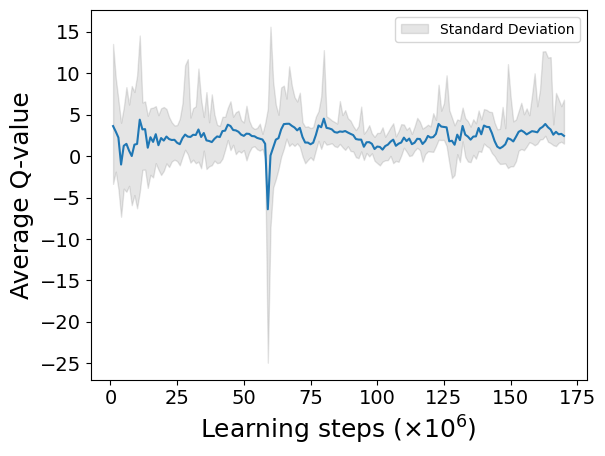

2024-07-28 11:26:26.821182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:28:06.169150: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 11:33:28.991131: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6360.8

average moving queuetime :  158.2 300.5
average stay queuetime :  723.7 1375.1
average total queuetime :  881.9 1675.6
average chargecount :  1.9 1.9
average ordercount :  40.1 40.1
day : 1


2024-07-28 12:15:34.555515: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:32:20.088103: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 12:32:25.430202: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


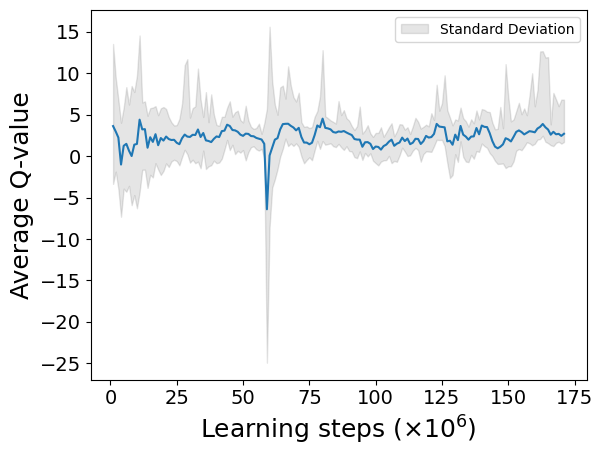

2024-07-28 12:42:54.663923: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:00:22.799035: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:19:32.241306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6408.0

average moving queuetime :  153.5 352.5
average stay queuetime :  708.8 1639.8
average total queuetime :  862.4 1992.3
average chargecount :  2.1 2.4
average ordercount :  39.9 39.7
day : 2


2024-07-28 13:40:11.929062: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 13:41:53.631210: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


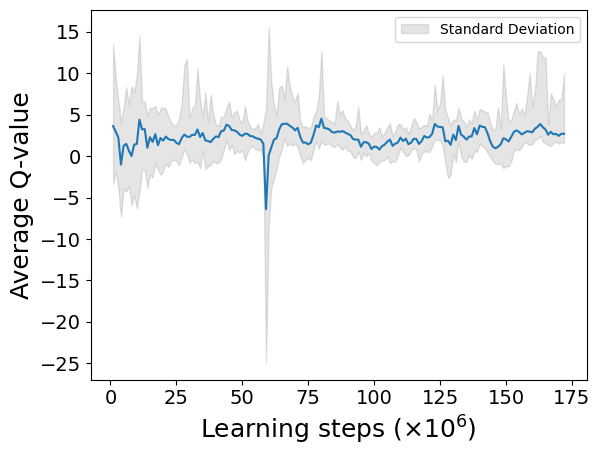

2024-07-28 14:06:15.247256: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 14:17:48.019311: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:01:50.922333: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 15:06:29.460112: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


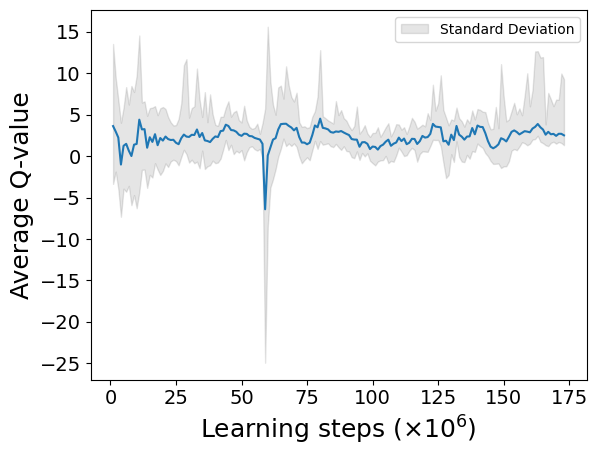


 time for simulate one day : 6459.0

average moving queuetime :  153.6 363.6
average stay queuetime :  704.0 1643.5
average total queuetime :  857.7 2007.1
average chargecount :  2.2 2.4
average ordercount :  39.8 39.5
[60, 0, 0, 8, 73, 52, 60, 71, 81, 71, 55, 39]
[97, 40, 48, 42, 41, 63, 49, 72, 78, 73, 58, 45]
[108, 33, 46, 41, 55, 60, 49, 67, 95, 57, 68, 30]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.476566444980637
code start to now : 858658.1
episode_reward :  -540.8099330927214
fit_count :  1730309
TD max = 4.912845118141174 TD min = 0.00010300884246806632
model updated

episode 102
day : 0


2024-07-28 15:47:54.855220: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:21:47.831198: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:23:55.761328: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:37:38.887923: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 16:41:22.179427: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


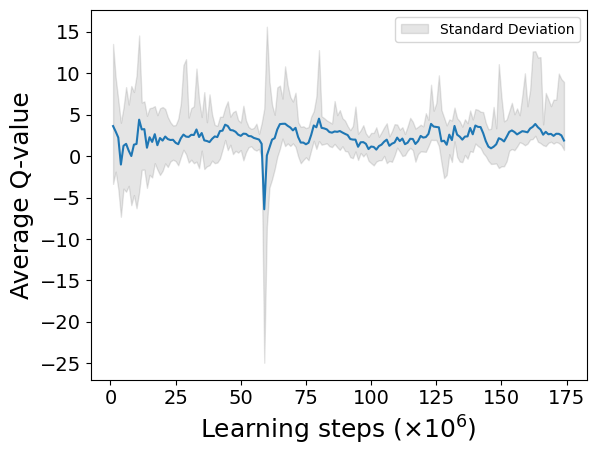


 time for simulate one day : 6255.9

average moving queuetime :  150.7 289.9
average stay queuetime :  622.0 1196.3
average total queuetime :  772.8 1486.3
average chargecount :  1.9 1.9
average ordercount :  40.1 40.1
day : 1


2024-07-28 17:38:52.251895: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:46:12.372096: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 17:58:16.551220: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:04:06.846243: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


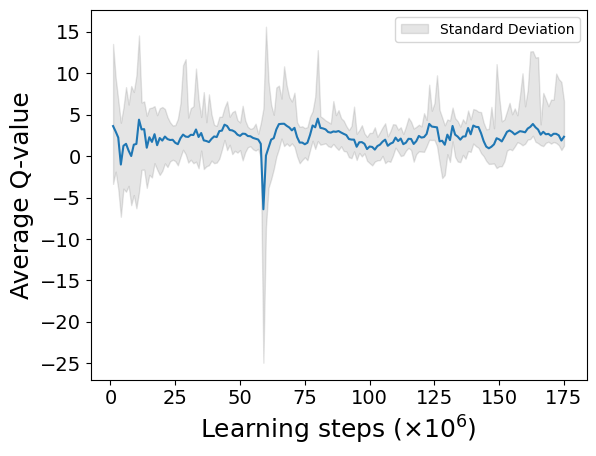

2024-07-28 18:25:39.637927: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 18:55:07.080680: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6519.8

average moving queuetime :  153.1 365.2
average stay queuetime :  583.9 1302.6
average total queuetime :  736.9 1667.8
average chargecount :  2.1 2.4
average ordercount :  40.1 40.0
day : 2


2024-07-28 19:07:52.632349: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


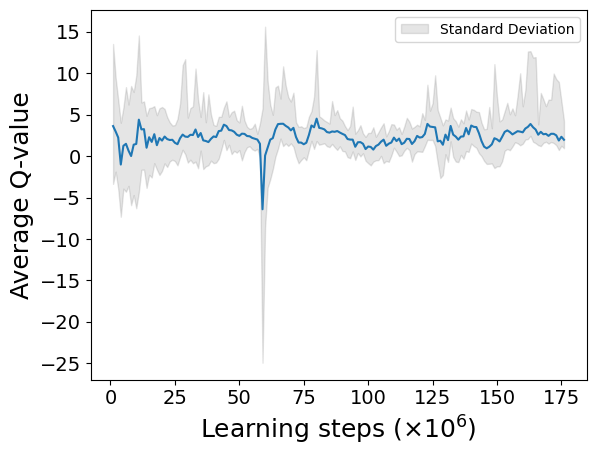

2024-07-28 19:38:43.065804: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 19:39:53.448839: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:08:19.442106: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:16:04.006249: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:20:29.444532: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:23:15.479233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:23:42.250167: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 20:26:01.725122: W tensorflow/core/data/root_dataset.cc:24


 time for simulate one day : 6493.9

average moving queuetime :  156.4 397.9
average stay queuetime :  557.0 1251.3
average total queuetime :  713.4 1649.2
average chargecount :  2.2 2.5
average ordercount :  40.0 39.9
[60, 0, 0, 10, 64, 75, 51, 65, 88, 76, 38, 50]
[104, 37, 58, 39, 60, 47, 52, 74, 95, 62, 39, 40]
[110, 53, 46, 36, 66, 52, 53, 67, 104, 66, 56, 27]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.434197244778325
code start to now : 877940.1
episode_reward :  -355.7939427510999
fit_count :  1769652
TD max = 4.980053031539916 TD min = 0.00010180721282960761
model updated

episode 103
day : 0


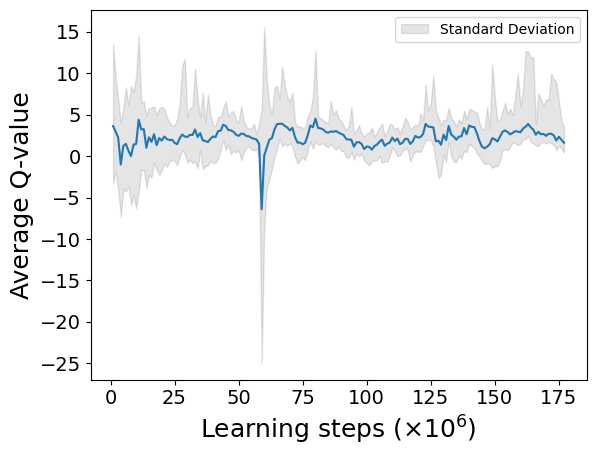

2024-07-28 21:02:42.476163: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:03:00.257306: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:08:14.401212: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:16:31.051187: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:17:37.317551: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 21:34:27.823382: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:03:57.262248: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:10:20.830635: W tensorflow/core/data/root_dataset.cc:24

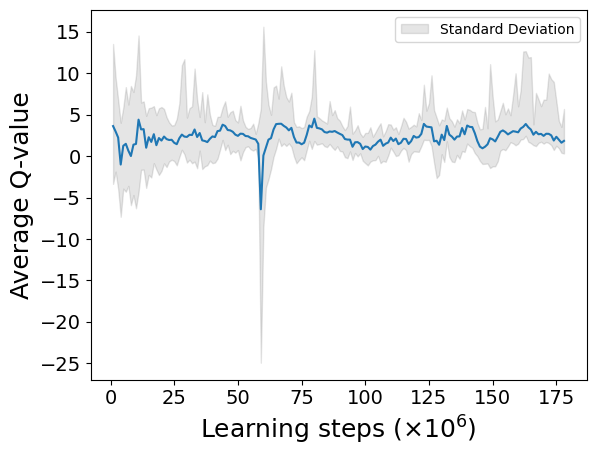

2024-07-28 22:19:23.172078: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6382.7

average moving queuetime :  153.7 278.6
average stay queuetime :  467.3 847.3
average total queuetime :  620.9 1125.9
average chargecount :  1.8 1.8
average ordercount :  40.6 40.6
day : 1


2024-07-28 22:42:46.732314: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:42:55.152333: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:43:22.619679: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 22:53:13.167999: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:13:18.582085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:14:41.924645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:19:09.090441: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-28 23:23:07.526060: W tensorflow/core/data/root_dataset.cc:24

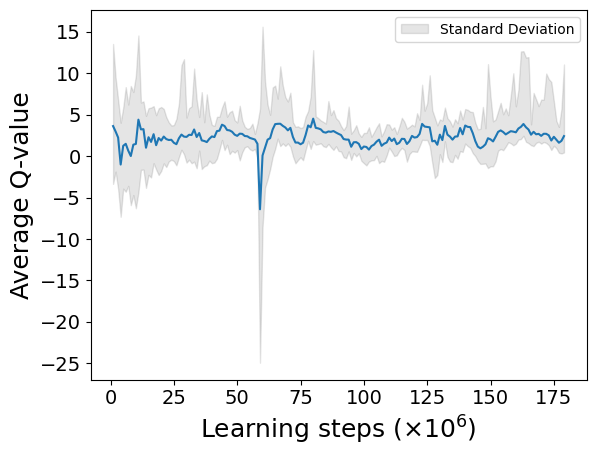

2024-07-29 00:14:38.172094: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6588.4

average moving queuetime :  154.6 361.4
average stay queuetime :  432.5 943.2
average total queuetime :  587.1 1304.7
average chargecount :  2.1 2.3
average ordercount :  40.6 40.6
day : 2
so long waited in  7
day start to termianl : 3961.4

 time for simulate one day : 399.5

average moving queuetime :  155.0 58.0
average stay queuetime :  409.1 51.9
average total queuetime :  564.1 109.9
average chargecount :  1.5 0.4
average ordercount :  27.5 1.3
[60, 0, 0, 10, 63, 47, 57, 64, 87, 71, 35, 50]
[99, 54, 46, 38, 42, 59, 57, 75, 75, 75, 34, 44]
[91, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  3.177798310507955
code start to now : 891319.7
episode_reward :  134.15346463054246
fit_count :  1796833
TD max = 7.101849854087829 TD min = 0.0001030779838562367
best model updated
model updated

episode 104
day : 0


2024-07-29 00:32:11.878577: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 00:36:43.179233: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


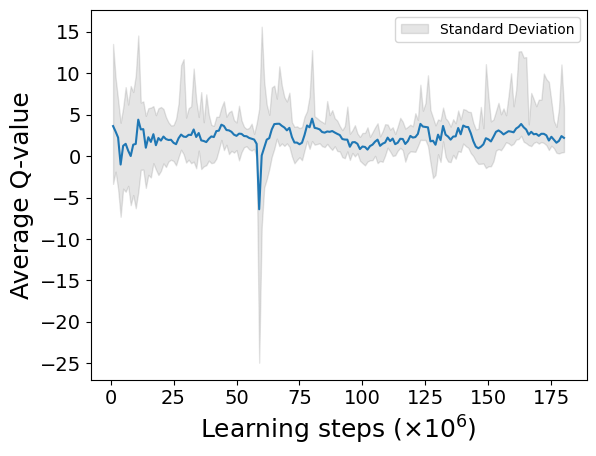

2024-07-29 01:46:33.508433: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 02:06:27.465182: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 02:15:01.190360: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6352.1

average moving queuetime :  150.0 302.6
average stay queuetime :  814.2 1642.0
average total queuetime :  964.3 1944.6
average chargecount :  2.0 2.0
average ordercount :  39.6 39.6
day : 1


2024-07-29 02:18:13.410644: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


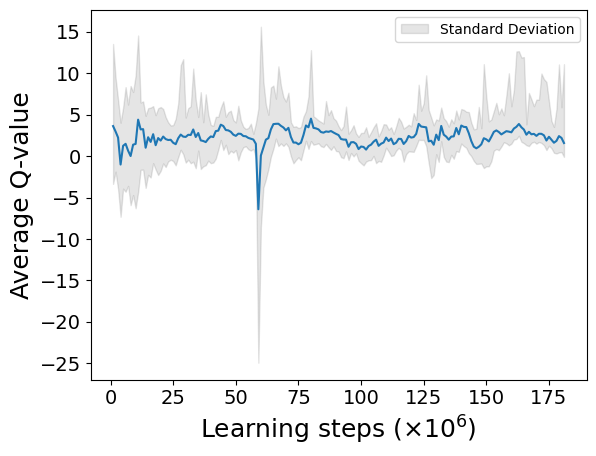

2024-07-29 02:32:17.459436: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 03:16:24.479664: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


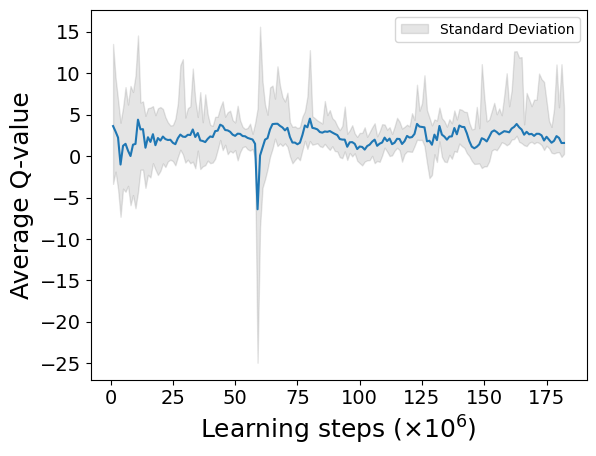

2024-07-29 03:50:13.880341: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6489.9

average moving queuetime :  149.8 361.4
average stay queuetime :  705.4 1485.4
average total queuetime :  855.2 1846.7
average chargecount :  2.2 2.4
average ordercount :  39.7 39.9
day : 2


2024-07-29 04:22:46.927967: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:23:06.670087: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:23:09.201142: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:26:20.854874: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:31:12.282864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:33:40.383838: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 04:47:52.598758: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


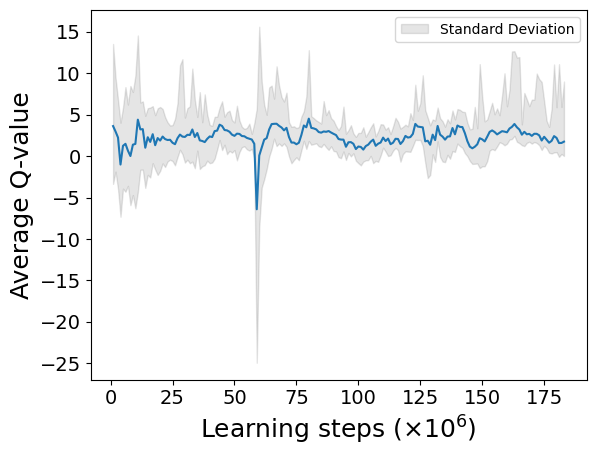

2024-07-29 05:10:00.440247: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:16:09.460529: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 05:45:23.987693: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6560.3

average moving queuetime :  151.6 373.0
average stay queuetime :  643.8 1276.2
average total queuetime :  795.4 1649.3
average chargecount :  2.3 2.4
average ordercount :  39.9 40.2
[59, 1, 0, 13, 70, 71, 39, 68, 96, 74, 56, 58]
[98, 38, 36, 54, 63, 51, 40, 62, 106, 57, 68, 52]
[93, 46, 34, 46, 49, 54, 57, 66, 89, 63, 71, 54]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.501630446076118
code start to now : 910734.8
episode_reward :  -574.9528320259283
fit_count :  1836118
TD max = 14.143122589683532 TD min = 0.0001030779838562367
model updated

episode 105
day : 0


2024-07-29 05:55:01.418672: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


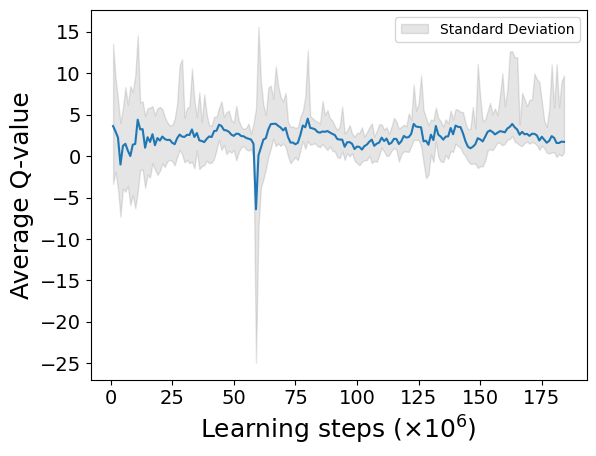

2024-07-29 06:36:39.087147: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:39:48.551259: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 06:58:10.542832: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:00:31.455731: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:06:14.488508: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 07:24:41.710357: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6301.7

average moving queuetime :  157.8 266.2
average stay queuetime :  475.6 802.2
average total queuetime :  633.5 1068.5
average chargecount :  1.7 1.7
average ordercount :  40.4 40.4
day : 1


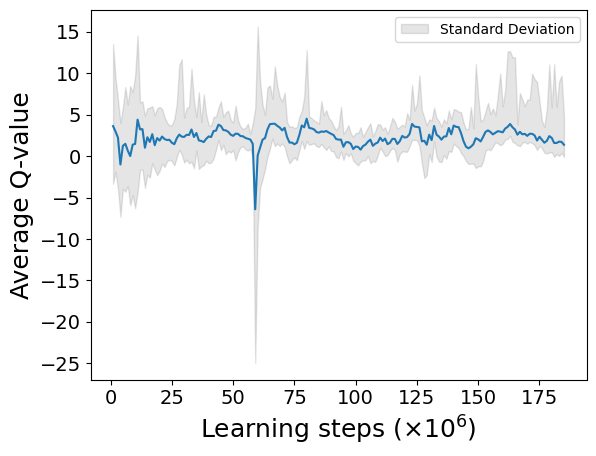

2024-07-29 07:50:38.165774: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:01:19.866809: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:07:32.522951: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:15:32.381158: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:22:19.011254: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:30:48.471161: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:41:40.400789: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 08:47:10.360886: W tensorflow/core/data/root_dataset.cc:24

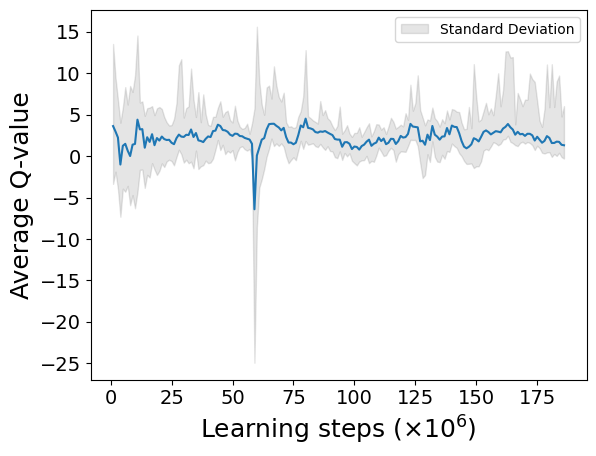


 time for simulate one day : 6548.7

average moving queuetime :  159.4 364.9
average stay queuetime :  421.2 865.7
average total queuetime :  580.6 1230.5
average chargecount :  2.0 2.3
average ordercount :  40.4 40.5
day : 2


2024-07-29 09:59:17.949011: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:01:36.581129: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 10:26:40.280487: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


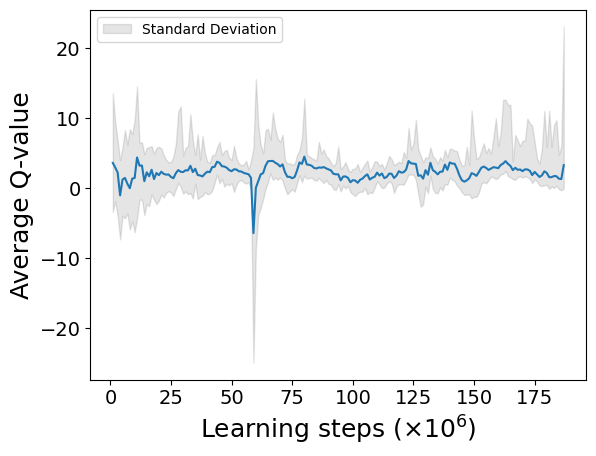


 time for simulate one day : 6428.9

average moving queuetime :  160.4 412.3
average stay queuetime :  485.7 1490.5
average total queuetime :  646.1 1902.9
average chargecount :  2.2 2.5
average ordercount :  40.2 39.7
[60, 0, 0, 6, 54, 54, 44, 40, 73, 80, 40, 55]
[87, 30, 34, 49, 45, 55, 64, 64, 85, 51, 56, 62]
[109, 36, 39, 44, 49, 63, 56, 68, 95, 70, 72, 62]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.531225089942852
code start to now : 930026.4
episode_reward :  -146.60995869833854
fit_count :  1875530
TD max = 14.143122589683532 TD min = 0.0001021886825561368
model updated

episode 106
day : 0


2024-07-29 11:22:40.391609: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:26:31.001184: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:27:04.731195: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 11:42:12.401137: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


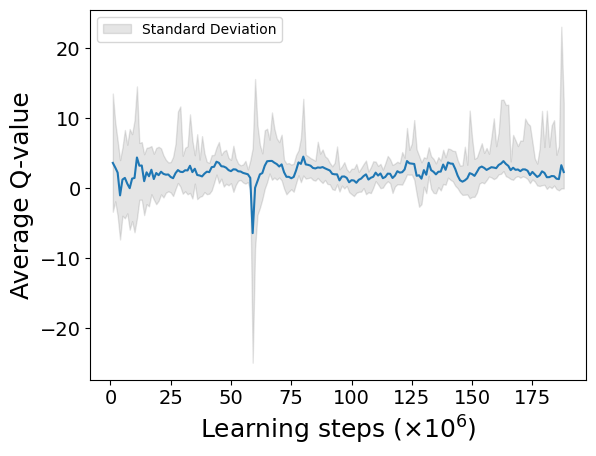

2024-07-29 11:57:02.146949: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:07:01.054381: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 12:41:04.810099: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6282.2

average moving queuetime :  165.0 301.9
average stay queuetime :  606.5 1110.0
average total queuetime :  771.5 1411.9
average chargecount :  1.8 1.8
average ordercount :  40.1 40.1
day : 1


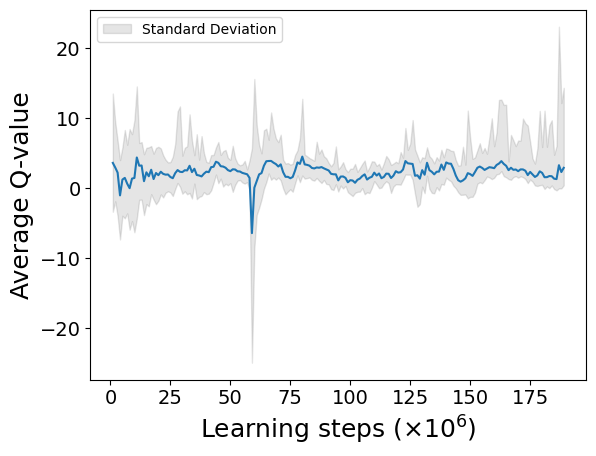

2024-07-29 13:16:43.151156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 13:41:42.530398: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:16:50.789798: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 14:30:02.436382: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


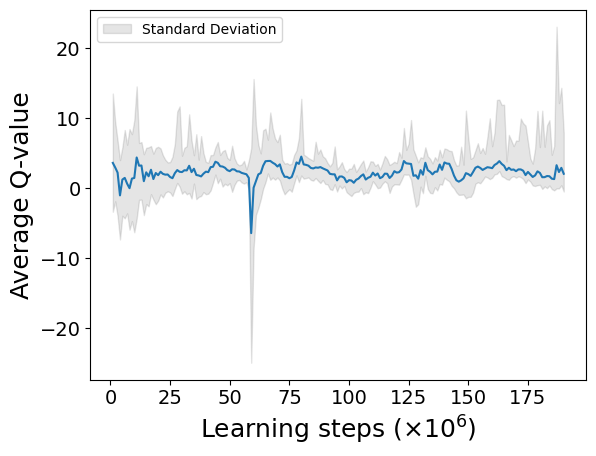

2024-07-29 14:44:09.989742: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6461.7

average moving queuetime :  157.8 373.1
average stay queuetime :  656.5 1697.8
average total queuetime :  814.4 2070.9
average chargecount :  2.1 2.4
average ordercount :  39.7 39.4
day : 2


2024-07-29 14:52:00.358824: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:07:52.016377: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:13:49.141277: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 15:33:24.304578: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


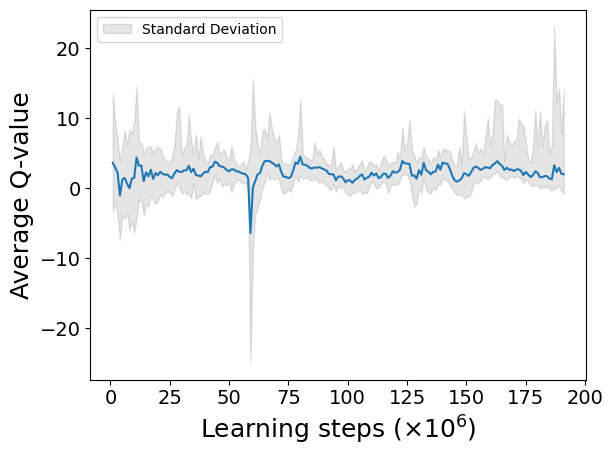

2024-07-29 16:07:33.543243: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6442.9

average moving queuetime :  154.7 341.9
average stay queuetime :  618.6 1258.7
average total queuetime :  773.3 1600.6
average chargecount :  2.2 2.3
average ordercount :  39.9 40.2
[60, 0, 0, 2, 28, 53, 63, 72, 89, 61, 72, 49]
[71, 40, 70, 32, 26, 49, 70, 76, 76, 83, 71, 70]
[65, 32, 45, 38, 75, 42, 49, 67, 86, 75, 60, 55]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.528011092499321
code start to now : 949225.4
episode_reward :  -525.0619182917612
fit_count :  1914677
TD max = 44.57845594177246 TD min = 0.00010427722930906871
model updated

episode 107
day : 0


2024-07-29 17:13:47.840153: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 17:15:55.097154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


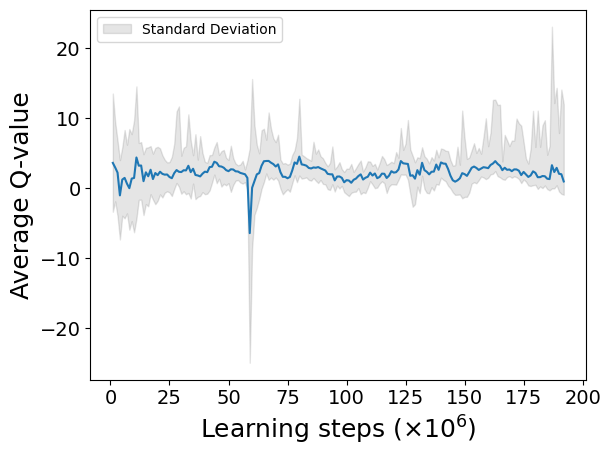

2024-07-29 17:24:38.880630: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 17:44:59.301143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:02:49.201256: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 18:03:00.171208: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6336.8

average moving queuetime :  157.1 268.2
average stay queuetime :  483.5 825.2
average total queuetime :  640.6 1093.4
average chargecount :  1.7 1.7
average ordercount :  40.8 40.8
day : 1


2024-07-29 18:36:24.160848: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


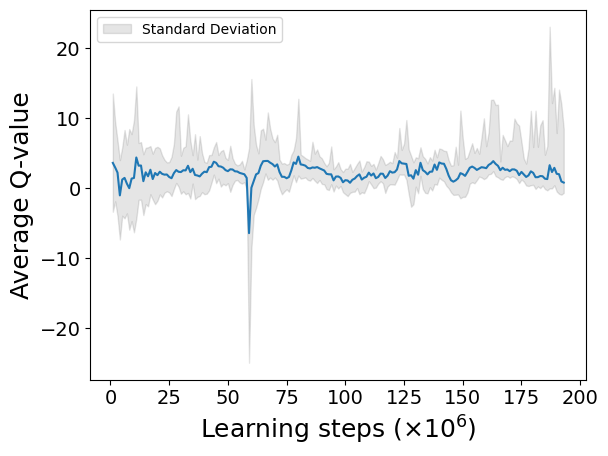

2024-07-29 18:45:29.199323: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:25:31.141168: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 19:35:43.490092: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 20:00:40.550584: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


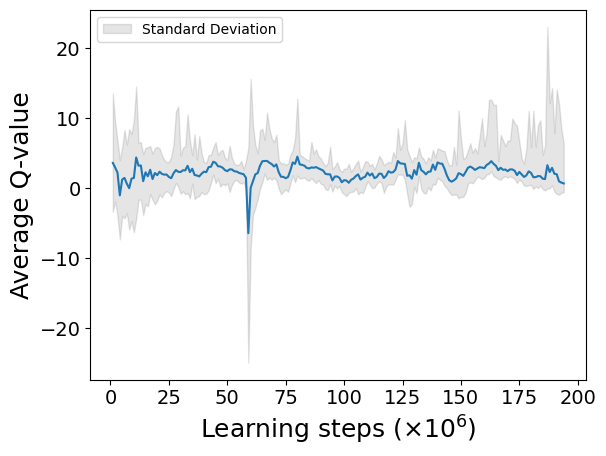


 time for simulate one day : 6495.5

average moving queuetime :  156.8 322.0
average stay queuetime :  460.8 909.1
average total queuetime :  617.7 1231.1
average chargecount :  1.9 2.1
average ordercount :  40.5 40.3
day : 2


2024-07-29 20:24:04.569119: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:20:30.974645: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


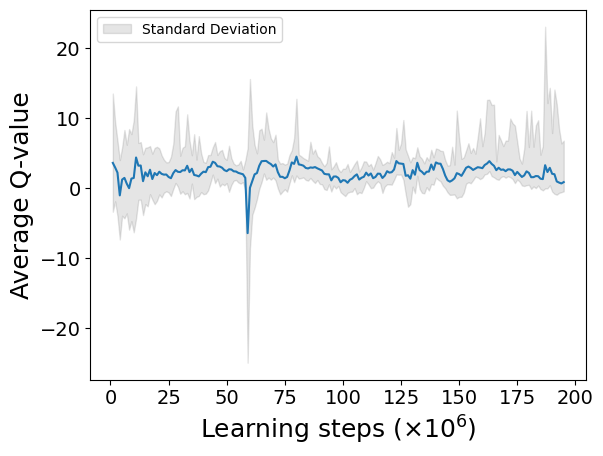

2024-07-29 21:36:55.050924: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 21:42:59.964464: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6407.4

average moving queuetime :  156.0 318.7
average stay queuetime :  480.6 1065.9
average total queuetime :  636.6 1384.6
average chargecount :  1.9 2.1
average ordercount :  40.4 40.2
[60, 0, 0, 0, 53, 47, 67, 33, 70, 76, 54, 52]
[80, 41, 22, 32, 61, 36, 24, 100, 52, 67, 45, 57]
[89, 33, 53, 27, 17, 32, 71, 56, 71, 48, 82, 40]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.581674766250571
code start to now : 968477.5
episode_reward :  -35.25239882709173
fit_count :  1954113
TD max = 44.57845594177246 TD min = 0.00010427722930906871
model updated

episode 108
day : 0


2024-07-29 21:56:19.112539: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 22:05:06.425864: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


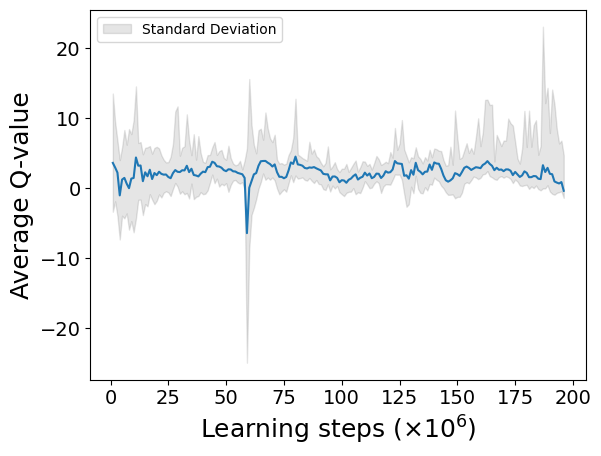

2024-07-29 22:51:13.592591: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:12:14.781339: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6267.7

average moving queuetime :  150.8 228.2
average stay queuetime :  1484.2 2246.1
average total queuetime :  1635.0 2474.3
average chargecount :  1.5 1.5
average ordercount :  40.5 40.5
day : 1


2024-07-29 23:41:35.398320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:43:51.451154: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-29 23:48:05.114746: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


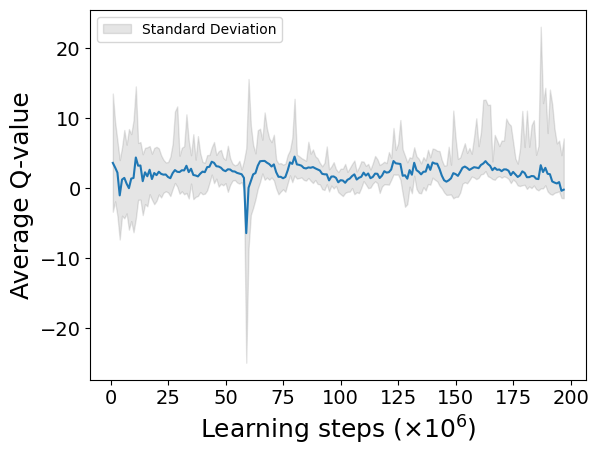

2024-07-30 00:39:19.478814: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:43:22.439101: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:49:32.939983: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:55:41.272828: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:56:16.200023: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 00:59:35.739435: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 01:01:16.140396: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 01:07:24.814328: W tensorflow/core/data/root_dataset.cc:24

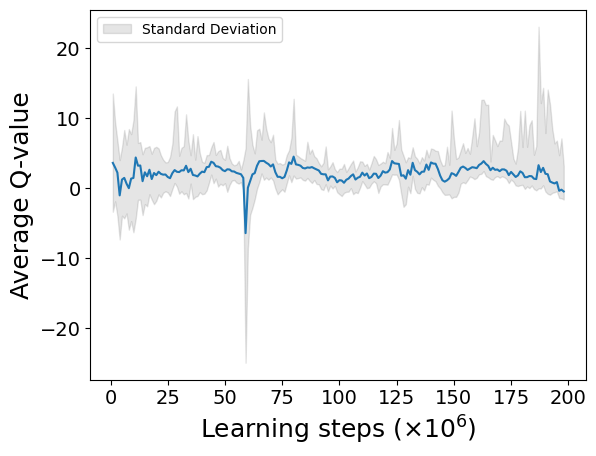


 time for simulate one day : 6425.8

average moving queuetime :  153.7 329.3
average stay queuetime :  1045.9 1547.0
average total queuetime :  1199.6 1876.3
average chargecount :  1.8 2.1
average ordercount :  40.2 39.9
day : 2


2024-07-30 01:37:51.281211: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 01:44:33.911250: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 02:29:04.068872: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 02:30:14.543581: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 02:39:06.271264: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 02:39:23.485971: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


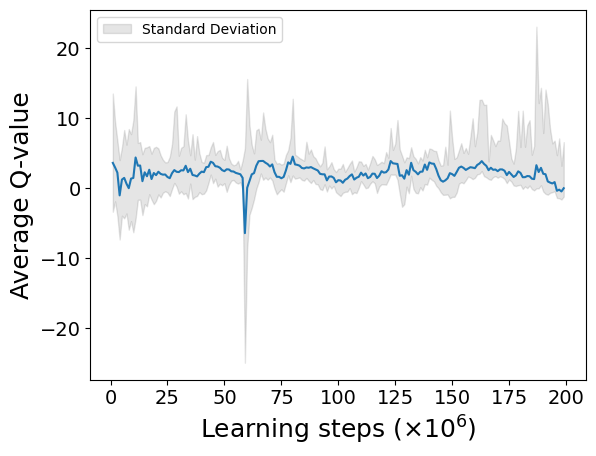

2024-07-30 02:53:19.841385: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6406.8

average moving queuetime :  153.7 321.4
average stay queuetime :  861.9 1136.8
average total queuetime :  1015.5 1458.2
average chargecount :  1.9 2.1
average ordercount :  40.2 40.1
[57, 0, 2, 0, 7, 35, 36, 73, 53, 59, 63, 69]
[95, 21, 30, 22, 23, 80, 52, 39, 74, 82, 70, 46]
[80, 24, 50, 23, 54, 30, 47, 75, 84, 68, 48, 45]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  5.65156711435295
code start to now : 987590.3
episode_reward :  -529.791545127537
fit_count :  1993266
TD max = 26.80542093048096 TD min = 0.00010087618827815384
model updated

episode 109
day : 0


2024-07-30 03:15:07.960445: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:18:17.431220: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:32:19.275300: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:38:35.459351: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:43:48.628159: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:43:51.878054: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:43:54.582313: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 03:47:50.871151: W tensorflow/core/data/root_dataset.cc:24

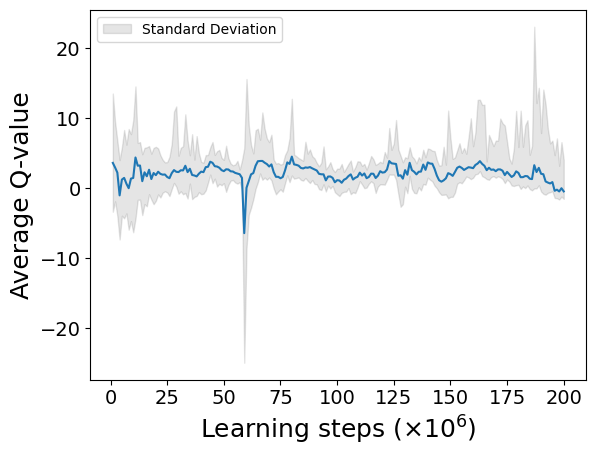

2024-07-30 04:35:46.702479: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 43000.2

 time for simulate one day : 6244.2
so long waited in  7
day start to termianl : 43000.2
so long waited in  7
day start to termianl : 43000.2
so long waited in  7
day start to termianl : 43000.2
so long waited in  7
day start to termianl : 43000.2
so long waited in  7
day start to termianl : 43000.2

average moving queuetime :  150.8 231.8
average stay queuetime :  809.5 1243.9
average total queuetime :  960.3 1475.7
average chargecount :  1.5 1.5
average ordercount :  39.8 39.8
[60, 0, 0, 2, 8, 38, 42, 80, 34, 54, 73, 17]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.6061410797402322
code start to now : 993838.5
episode_reward :  -295.0139320974867
fit_count :  2005758
TD max = 64.22259305725098 TD min = 0.00010087618827815384
model updated

episode 110
day : 0


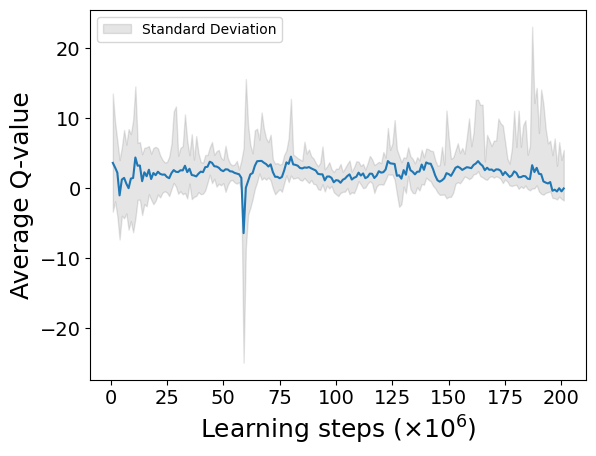

2024-07-30 05:50:02.821320: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 05:55:15.548697: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:08:03.290238: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 06:30:36.881132: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6287.6

average moving queuetime :  154.7 307.4
average stay queuetime :  683.1 1357.0
average total queuetime :  837.8 1664.4
average chargecount :  2.0 2.0
average ordercount :  40.2 40.2
day : 1


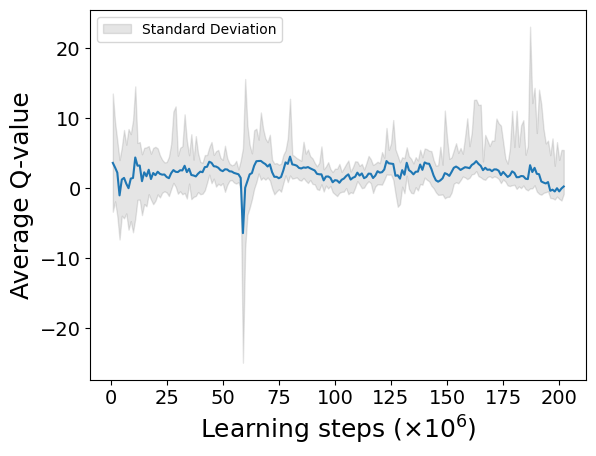

2024-07-30 07:23:21.622097: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 07:53:09.790334: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 07:53:41.069778: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:10:47.049085: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:12:17.363445: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


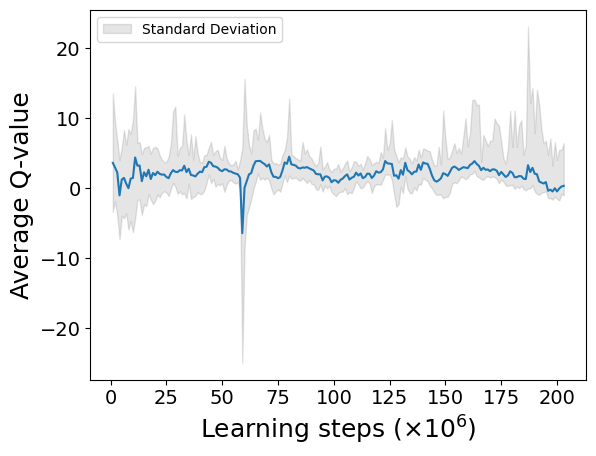


 time for simulate one day : 6508.9

average moving queuetime :  151.2 304.2
average stay queuetime :  640.0 1230.9
average total queuetime :  791.3 1535.1
average chargecount :  2.0 2.1
average ordercount :  40.2 40.2
day : 2


2024-07-30 08:37:16.479032: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:43:07.464043: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:44:39.850177: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 08:48:59.221143: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 09:12:51.181130: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


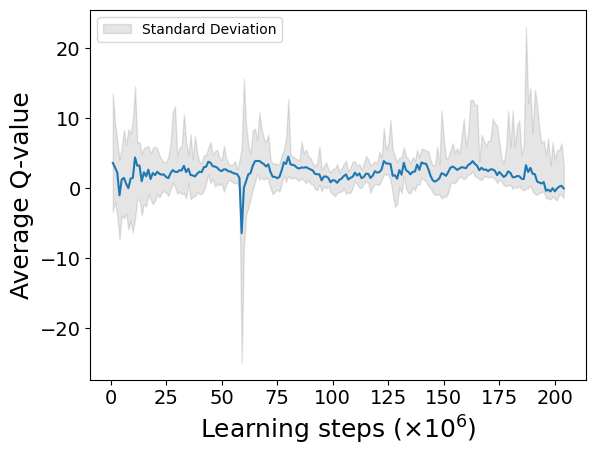

2024-07-30 09:53:49.143139: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 10:01:20.317824: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 10:03:35.515385: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 10:05:37.180253: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled



 time for simulate one day : 6402.4

average moving queuetime :  149.7 310.7
average stay queuetime :  702.7 1740.8
average total queuetime :  852.4 2051.5
average chargecount :  2.1 2.1
average ordercount :  40.0 39.6
[91, 25, 12, 23, 47, 32, 56, 59, 72, 68, 48, 63]
[78, 36, 27, 34, 74, 31, 25, 75, 41, 79, 71, 46]
[97, 38, 29, 31, 32, 42, 30, 70, 73, 75, 59, 59]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  4.614314114041197
code start to now : 1013049.8
episode_reward :  -558.238374808385
fit_count :  2044840
TD max = 33.99406372795105 TD min = 0.00010087618827815384
model updated

episode 111
day : 0


2024-07-30 10:19:12.980572: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:09:27.499310: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 11:12:09.249551: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


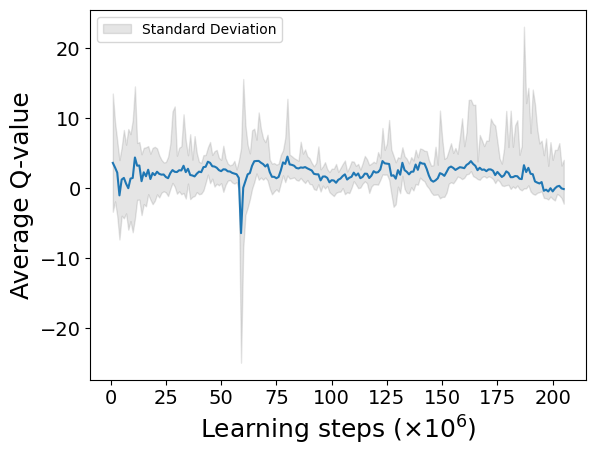

2024-07-30 11:45:16.245062: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 12:04:49.271284: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


so long waited in  7
day start to termianl : 44348.2

 time for simulate one day : 7423.1

average moving queuetime :  157.7 277.0
average stay queuetime :  656.5 1153.3
average total queuetime :  814.2 1430.3
average chargecount :  1.8 1.8
average ordercount :  40.6 40.6
[53, 6, 1, 5, 51, 48, 45, 68, 54, 81, 68, 38]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.5373397509413957
code start to now : 1020480.9
episode_reward :  -248.23235856931885
fit_count :  2057759
TD max = 48.35751195678711 TD min = 0.00010087618827815384
model updated

episode 112
day : 0


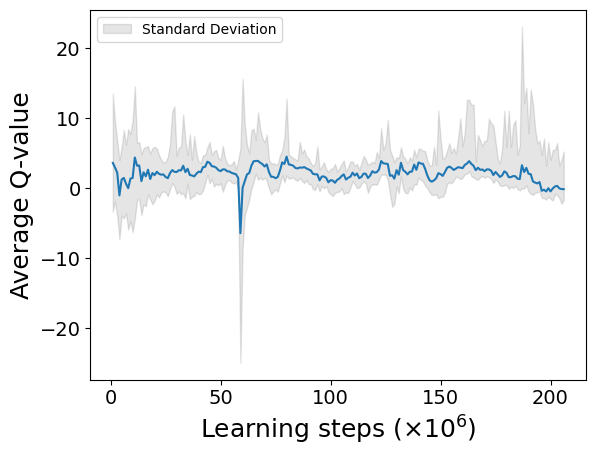

2024-07-30 13:09:46.488091: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:14:34.679641: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:34:14.071156: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:53:25.749001: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 13:58:53.040974: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


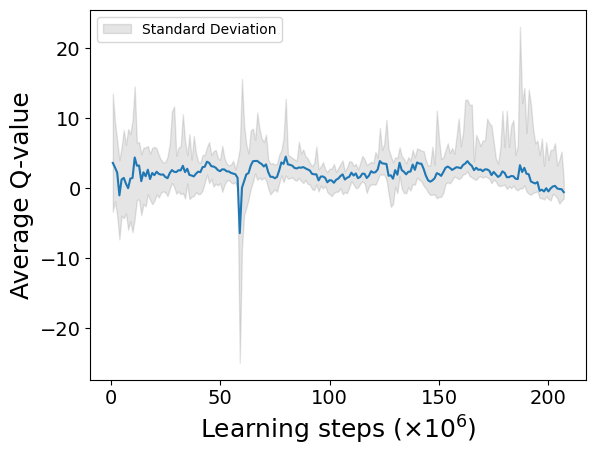

so long waited in  20
day start to termianl : 43129.2

 time for simulate one day : 6269.8

average moving queuetime :  154.2 260.6
average stay queuetime :  522.7 883.4
average total queuetime :  676.9 1144.0
average chargecount :  1.7 1.7
average ordercount :  40.4 40.4
[58, 2, 0, 2, 39, 25, 64, 75, 46, 59, 75, 24]
[4, 13, 12, 10, 8, 7, 7, 10, 16, 16, 9, 4]
cycle :  1.548488719427369
code start to now : 1026754.9
episode_reward :  -167.96918249453907
fit_count :  2070529
TD max = 27.649431665039057 TD min = 0.00010087618827815384
model updated

episode 113
day : 0


2024-07-30 14:10:28.045446: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:11:13.960326: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:26:30.610514: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 14:38:40.693970: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:03:58.237148: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled
2024-07-30 15:09:53.758402: W tensorflow/core/data/root_dataset.cc:247] Optimization loop failed: CANCELLED: Operation was cancelled


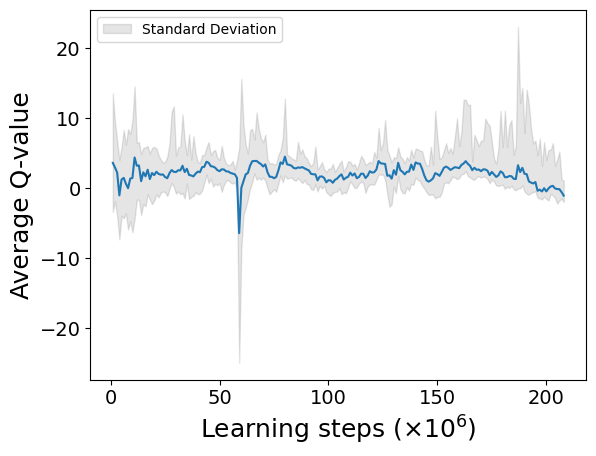


 time for simulate one day : 6284.1

average moving queuetime :  142.4 266.7
average stay queuetime :  850.1 1592.6
average total queuetime :  992.5 1859.3
average chargecount :  1.9 1.9
average ordercount :  40.2 40.2
day : 1


In [ ]:
star = tim.time()
for popul in range(100000):
    
#     fit_count = 0
    start = tim.time()
    print('\nepisode',popul)
    episode_reward = 0

    

    terminal = False
    tmp_terminal = False
    
    end_bike_n()
    bike_df = []
    for i in range(int(bike_n)):
        bike_df.append(pd.DataFrame(columns=['order_count', 'acc_dist', 'charge_count', 'queue_count', 'moving_queue_time', 'stay_queue_time','total_queue_time']))
    min_his_df = []
    soc_df = []
    #[self.key, bike_idx, self.queue[0][1], time - self.queue[0][1]]


    end_bike_n()

    day=0
    while terminal == False:
        sta = tim.time()
        
        print('day :',day)
        
        time = 0
        event_list=[]

        for i in range(len(bike)):
            event_list.append([0, bike[i], 'decide'])
        
        event_list = sorted(event_list)
        while len(event_list)>0:
#             print(len(event_list))

                
            
#             event_list = sorted(event_list)
#             print(event_list[0], event_list[0][1].key)
        

            time = event_list[0][0]
            if len(event_list[0])<4:
                getattr(event_list[0][1],event_list[0][2])()
            elif len(event_list[0])==4:
                getattr(event_list[0][1],event_list[0][2])(event_list[0][3])
            else:
                print('event_list length error')
            if terminal == True:
                break
#             time = event_list[0][0]

        print('\n time for simulate one day : %.1f'%(tim.time()-sta))
        end_day()
        tmp_df = copy.deepcopy(bike_df[0])
        for i in range(1,len(bike_df)):
            tmp_df +=bike_df[i]
        tmp_df = tmp_df/len(bike_df)
        tmp_chargecount = np.mean(tmp_df.iloc[:,2])
        tmp_queuetime1 = np.mean(tmp_df.iloc[:,4])
        tmp_queuetime2 = np.mean(tmp_df.iloc[:,5])
        tmp_queuetime3 = np.mean(tmp_df.iloc[:,6])
        tmp_ordercount = np.mean(tmp_df.iloc[:,0])
        print('\naverage moving queuetime : ',round(tmp_queuetime1/tmp_chargecount,1),round(tmp_df.iloc[-1,4],1))
        print('average stay queuetime : ',round(tmp_queuetime2/tmp_chargecount,1),round(tmp_df.iloc[-1,5],1))
        print('average total queuetime : ',round(tmp_queuetime3/tmp_chargecount,1),round(tmp_df.iloc[-1,6],1))
        print('average chargecount : ',round(tmp_chargecount,1),round(tmp_df.iloc[-1,2],1))
        print('average ordercount : ',round(tmp_ordercount,1),round(tmp_df.iloc[-1,0],1))
        del event_list
        if day == int(day_n):
            terminal = True
            tmp_terminal = True
        day += 1
            

#     with open(str(int(bike_n))+'bike'+str(int(day_n))+'days.pickle', 'wb') as f:
#         pickle.dump(bike_df, f)
#     with open(str(int(bike_n))+'min_his'+str(int(day_n))+'days.pickle', 'wb') as f:
#         pickle.dump(min_his_df, f)
#     with open(r'C:\Users\ysp\Dropbox\python_code\zentropy\algo5\\'+str(bike_n)+'soc_his'+str(day_n)+'days.pickle', 'wb') as f:
#         pickle.dump(soc_df, f)
    for i in range(len(min_his_df)):
        tmp_data = min_his_df[i]
        count = [0,0,0,0,0,0,0,0,0,0,0,0]
        for j in range(len(tmp_data)):
            for k in range(len(tmp_data[j])):
                if int(tmp_data[j][k][3]//3600) >11:
                    count[-1] +=1
                else:
                    count[int(tmp_data[j][k][3]//3600)] += 1
        print(count)
    print([4,13,12,10,8,7,7,10,16,16,9,4])
        
    cycle_sum = []
    for i in range(len(battery)):
        cycle_sum.append(battery[i].cycle)
    print('cycle : ',np.mean(cycle_sum))
    stop = tim.time()  
    print('code start to now : %.1f'%(stop - star))
    print('episode_reward : ', episode_reward)
    print('fit_count : ',fit_count)
    print('TD max =', np.max(TD_error_list), 'TD min =', np.min(TD_error_list))
    exploration_rate = 0.1-fit_count/10000000
    TD_max = np.max(TD_error_list[:int(9*len(TD_error_list)/10)])
    max_w_i = (len(D_memory)*TD_max/np.sum(TD_error_list))**(-beta)
    # if bike_n < 300:
    #     bike_n += 0.75
    if episode_reward > best_episode_reward:
        best_episode_reward = episode_reward
#         model.save('best_model(230).h5')
        model.save_weights("DCCDQN4EM(300).h5")
        print('best model updated')
        if episode_reward > 150:
            day_n+=0.25
#             bike_n+=0.5
    if day_n >30:
        day_n = 30
#     if bike_n >230:
#         bike_n=230
        
    
#     fit_count += 1
#         model2 = load_model('best_model.h5')
#         model2.compile(optimizer='rmsprop',loss=['mse'])
    if fit_count > 1000000:
        print('model updated')
        model2.set_weights(model.get_weights())

#     with open('D_often.pickle', 'wb') as f:
#         pickle.dump(D_often, f)
#     with open('D_sparse.pickle', 'wb') as f:
#         pickle.dump(D_sparse, f)
    

In [ ]:
event_list

In [ ]:
event_list

In [ ]:
bike

In [ ]:
event_list

In [ ]:
TD_max/np.sum(TD_error_list)

In [ ]:
len(TD_index)

In [ ]:
len(TD_error_list)

In [ ]:
for i in range(len(TD_error_list)):
    print(TD_error_list[i])

In [ ]:
len(TD_error_list)

In [ ]:
random.sample([1,2,3,4], counts=[30,10,1,1], k=3)

In [ ]:
for i in range(10):
    TD_index = np.arange(0,len(TD_error_list))
    choice = random.choices(TD_index, weights = TD_error_list)[0]
    print(choice)
    train = D_memory[choice]

    tmp=[]
    tmp.append(np.array([train[0][0:34]]))
    tmp.append(np.array([train[0][34:154]]))
    tmp.append(np.array([train[0][154:184]]))
    mask = masking(train[0])
    tmp.append(np.array([mask]))
    predicted1 = model.predict_on_batch(tmp).copy()
    print('battery: ',train[0][2],'action: ',train[1],'reward: ', train[2])
    print(predicted1)
    print(train[0][34:64])

In [ ]:
TD_index = np.arange(0,len(TD_error_list))
choice = random.choices(TD_index, weights = TD_error_list)[0]
print(choice)
train = D_memory[choice]

tmp=[]
tmp.append(np.array([train[3][0:64]]))
tmp.append(np.array([train[3][64:154]]))
tmp.append(np.array([train[3][154:184]]))

In [ ]:
train[3][2]

In [ ]:
train[3][35]

In [ ]:
mask = np.ones(31)
if train[3][2] < 0.05:
    mask[30] = 0
for i in range(30):
    if train[3][34+i] > 1:
        mask[i] = 0

In [ ]:
mask

In [ ]:
tmp

In [ ]:
len(TD_error_list)

In [ ]:
len(TD_index)

In [ ]:
model = load_model('current_model.h5')
model.compile(optimizer = 'rmsprop', loss='mse', metrics=['mae','mse'])

## 이어하기

In [ ]:
model = load_model('current_model.h5')
model.compile(optimizer='rmsprop',loss=['mse','mse'])

In [ ]:


star = tim.time()
for popul in range(100000):
    start = tim.time()
    print('\nepisode',popul)

    

    terminal = False
    
    end_bike_n()
    bike_df = []
    for i in range(bike_n):
        bike_df.append(pd.DataFrame(columns=['order_count', 'acc_dist', 'charge_count', 'queue_count', 'queue_time'], index = np.arange(0,day_n)).fillna(0))
    min_his_df = []
    soc_df = []
    #[self.key, bike_idx, self.queue[0][1], time - self.queue[0][1]]


    end_bike_n()

    day=0
    while terminal == False:
        sta = tim.time()
        
        print('day :',day)
        day += 1
        time = 0
        event_list=[]

        for i in range(len(bike)):
            event_list.append([0, bike[i], 'decide'])
        model.save('current_model.h5')
 
        model2 = model
        while time<43200:
            event_list = sorted(event_list)
        

            time = event_list[0][0]
            if len(event_list[0])<4:
                getattr(event_list[0][1],event_list[0][2])()
            elif len(event_list[0])==4:
                getattr(event_list[0][1],event_list[0][2])(event_list[0][3])
            else:
                print('event_list length error')
            if terminal == True:
                break
        print('\n time for simulate one day : ',tim.time()-sta)
            

        end_day()
        del event_list
        if day == day_n:
            terminal = True
            
    tmp_df = bike_df[0]
    for i in range(1,len(bike_df)):
        tmp_df +=bike_df[i]
    tmp_df = tmp_df/len(bike_df)
    tmp_chargecount = np.mean(tmp_df.iloc[:,2])
    tmp_queuetime = np.mean(tmp_df.iloc[:,4])
    print('average queuetime : ',tmp_queuetime)
    print('average chargecount : ',tmp_chargecount)

    with open(str(bike_n)+'bike'+str(day_n)+'days.pickle', 'wb') as f:
        pickle.dump(bike_df, f)
    with open(str(bike_n)+'min_his'+str(day_n)+'days.pickle', 'wb') as f:
        pickle.dump(min_his_df, f)
#     with open(r'C:\Users\ysp\Dropbox\python_code\zentropy\algo5\\'+str(bike_n)+'soc_his'+str(day_n)+'days.pickle', 'wb') as f:
#         pickle.dump(soc_df, f)
        
    cycle_sum = []
    for i in range(len(battery)):
        cycle_sum.append(battery[i].cycle)
    print('cycle : ',np.mean(cycle_sum))
    stop = tim.time()  
    print('code start to terminal : %.1f'%(stop - star))





In [ ]:
from keras.models import load_model

In [ ]:
model.summary()